<a href="https://colab.research.google.com/github/Sandracp27/Sandra_Cardona_Proyecto_03_ST/blob/main/Sandra_Cardona_Proyecto_03_ST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Proyecto 03 - Series de Tiempo

## Dataset: Flujo Vehicular por Unidades de Peaje AUSA

**Recuerda descargar el dataset de [aquí](https://data.buenosaires.gob.ar/dataset/flujo-vehicular-por-unidades-peaje-ausa). Deberás descargar -  al menos para comenzar - los años 2017, 2018 y 2019.**

En este notebook te dejamos unas celdas para que puedas comenzar a trabajar con este dataset para los años 2017, 2018 y 2019. Si deseas utilizar otros años, ten en cuenta que deberás hacer el preprocesamiento correspondiente, ya que la estructura de los datos puede variar.

**Importante:** Para el proyecto, debes comenzar con los datos de la autopista Illia, pago en Efectivo.

### Exploración de datos

Dedícale un buen tiempo a hacer un Análisis Exploratorio de Datos. Elige preguntas que creas que puedas responder con este dataset. Por ejemplo, ¿Cuáles son los días y horarios de mayor tráfico? También, estudia autocorrelaciones, resampleos, etc.

#### Componentes de la serie

1. Calcula las componentes estacionales y tendencia de la serie. Interpreta los resultados, si es necesario con información auxiliar (por fuera del dataset) o elementos del dataset que no estés utilizando (por ejemplo, si la tendencia es negativa, ¿puede ser porque se migre a otras formas de pago?).
1. ¿La serie posee valores atípicos? Si es así, interpreta, si es necesario con información auxiliar. **Pista**: primer semestre 2019.

### Predicción a Futuro

Debes implementar un modelo que prediga el tráfico en la autopista Illia para el último trimestre del 2019. 

1. Haz todas las transformaciones de datos que consideres necesarias. Justifica.
1. Evalúa de forma apropiada tus resultados. Justifica la métrica elegida.
1. Elige un modelo benchmark y compara tus resultados con este modelo.
1. Optimiza los hiperparámetros de tu modelo. 
1. Intenta responder la pregunta: ¿Qué información está usando el modelo para predecir?
1. Utiliza el modelo creado para predecir el tráfico en el año 2020. ¿Cómo funciona?
1. Si lo deseas, puedes agregar información de años anteriores a 2017. ¿Mejoran los resultados?

### Para pensar, investigar y, opcionalmente, implementar
1. ¿Cómo incorporarías la información sobre tipo de vehículo, forma de pago, sentido, día de la semana, etc.? En lo que respecta a las predicciones, ¿mejoran o empeoran?
1. ¿Qué ocurre si comparas las series de tiempo entre distintas estaciones de peajes?¿Tienen el mismo comportamiento o hay alguna que sea distinta a las otras? Si es así, ¿hay información auxiliar que te ayude a explicar lo que encuentras?
1. ¿Hay algo que te gustaría investigar o probar?

### **¡Tómate tiempo para investigar y leer mucho!**

### 1. Preparación del Dataset

In [651]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import datetime
from statsmodels import tsa
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import statsmodels.api as sm 
from pylab import rcParams
from statsmodels.tsa.stattools import adfuller

from statsmodels.tsa.arima_model import ARIMA
!pip install pmdarima
from pmdarima import auto_arima
from fbprophet import Prophet
from fbprophet.plot import add_changepoints_to_plot

from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV, TimeSeriesSplit
from sklearn.ensemble import RandomForestRegressor

# Configuración warnings
import warnings
warnings.filterwarnings('ignore') # Para evitar los molestos avisoss

In [652]:
from google.colab import drive
drive.mount('/content/drive')
!ls /content/drive/MyDrive/Proyectos/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
'Copia de DS_Proyecto_03_NLP.ipynb'
 dataset_es_dev.json
 dataset_es_test.json
 dataset_es_train.json
 DS_Proyecto_01_Datos_Properati.csv
 DS_Proyecto_03_SR.ipynb
'DS - Sprint Proyect 1_ Primer Modelo de Machine Learning.docx'
 flujo-vehicular-2015.csv
 flujo-vehicular-2016.csv
 flujo-vehicular-2017.csv
 flujo-vehicular-2018.csv
 flujo-vehicular-2019.csv
 flujo-vehicular-2020.csv
 flujo-vehicular-2021.csv
'modificacion 10 barrios SandraCardona Proyecto2.ipynb'
'modificacion imputando y codificando m2 SandraCardona Proyecto2.ipynb'
 SandraCardonaPizarro_Proyecto1.ipynb
'SandraCardona Proyecto2.ipynb'


## **Exploración de datos**

Una serie de tiempo es una secuencia de datos ordenados en el tiempo tomados en intervalos de tiempo igualmente espaciados. La frecuencia de los puntos de datos registrados puede ser por segundos, minustos, hora, diaria, semanal, mensual, trimestral y anual.

**a.** **Explora la fuente de datos: ¿Que representa el dataset?, ¿Hay información sobre las columnas.?** 

In [653]:
data_2019 = pd.read_csv('/content/drive/MyDrive/Proyectos/flujo-vehicular-2019.csv', sep =',')
data_2018 = pd.read_csv('/content/drive/MyDrive/Proyectos/flujo-vehicular-2018.csv', sep =',')
data_2017 = pd.read_csv('/content/drive/MyDrive/Proyectos/flujo-vehicular-2017.csv', sep =',')

##### Podemos decir entonces que los años 2017, 2018 y 2019 tienen las siguientes columnas con la siguiente información:

**periodo**: año del dset 

**fecha**: año dia mes

**hora_inicio** hora de inicio de la cuenta de vehiculos (DROP)

**hora_fin** hora de fin de la cuenta de vehiculos (Vamos a usar esta para tomar la hora)

**dia**: dia de la semana 

**estacion**: estaciones de peaje, difieren levemente entre los años (Dellepiane se unifica en 2019, antes habia Dellepiane Liniers y Centro, y se agrega PDB)

**sentido**: Centro o Provincia

**tipo_vehiculo**: Liviano o Pesado

**forma_pago**: Hay varias y varian entre los años.

**cantidad_pasos**: Cantidad de vehiculos

In [654]:
data_2017.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1372645 entries, 0 to 1372644
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   periodo         1372645 non-null  int64 
 1   fecha           1372645 non-null  object
 2   hora_inicio     1372645 non-null  int64 
 3   hora_fin        1372645 non-null  int64 
 4   dia             1372645 non-null  object
 5   estacion        1372645 non-null  object
 6   sentido         1372645 non-null  object
 7   tipo_vehiculo   1372645 non-null  object
 8   forma_pago      1372645 non-null  object
 9   cantidad_pasos  1372645 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 104.7+ MB


In [655]:
data_2017.head()

,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2017,2017-01-01,0,1,Domingo,Alberdi,Centro,Liviano,NO COBRADO,25
1,2017,2017-01-01,0,1,Domingo,Alberdi,Centro,Liviano,TELEPASE,7
2,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,NO COBRADO,5
3,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,EFECTIVO,2
4,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,EFECTIVO,94


In [656]:
data_2018.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1375908 entries, 0 to 1375907
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   periodo         1375908 non-null  int64 
 1   fecha           1375908 non-null  object
 2   hora_inicio     1375908 non-null  int64 
 3   hora_fin        1375908 non-null  int64 
 4   dia             1375908 non-null  object
 5   estacion        1375908 non-null  object
 6   sentido         1375908 non-null  object
 7   tipo_vehiculo   1375908 non-null  object
 8   forma_pago      1375908 non-null  object
 9   cantidad_pasos  1375908 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 105.0+ MB


In [657]:
data_2018.head()

,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2018,2018-01-01,0,1,Lunes,Alberdi,Centro,Liviano,NO COBRADO,29
1,2018,2018-01-01,0,1,Lunes,Alberdi,Centro,Liviano,TELEPASE,9
2,2018,2018-01-01,1,2,Lunes,Alberdi,Centro,Liviano,NO COBRADO,73
3,2018,2018-01-01,1,2,Lunes,Alberdi,Centro,Liviano,TELEPASE,39
4,2018,2018-01-01,2,3,Lunes,Alberdi,Centro,Liviano,NO COBRADO,115


In [658]:
data_2019.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 812153 entries, 0 to 812152
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   periodo         812153 non-null  int64 
 1   fecha           812153 non-null  object
 2   hora_inicio     812153 non-null  int64 
 3   hora_fin        812153 non-null  int64 
 4   dia             812153 non-null  object
 5   estacion        812153 non-null  object
 6   sentido         812153 non-null  object
 7   tipo_vehiculo   812153 non-null  object
 8   forma_pago      812153 non-null  object
 9   cantidad_pasos  812153 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 62.0+ MB


In [659]:
data_2019.head()

,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2019,2019-01-01,0,1,Martes,Alberti,Centro,Liviano,NO COBRADO,22
1,2019,2019-01-01,0,1,Martes,Alberti,Centro,Liviano,TELEPASE,6
2,2019,2019-01-01,0,1,Martes,Alberti,Provincia,Liviano,NO COBRADO,53
3,2019,2019-01-01,0,1,Martes,Alberti,Provincia,Liviano,TELEPASE,18
4,2019,2019-01-01,0,1,Martes,Avellaneda,Centro,Liviano,EFECTIVO,16


Como podemos ver en la salida, el resumen incluye una lista de todas las columnas con sus tipos de datos y el número de valores no nulos en cada columna.
La columna fecha se ha almacenado como string. Para convertirla en datetime, se empleara la función **pd.to_datetime()** mas adelante.
Ademas se puede observar que en el 2019 hubo menos datos de 500 mil datos de diferencia con respecto al año anterior.

Se va a mirar que valores toman los campos **estacion, sentido, tipo_vehiculo y forma_pago**

* **Estaciones**

In [660]:
print('\nEstaciones en 2019')
print(data_2019['estacion'].unique())
print('\nEstaciones en 2018')
print(data_2018['estacion'].unique())
print('\nEstaciones en 2017')
print(data_2017['estacion'].unique())


Estaciones en 2019
['Alberti' 'Avellaneda' 'Dellepiane' 'Illia' 'Retiro' 'Salguero'
 'Sarmiento' 'PDB']

Estaciones en 2018
['Alberdi' 'Avellaneda' 'Dellepiane Centro' 'Dellepiane Liniers' 'Illia'
 'Retiro' 'Salguero' 'Sarmiento']

Estaciones en 2017
['Alberdi' 'Avellaneda' 'Dellepiane Centro' 'Dellepiane Liniers' 'Illia'
 'Retiro' 'Salguero' 'Sarmiento']


* **Sentido**

In [661]:
print('Sentido en 2019')
print(data_2019['sentido'].unique())
print('\nSentido en 2018')
print(data_2018['sentido'].unique())
print('\nSentido en 2017')
print(data_2017['sentido'].unique())

Sentido en 2019
['Centro' 'Provincia']

Sentido en 2018
['Centro' 'Provincia']

Sentido en 2017
['Centro' 'Provincia']


* **Tipo de vehículo**

In [662]:
print('Tipo de Vehículo en 2019')
print(data_2019['tipo_vehiculo'].unique())
print('\nTipo de Vehículo en 2018')
print(data_2018['tipo_vehiculo'].unique())
print('\nTipo de Vehículo en 2017')
print(data_2017['tipo_vehiculo'].unique())

Tipo de Vehículo en 2019
['Liviano' 'Pesado']

Tipo de Vehículo en 2018
['Liviano' 'Pesado']

Tipo de Vehículo en 2017
['Liviano' 'Pesado']


* **Forma de pago**

In [663]:
print('Forma de Pago en 2019')
print(data_2019['forma_pago'].unique())
print('\nForma de Pago en 2018')
print(data_2018['forma_pago'].unique())
print('\nForma de Pago en 2017')
print(data_2017['forma_pago'].unique())

Forma de Pago en 2019
['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'EXENTO' 'INFRACCION'
 'T. DISCAPACIDAD']

Forma de Pago en 2018
['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'EXENTO' 'TARJETA DISCAPACIDAD'
 'INFRACCION']

Forma de Pago en 2017
['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'TARJETA DISCAPACIDAD' 'EXENTO'
 'INFRACCION' 'MONEDERO' 'Otros']


In [664]:
#Unimos los 3 datasets, podemos hacerlo asi directamente ya que tienen las mismas columnas
dataset = pd.concat([data_2017, data_2018, data_2019])

In [665]:
dataset.columns

Index(['periodo', 'fecha', 'hora_inicio', 'hora_fin', 'dia', 'estacion',
       'sentido', 'tipo_vehiculo', 'forma_pago', 'cantidad_pasos'],
      dtype='object')

**b.** **Realiza un analisis exploratorio que incluya:**
* Explora el head y tail del dataset.
* Calcula del tamaño.
* Calcula los principales estadisticos de las columnas: media, desviación estandar, etc.
* Calcula los nulos.
* Si consideras que agrega valor informativo, agrega algún grafico.

* **Explora el head y tail del dataset.**

El Dataset abarca desde el 1 de enero de 2017 hasta el 31 de diciembre de 2019. Para ver los datos, se utilizan los métodos head() y tail() que muestran las primeras y las últimas filas del dataset.

In [666]:
dataset.head()

,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2017,2017-01-01,0,1,Domingo,Alberdi,Centro,Liviano,NO COBRADO,25
1,2017,2017-01-01,0,1,Domingo,Alberdi,Centro,Liviano,TELEPASE,7
2,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,NO COBRADO,5
3,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,EFECTIVO,2
4,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,EFECTIVO,94


In [667]:
dataset.tail()

,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
812148,2019,2019-12-31,23,0,Martes,Salguero,Provincia,Liviano,NO COBRADO,7
812149,2019,2019-12-31,23,0,Martes,Salguero,Provincia,Liviano,TELEPASE,4
812150,2019,2019-12-31,23,0,Martes,Salguero,Provincia,Pesado,NO COBRADO,1
812151,2019,2019-12-31,23,0,Martes,Sarmiento,Provincia,Liviano,NO COBRADO,7
812152,2019,2019-12-31,23,0,Martes,Sarmiento,Provincia,Liviano,TELEPASE,7


* **Calcula del tamaño.**


In [668]:
print(dataset.shape)
dataset.columns

(3560706, 10)


Index(['periodo', 'fecha', 'hora_inicio', 'hora_fin', 'dia', 'estacion',
       'sentido', 'tipo_vehiculo', 'forma_pago', 'cantidad_pasos'],
      dtype='object')

* **Calcula los principales estadisticos de las columnas: media, desviación estandar, etc.**

Por medio del metodo **describe()** observamos los datos estadísticos que nos brinda pandas.

In [669]:
dataset.describe()

,periodo,hora_inicio,hora_fin,cantidad_pasos
count,3.560706e+06,3.560706e+06,3.560706e+06,3.560706e+06
mean,2.017843e+03,1.195313e+01,1.207470e+01,1.052144e+02
std,7.673381e-01,6.583099e+00,6.651320e+00,3.206278e+02
min,2.017000e+03,0.000000e+00,0.000000e+00,1.000000e+00
25%,2.017000e+03,7.000000e+00,7.000000e+00,2.000000e+00
50%,2.018000e+03,1.200000e+01,1.200000e+01,8.000000e+00
75%,2.018000e+03,1.700000e+01,1.800000e+01,3.400000e+01
max,2.019000e+03,2.300000e+01,2.300000e+01,6.677000e+03


Son un total de 3560706 registros, la media de la cantidad_pasos es de 105.21444539369439 y un desvío de 320.62782380683035, es decir que por lo general estaremos entre -215.41 y 425.84 cantidad de pasos.



* **Promedio**

In [670]:
mean_illia = dataset.cantidad_pasos.mean()
print(mean_illia)

105.21444539369439


* **Desviación estandar**

In [671]:
std_illia = dataset.cantidad_pasos.std()
print(std_illia)

320.62782380683035


El promedio de vechiculos por hora es de 105, y la desviación estandar 320.

* **Calcula los nulos**

Uno de los primeros análisis que hay que realizar al trabajar con series de tiempo es verificar si la serie está completa.

Con la función **isna().sum()** evaluamos si existen valores nulos.

In [672]:
print('Valores faltantes por columnas:')
dataset.isna().sum()

Valores faltantes por columnas:


periodo           0
fecha             0
hora_inicio       0
hora_fin          0
dia               0
estacion          0
sentido           0
tipo_vehiculo     0
forma_pago        0
cantidad_pasos    0
dtype: int64

No se observan valores nulos

* **Si consideras que agrega valor informativo, agrega algún grafico.**

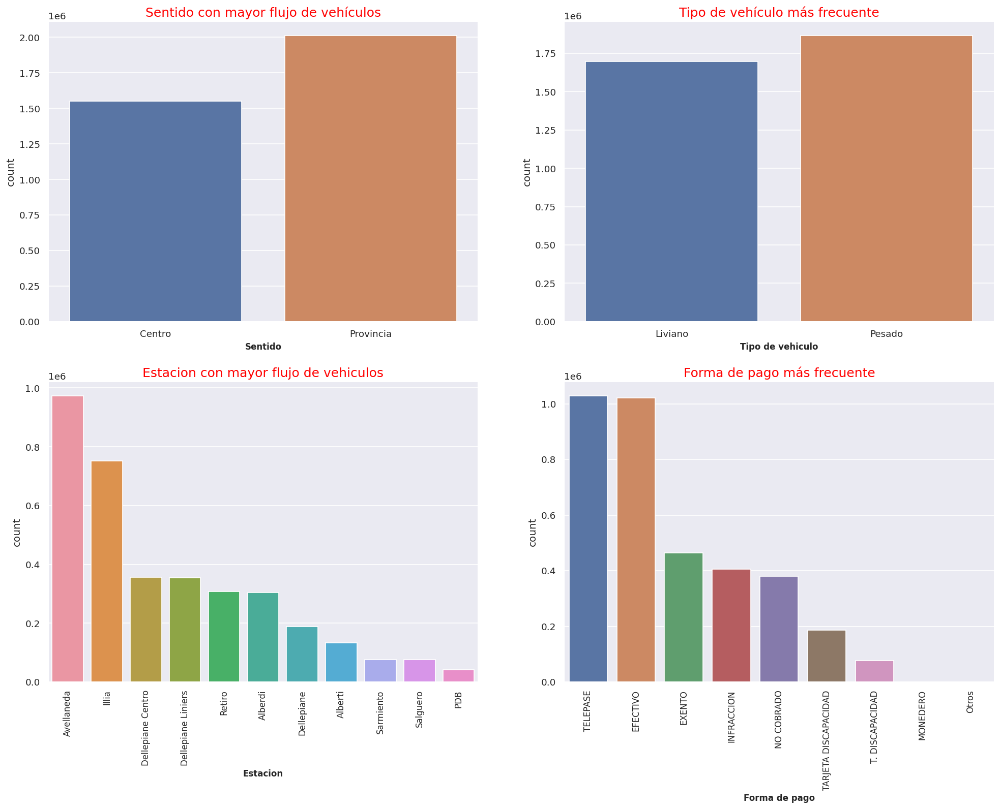

In [673]:
plt.figure(figsize=(20,30))
plt.subplot(4,2,1)
sns.countplot(data = dataset, x = "sentido")
plt.title("Sentido con mayor flujo de vehículos", size = 15, color='red')
plt.xlabel("Sentido", fontweight = "black", fontsize = 10)
plt.subplot(4,2,2)
sns.countplot(data = dataset, x = "tipo_vehiculo")
plt.title("Tipo de vehículo más frecuente", size = 15, color='red')
plt.xlabel("Tipo de vehiculo", fontweight = "black", fontsize = 10)
plt.subplot(4,2,3)
sns.countplot(data = dataset, x = "estacion" ,order = dataset.estacion.value_counts().index)
plt.title("Estacion con mayor flujo de vehiculos", size = 15, color='red')
plt.xlabel("Estacion", fontweight = "black", fontsize = 10)
plt.xticks(rotation=90, size=10)
plt.subplot(4,2,4)
sns.countplot(data = dataset, x = 'forma_pago',order = dataset.forma_pago.value_counts().index)
plt.title("Forma de pago más frecuente", size = 15, color='red')
plt.xlabel("Forma de pago", fontweight = "black", fontsize = 10)
plt.xticks(rotation=90, size=10)
plt.show()

In [674]:
sentido  =pd.DataFrame(dataset["sentido"].value_counts())
sentido

,sentido
Provincia,2010855
Centro,1549851


In [675]:
Tipo_vehiculo =pd.DataFrame(dataset["tipo_vehiculo"].value_counts())
Tipo_vehiculo

,tipo_vehiculo
Pesado,1864314
Liviano,1696392


In [676]:
Estacion =pd.DataFrame(dataset["estacion"].value_counts())
Estacion

,estacion
Avellaneda,972656
Illia,752552
Dellepiane Centro,356885
Dellepiane Liniers,353680
Retiro,307528
Alberdi,303620
Dellepiane,187600
Alberti,132279
Sarmiento,76634
Salguero,76308


In [677]:
Forma_pago =pd.DataFrame(dataset["forma_pago"].value_counts())
Forma_pago

,forma_pago
TELEPASE,1027861
EFECTIVO,1020176
EXENTO,464708
INFRACCION,405034
NO COBRADO,380450
TARJETA DISCAPACIDAD,186454
T. DISCAPACIDAD,76001
MONEDERO,14
Otros,8


Tanto en los graficos como en las tablas se puede observar que la mayor cantidad de flujo vehicular se da en el sentido de provincia y el tipo vehicular que mas circula es el pesado, adicionalmente se puede observar las estaciones en orden descendente que cuentan con mayor flujo de vehiculos, en primer lugar esta Avellaneda, seguido de Illia el cual va ser la estanción objeto de nuestro estudio y la forma de pago mas frecuente son el telepase y el efectivo.


* **Es necesario hacer alguna transformación de datos?. ¿Hay nulos o columnas que no aportan información?.**

Como se vio anteriormente el dataset no contiene valores nulo y solo se va a trabajar con la estación **Illia** y la forma de pago **Efectivo**


* Primero se va a determinar la cantidad de flujo vehicular por la autopista Illia y si realizaron un pago en efectivo en cada uno de los años:

In [678]:
print('Año 2017:')
print('Todos los medios de pago:',(data_2017[data_2017["estacion"] == "Illia"].cantidad_pasos.count()))
print('Pago en efectivo:',(data_2017[(data_2017["estacion"] == "Illia") & (data_2017["forma_pago"] == "EFECTIVO")].cantidad_pasos.count()))

Año 2017:
Todos los medios de pago: 291900
Pago en efectivo: 104230


In [679]:
print('Año 2018:')
print('Todos los medios de pago:',(data_2018[data_2018["estacion"] == "Illia"].cantidad_pasos.count()))
print('Pago en efectivo:',(data_2018[(data_2018["estacion"] == "Illia") & (data_2018["forma_pago"] == "EFECTIVO")].cantidad_pasos.count()))

Año 2018:
Todos los medios de pago: 299519
Pago en efectivo: 99996


In [680]:
print('Año 2019:')
print('Todos los medios de pago:',(data_2019[data_2019["estacion"] == "Illia"].cantidad_pasos.count()))
print('Pago en efectivo:',(data_2019[(data_2017["estacion"] == "Illia") & (data_2019["forma_pago"] == "EFECTIVO")].cantidad_pasos.count()))

Año 2019:
Todos los medios de pago: 161133
Pago en efectivo: 32354


Se puede observar que en el 2019 hay una disminución de mas del 50% de la cantidad de pasos para todos los medios de pago y, en efectivo sólo hay un 33% de pasos registrados respecto al año anterio

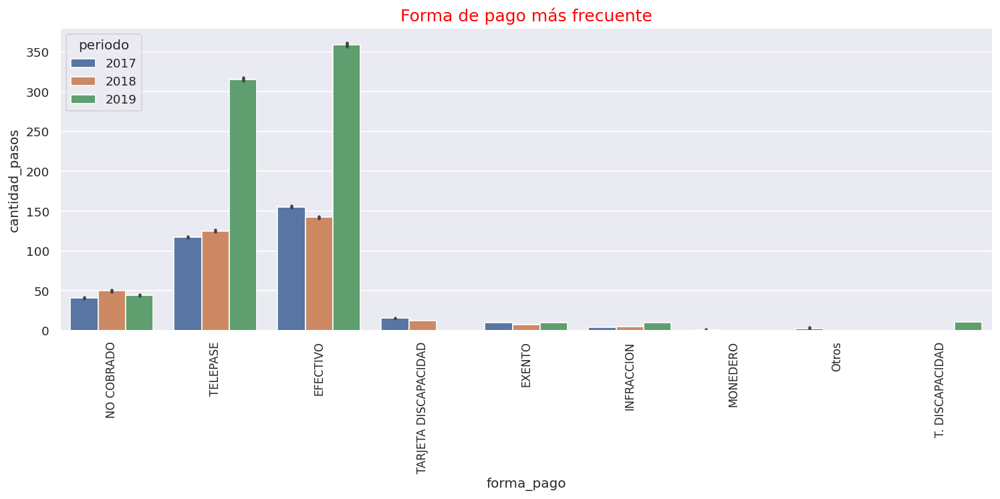

In [681]:
plt.figure(figsize=(15,5))
sns.barplot(x = "forma_pago", y = "cantidad_pasos", hue = "periodo", data = dataset)
plt.title("Forma de pago más frecuente", size = 15, color='red')
plt.xticks(rotation=90, size=10)
plt.show()

Con el grafico se puede observar que las modalidades de pago de telepase y en efectivo se incrementaron considerablemente en el año 2019.

In [682]:
#Nos quedamos solamente con la estación Illia y la forma de pago Efectivo
mask = np.logical_and(dataset.estacion=='Illia', dataset.forma_pago == 'EFECTIVO')
dataset = dataset[mask]

dataset.head()

,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
1750,2017,2017-01-01,0,1,Domingo,Illia,Centro,Liviano,EFECTIVO,1
1755,2017,2017-01-01,1,2,Domingo,Illia,Centro,Liviano,EFECTIVO,10
1757,2017,2017-01-01,1,2,Domingo,Illia,Centro,Liviano,EFECTIVO,783
1761,2017,2017-01-01,1,2,Domingo,Illia,Centro,Pesado,EFECTIVO,3
1764,2017,2017-01-01,2,3,Domingo,Illia,Centro,Liviano,EFECTIVO,14


In [683]:
#Quitamos las columnas que no vamos a utilizar
dataset.drop(columns = ['periodo','hora_inicio','forma_pago', 'estacion'], inplace = True)
dataset.head()

,fecha,hora_fin,dia,sentido,tipo_vehiculo,cantidad_pasos
1750,2017-01-01,1,Domingo,Centro,Liviano,1
1755,2017-01-01,2,Domingo,Centro,Liviano,10
1757,2017-01-01,2,Domingo,Centro,Liviano,783
1761,2017-01-01,2,Domingo,Centro,Pesado,3
1764,2017-01-01,3,Domingo,Centro,Liviano,14


In [684]:
dataset.shape

(238869, 6)

No se va a tener en cuenta
* **Periodo:** el cual es el año y esta variable ya se encuentra incluida en la variable fecha.
* Hora_inicio: se va a tomar la hora de referencia la hora_fin
* Estación: porque solo se va a trabajar con la estación Illia.
* Forma_pago: solo se va a tomar el pago en efectivo.

**d.** **Elige cuáles de las siguientes transformaciones de datos son apropiadas para su dataset.**

* Detección y eliminación de Outliers
* Encoding
* Imputación de valores faltantes
* Escalado de datos
* Generación de nuevas variables predictoras/reducción de dimensionalidad (SVD/PCA)

Para resolver este problema las transformaciones que aplican son detección y eliminación de Outliers y el de imputación de valores faltantes.

## **Transformación a datetime**

Con los datos del dataframe, generamos una columna de tipo datetime mediante la función **to_datetime()** infiere automáticamente un formato de fecha/hora.

In [685]:
#Pasamos la columna fecha a formato datetime, y le unimos la hora_fin como hora
dataset['fecha2'] = pd.to_datetime(dataset.fecha) + pd.to_timedelta(dataset.hora_fin, unit = 'h')

#Quitamos las columnas fecha y hora_fin ya que las incluimos en el campo fecha2
dataset.drop(columns=['fecha','hora_fin'], inplace = True)

dataset.head()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha2
1750,Domingo,Centro,Liviano,1,2017-01-01 01:00:00
1755,Domingo,Centro,Liviano,10,2017-01-01 02:00:00
1757,Domingo,Centro,Liviano,783,2017-01-01 02:00:00
1761,Domingo,Centro,Pesado,3,2017-01-01 02:00:00
1764,Domingo,Centro,Liviano,14,2017-01-01 03:00:00


In [686]:
#Corregimos el nombre de fecha2 a fecha
dataset.rename(columns = {'fecha2':'fecha'}, inplace = True) 
dataset.head()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
1750,Domingo,Centro,Liviano,1,2017-01-01 01:00:00
1755,Domingo,Centro,Liviano,10,2017-01-01 02:00:00
1757,Domingo,Centro,Liviano,783,2017-01-01 02:00:00
1761,Domingo,Centro,Pesado,3,2017-01-01 02:00:00
1764,Domingo,Centro,Liviano,14,2017-01-01 03:00:00


In [687]:
#Reordenamos el dataset por fecha
dataset.sort_values('fecha', inplace = True)
dataset.reset_index(drop=True, inplace = True)
dataset

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
0,Domingo,Provincia,Pesado,1,2017-01-01 00:00:00
1,Domingo,Provincia,Pesado,1,2017-01-01 00:00:00
2,Domingo,Provincia,Pesado,6,2017-01-01 00:00:00
3,Domingo,Provincia,Liviano,644,2017-01-01 00:00:00
4,Domingo,Centro,Liviano,23,2017-01-01 00:00:00
...,...,...,...,...,...
238864,Martes,Centro,Pesado,2,2019-12-31 22:00:00
238865,Martes,Provincia,Liviano,556,2019-12-31 22:00:00
238866,Martes,Provincia,Pesado,1,2019-12-31 22:00:00
238867,Martes,Centro,Liviano,214,2019-12-31 23:00:00


In [688]:
dataset.dtypes

dia                       object
sentido                   object
tipo_vehiculo             object
cantidad_pasos             int64
fecha             datetime64[ns]
dtype: object

## **Exploración gráfica**

* **Realiza al menos 2 graficos que aporten información para el entendimiento e interpretación de los datos.**

Una operación fundamental para entender el comportamiento de una serie de tiempo es realizar gráficos de la misma, esto permite identificar patrones tales como:
* **Estacionalidad:** ¿los datos muestran un patrón periódico claro?
* **Tendencia:** ¿los datos siguen una pendiente constante hacia arriba o hacia abajo?
* **Ruido:** ¿hay puntos atípicos o valores perdidos que no son consistentes con el resto de los datos? 

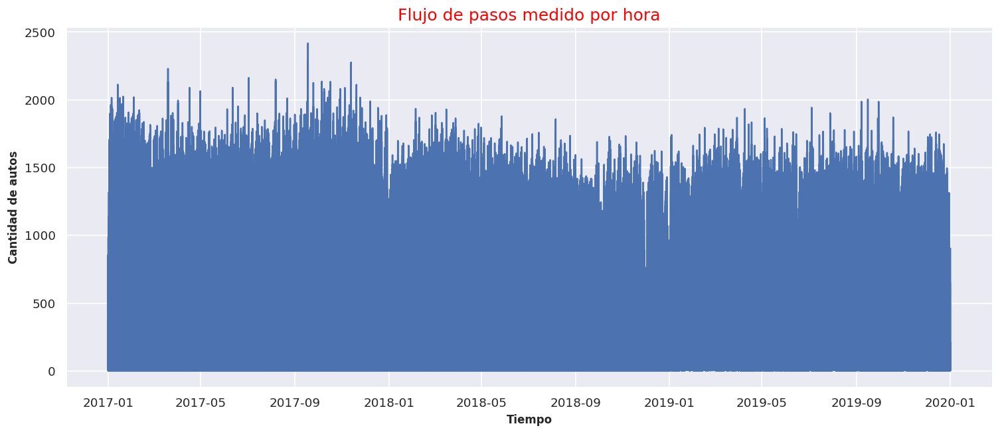

In [689]:
#Graficamos nuestros datos, tal como están
plt.figure(figsize = (15,6))
plt.plot(dataset.fecha, dataset.cantidad_pasos)
plt.xlabel('Tiempo', fontweight = "black", fontsize = 10)
plt.ylabel('Cantidad de autos', fontweight = "black", fontsize = 10)
plt.title("Flujo de pasos medido por hora",  fontsize= 15 , color='red')
plt.show()

En el grafico anterior no se puede apreciar la serie de tiempo el cual se ve muy saturada debido a que se tiene registros con una frecuencia por hora en un dataset de 3 años, se va a pasar la serie de tiempo a diaria para ver si se logra apreciar mejor .

* **¿Cuáles son los días y horarios de mayor tráfico?**

In [690]:
trafico= dataset[dataset.cantidad_pasos>=(dataset.cantidad_pasos.mean()+ dataset.cantidad_pasos.std())]
trafico

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
3,Domingo,Provincia,Liviano,644,2017-01-01 00:00:00
5,Domingo,Centro,Liviano,857,2017-01-01 00:00:00
16,Domingo,Centro,Liviano,783,2017-01-01 02:00:00
21,Domingo,Centro,Liviano,988,2017-01-01 03:00:00
22,Domingo,Provincia,Liviano,704,2017-01-01 03:00:00
...,...,...,...,...,...
238850,Martes,Provincia,Liviano,643,2019-12-31 18:00:00
238855,Martes,Provincia,Liviano,640,2019-12-31 19:00:00
238858,Martes,Provincia,Liviano,773,2019-12-31 20:00:00
238860,Martes,Centro,Liviano,799,2019-12-31 21:00:00


In [691]:
trafico.groupby('dia').agg({'cantidad_pasos':[np.sum, np.mean]}).sort_values([('cantidad_pasos','sum')], ascending= False)

cantidad_pasos             
                     sum         mean
dia                                  
Viernes          6260472  1215.153727
Jueves           5892907  1189.765193
Miércoles        5674526  1162.336338
Martes           5442516  1136.224635
Lunes            5225756  1104.577468
Sábado           5182949  1067.988667
Domingo          4299132  1024.090519

Podemos observar en la tabla que el día con mayor flujo vehicular son los viernes con una cantidad de vehiculo de 6260472	y un promedio de 1215.153727.

In [692]:
trafico.groupby('fecha').agg({'cantidad_pasos':[np.sum, np.mean]}).sort_values([('cantidad_pasos','sum')], ascending= False)

cantidad_pasos        
                               sum    mean
fecha                                     
2017-10-05 18:00:00           3842  1921.0
2017-10-13 15:00:00           3794  1897.0
2017-11-17 14:00:00           3738  1869.0
2017-12-07 16:00:00           3726  1863.0
2017-10-13 16:00:00           3629  1814.5
...                            ...     ...
2019-10-24 23:00:00            604   604.0
2018-03-10 00:00:00            604   604.0
2018-02-12 09:00:00            604   604.0
2017-04-09 11:00:00            604   604.0
2017-03-04 00:00:00            604   604.0

[17658 rows x 2 columns]

El dia con mayor cantidad de vehiculos fue el 2017-10-05  a las 18:00 con un flujo vehicular de 3842 y un promedio alrededor de 19210 carros.

# **Serie de tiempo - EDA - Frecuencia Diaria**

Los datos que se han utilizado hasta ahora tienen una frecuencia por hora, se va a utilizar los datos con otra frecuencia para esto se va a remuestrear utilizando el método **resample,** (lo que busca es agrupar la variable em diferentes periodos de tiempo). A menudo es útil aplicar el remuestreo en datos de series temporales a una frecuencia más baja o más alta. El remuestreo a una frecuencia más baja (submuestreo) generalmente implica una operación de recolección o sumatoria y el remuestreo a una frecuencia más alta (sobremuestreo) a menudo, implica la interpolación, aproximación u otro método de llenado de datos.

En este caso se va agrupar los datos por dia para lograr una visualización mas amigable.

In [693]:
diario = dataset.resample('D', on = 'fecha').sum().astype("float64")
print(diario.shape)

(1095, 1)


In [694]:
diario.columns

Index(['cantidad_pasos'], dtype='object')

In [695]:
diario.head()

,cantidad_pasos
fecha,
2017-01-01,31183.0
2017-01-02,51568.0
2017-01-03,51093.0
2017-01-04,53332.0
2017-01-05,56486.0



A continuación exploramos los 10 días con mayor flujo vehicular:

In [696]:
top_dia = diario.sort_values('cantidad_pasos', ascending=False)
top_dia.head(10)

,cantidad_pasos
fecha,
2017-12-07,63127.0
2017-11-24,61594.0
2017-10-13,61421.0
2017-11-10,61382.0
2017-11-17,61259.0
2017-10-06,61099.0
2017-12-01,60985.0
2017-12-15,60280.0
2017-01-13,59651.0


El día como mayor flujo vehicular fue el día 2017-12-07

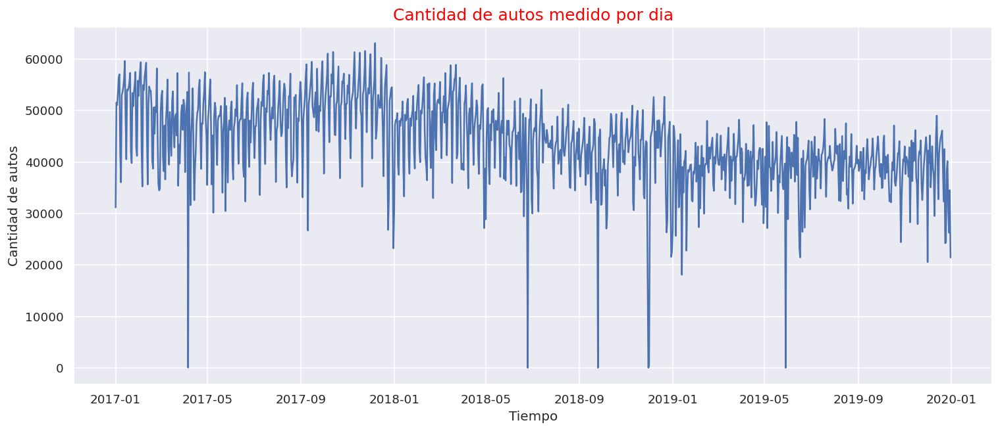

In [697]:
plt.figure(figsize = (15,6))
plt.plot(diario.index, diario.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos')
plt.title("Cantidad de autos medido por dia",  fontsize= 15 , color='red')
plt.show()

En el grafico no se observa estacionalidad, se ve que hay una leve tendencia negativa que mas adelante la confirmaremos, tambien se puede apreciar los valores atipicos que fue cuando no hubo flujo vehicular por la autopista, es decir cantidad_pasos igual a cero.

In [698]:
diario.cantidad_pasos.describe()

count     1095.000000
mean     43712.859361
std       8192.736927
min          0.000000
25%      39061.500000
50%      43761.000000
75%      49498.000000
max      63127.000000
Name: cantidad_pasos, dtype: float64

* Valores faltantes

In [699]:
diario.isna().sum()

cantidad_pasos    0
dtype: int64

No hay valores nulos.

In [700]:
diario.index.to_series().diff().value_counts()

1 days    1094
Name: fecha, dtype: int64

Con la función **diff().value_counts()** evaluamos la cantidad de datos existentes entre fecha y fecha.
Como no tiene una fecha anterior para comparar la primer fecha registrada, nos devuelve 1 instacia menos de la que tiene el dataframe.

Se verifica que la serie temporal está completa.

In [701]:
(diario.index == pd.date_range(start=diario.index.min(),
                              end=diario.index.max(),
                              freq=diario.index.freq)).all()

True

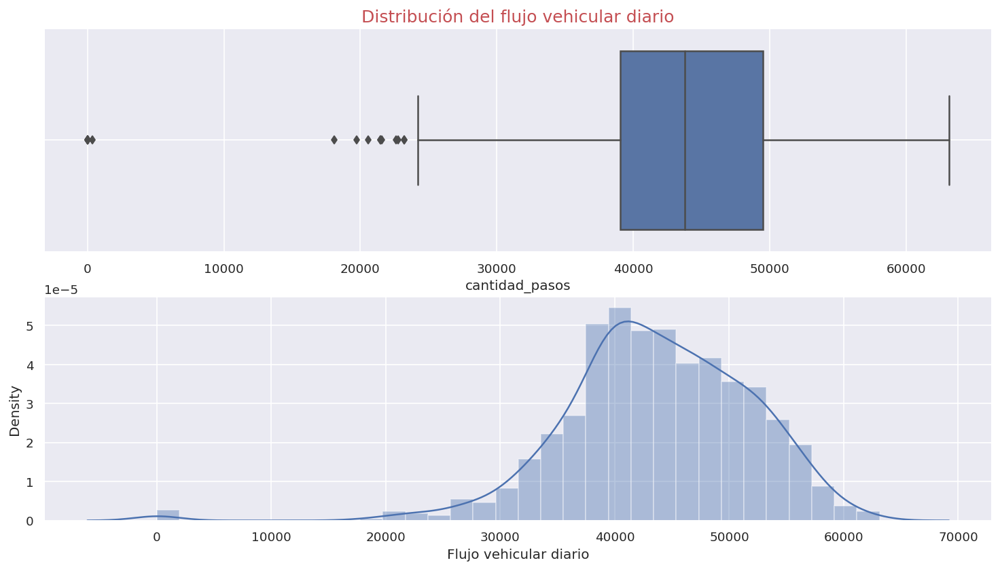

In [702]:
plt.figure(figsize = (15,8))

plt.subplot(2,1,1)
sns.boxplot(diario['cantidad_pasos'])
plt.grid(True)
plt.title('Distribución del flujo vehicular diario', size = 15, color='r')

plt.subplot(2,1,2)
sns.distplot(diario['cantidad_pasos'], kde = True)
plt.xlabel('Flujo vehicular diario')
plt.show()

La variable  del flujo vehicular tiene una distribución asimétrica con una cola negativa debido a que la cola se alarga para valores inferiores a la media.

* **Valores atípicos**

Recordemos que solo se esta mirando los valores atípicos que se presentan en la autopista Illia con la modalidad de pago **EFECTIVO**.

In [703]:
diario_1 = diario[diario.cantidad_pasos <= 20000]
diario_1

,cantidad_pasos
fecha,
2017-04-06,40.0
2018-06-25,0.0
2018-09-25,0.0
2018-11-29,19728.0
2018-11-30,0.0
2018-12-01,350.0
2019-01-13,18076.0
2019-05-29,0.0


Se observan los 8 valores atipicos por debajo de 20000. Se toma la decision de reemplazar eso valores atípicos mediante la interpolacion.

* **¿Cúal puede ser la causa de estos valores atipicos?**

En esas fechas en su mayoría corresponden a paros generales. Por otro lado, hay 3 fechas, que corresponden a la cumbre del G20 celebrada en Capital Federal.

* **2017-04-06:** hubo un paro nacional contra Mauricio Macri.
* **2018-06-25:** hubo huelga general
* **2018-09-25:** huelga general
* **2018-11-29:** Cumbre G20
* **2018-11-30:** Cumbre G20 (Se establece feriado el día viernes 30 de noviembre de 2018 en la Ciudad de Buenos Aires).
* **2018-12-01:** Cumbre G20
* **2019-01-13:** La Autopista Illia registro ese fin de semana un corte total sentido al centro por trabajos de montaje de vigas que se realizaron en la zona para conectar la Autopista Illia con el futuro Paseo Del Bajo.
* **2019-05-29:** huelga general: Paro contra el gobierno de Macri 


* **¿Si la tendencia es negativa, ¿puede ser porque se migre a otras formas de pago?**

Para responder esta pregunta veamos que sucede en estas fechas:

In [704]:
from IPython.display import display, Markdown

In [705]:
data = pd.concat([data_2017, data_2018, data_2019])

In [706]:
fechas = ['2017-04-06','2018-06-25','2018-09-25','2018-11-29','2018-11-30','2018-12-01','2019-01-13','2019-05-29']
for fecha in fechas:
  display(Markdown('AU Illia - Pasos por Medio de pago - Día '+date))
  display(data[
      data["fecha"] == date].loc[:,["forma_pago","cantidad_pasos"]
  ].groupby("forma_pago").sum())
  print('\nTotal: ')
  display(data[data["fecha"] == date].loc[:,["cantidad_pasos"]].sum())
  print('\n')

AU Illia - Pasos por Medio de pago - Día 2019-01-13

,cantidad_pasos
forma_pago,
EFECTIVO,104933
EXENTO,1409
INFRACCION,1743
NO COBRADO,4198
T. DISCAPACIDAD,1688
TELEPASE,69624



Total: 


cantidad_pasos    183595
dtype: int64

AU Illia - Pasos por Medio de pago - Día 2019-01-13

,cantidad_pasos
forma_pago,
EFECTIVO,104933
EXENTO,1409
INFRACCION,1743
NO COBRADO,4198
T. DISCAPACIDAD,1688
TELEPASE,69624



Total: 


cantidad_pasos    183595
dtype: int64

AU Illia - Pasos por Medio de pago - Día 2019-01-13

,cantidad_pasos
forma_pago,
EFECTIVO,104933
EXENTO,1409
INFRACCION,1743
NO COBRADO,4198
T. DISCAPACIDAD,1688
TELEPASE,69624



Total: 


cantidad_pasos    183595
dtype: int64

AU Illia - Pasos por Medio de pago - Día 2019-01-13

,cantidad_pasos
forma_pago,
EFECTIVO,104933
EXENTO,1409
INFRACCION,1743
NO COBRADO,4198
T. DISCAPACIDAD,1688
TELEPASE,69624



Total: 


cantidad_pasos    183595
dtype: int64

AU Illia - Pasos por Medio de pago - Día 2019-01-13

,cantidad_pasos
forma_pago,
EFECTIVO,104933
EXENTO,1409
INFRACCION,1743
NO COBRADO,4198
T. DISCAPACIDAD,1688
TELEPASE,69624



Total: 


cantidad_pasos    183595
dtype: int64

AU Illia - Pasos por Medio de pago - Día 2019-01-13

,cantidad_pasos
forma_pago,
EFECTIVO,104933
EXENTO,1409
INFRACCION,1743
NO COBRADO,4198
T. DISCAPACIDAD,1688
TELEPASE,69624



Total: 


cantidad_pasos    183595
dtype: int64

AU Illia - Pasos por Medio de pago - Día 2019-01-13

,cantidad_pasos
forma_pago,
EFECTIVO,104933
EXENTO,1409
INFRACCION,1743
NO COBRADO,4198
T. DISCAPACIDAD,1688
TELEPASE,69624



Total: 


cantidad_pasos    183595
dtype: int64

AU Illia - Pasos por Medio de pago - Día 2019-01-13

,cantidad_pasos
forma_pago,
EFECTIVO,104933
EXENTO,1409
INFRACCION,1743
NO COBRADO,4198
T. DISCAPACIDAD,1688
TELEPASE,69624



Total: 


cantidad_pasos    183595
dtype: int64

Podemos concluir que para las fechas donde EFECTIVO es cercano a cero, existen otros medios de pagos registrados.

* **Valores faltantes que corresponden a una fecha que no esta**

Para determinar los valores atipicos en series de tiempo se utiliza los métodos de interpolación, **interpolar ():** y filna para completar los valores de NAN en los datos.
Primero usaremos interpolar:

**Método Linear (deafult)**: Este método realiza una interpolación lineal para la asignación de valores

In [707]:
# Se genera filtro de atípicos y le asigno NaN
diario.cantidad_pasos[diario.cantidad_pasos <=20000] = np.nan

In [708]:
# Cantidad de dias con NaN
print(diario.isna().sum())

cantidad_pasos    8
dtype: int64


In [709]:
# Aplico Método Linear
diario = diario.interpolate()

In [710]:
# Cantidad de dias con NaN, luego de aplicar método
print(diario.isna().sum())

cantidad_pasos    0
dtype: int64


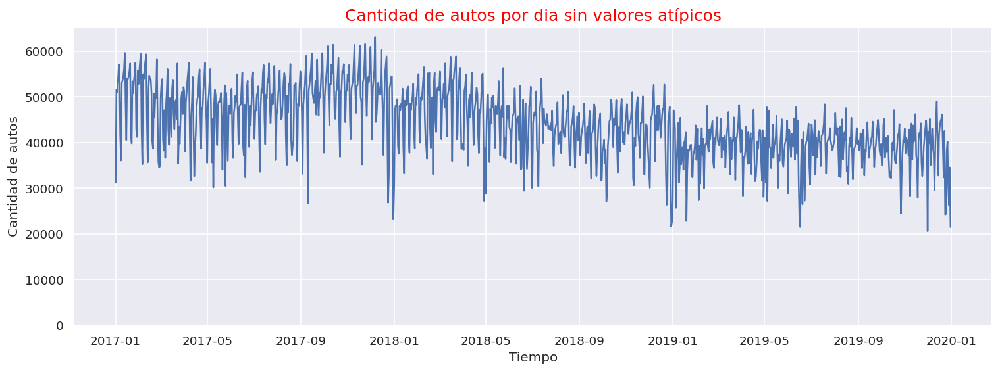

In [711]:
plt.figure(figsize = (15,5))
plt.plot(diario.index, diario.cantidad_pasos)
plt.title("Cantidad de autos por dia sin valores atípicos",  fontsize= 15 , color='red')
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos')
plt.ylim(ymin=0)
plt.show()

En el grafico se puede apreciar que ya no se muestran esos pico de cantidad de autos igual a cero lo que nos indica que ya el dataset no cuenta con valores atipicos.

(array([0, 1, 2, 3, 4, 5, 6]), <a list of 7 Text major ticklabel objects>)

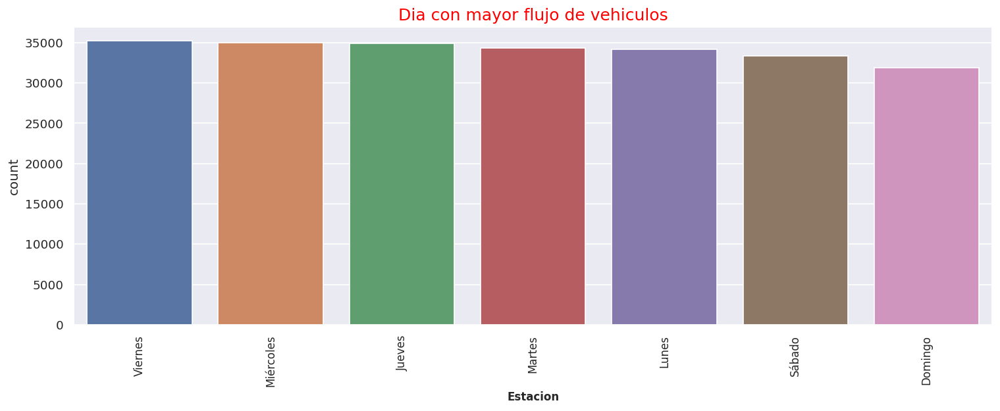

In [712]:
plt.figure(figsize=(15,5))
sns.countplot(data = dataset, x = "dia" ,order = dataset.dia.value_counts().index)
plt.title("Dia con mayor flujo de vehiculos", size = 15, color='red')
plt.xlabel("Estacion", fontweight = "black", fontsize = 10)
plt.xticks(rotation=90, size=10)

# **Autocorrelación**

La autocorrelación y la autocorrelación parcial son medidas de asociación entre valores de series actuales y pasadas e indican cuáles son los valores de series pasadas más útiles para predecir valores futuros. Con estos datos se puede determinar el orden de los procesos en un modelo ARIMA. 


* **La autocorrelación**: es la correlación de una serie con sus propios rezagos. Si una serie está significativamente autocorrelacionada, eso significa que los valores anteriores de la serie (rezagos) pueden ser útiles para predecir el valor actual.

* **La autocorrelación parcia**: también transmite información similar, pero transmite la correlación pura de una serie y su rezago, excluyendo las contribuciones de correlación de los rezagos intermedios.

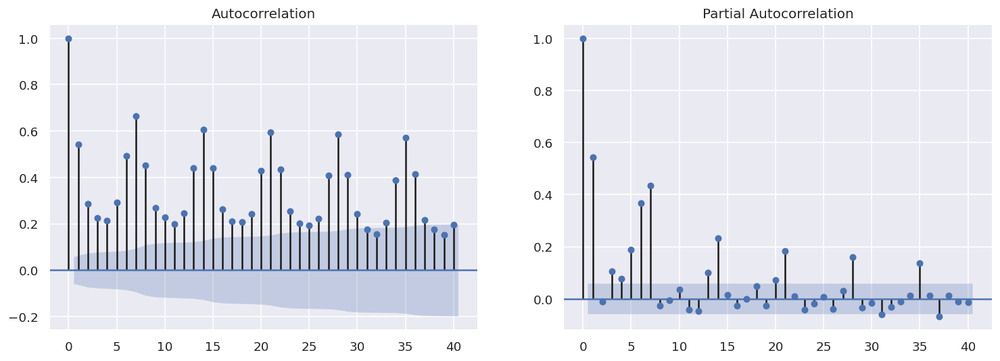

In [713]:
fig, axes = plt.subplots(1, 2, figsize=(15,5))

fig = sm.graphics.tsa.plot_acf(diario['cantidad_pasos'], lags=40, ax=axes[0])
fig = sm.graphics.tsa.plot_pacf(diario['cantidad_pasos'], lags=40, ax=axes[1])

# **Determinación del tipo de modelo**

* **Calculo de la varianza**

Una operación común en los datos de series de tiempo es desplazar los valores hacia atrás y adelante en el tiempo, para calcular el cambio porcentual de una muestra a otra. mediante el método **shift()**.

In [714]:
variacion_diaria = diario ['cantidad_pasos']/ diario ['cantidad_pasos'].shift(1)-1
diario['var_diaria'] = variacion_diaria
diario['var_diaria'][:5]

fecha
2017-01-01         NaN
2017-01-02    0.653722
2017-01-03   -0.009211
2017-01-04    0.043822
2017-01-05    0.059139
Freq: D, Name: var_diaria, dtype: float64

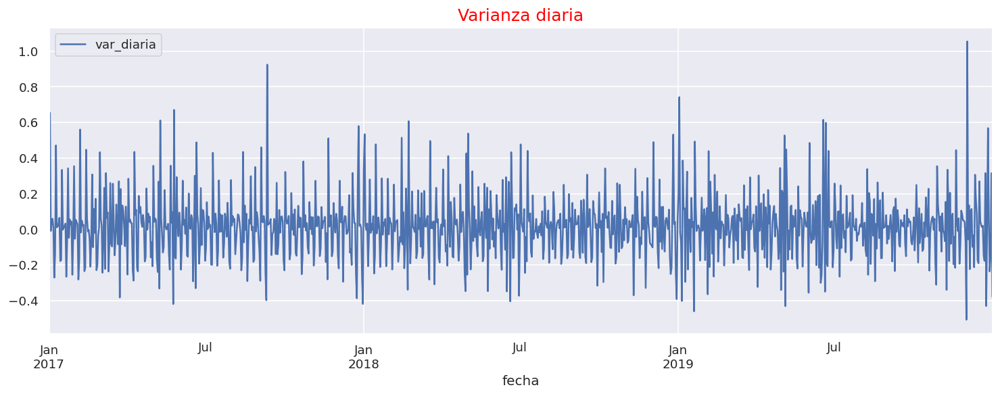

In [715]:
plt.figure(figsize=(15,5))
plot = diario['var_diaria'].plot()
plt.title('Varianza diaria',  fontsize= 15 , color='red')
legend = plt.legend()

* **Tendencia Lineal**

Se va ajustar una regresión lineal a la serie utilizando la libreria de **Scikitlearn.**

Se debe pasar las fechas a un formato numérico para poder hacer la regresión lineal.

Se va a determinar una ventana de tiempo el cual consiste en una agrupación de varios registros temporales el cual tiene un inicio y un final. Para este caso como estamos trabajando con una periodicidad diaria, la ventana de tiempo que pondremos es un año, el cual tendría tamaño 365, es decir que contempla 365 registros.

In [716]:
diario_promedio_tendencia = diario.cantidad_pasos.rolling(window=365, center = True).mean()
diario_promedio_tendencia

fecha
2017-01-01   NaN
2017-01-02   NaN
2017-01-03   NaN
2017-01-04   NaN
2017-01-05   NaN
              ..
2019-12-27   NaN
2019-12-28   NaN
2019-12-29   NaN
2019-12-30   NaN
2019-12-31   NaN
Freq: D, Name: cantidad_pasos, Length: 1095, dtype: float64

Vemos que los primeros registros no tienen ningun valor hasta que se logre que un registro tenga la posibilidad de tener esa ventana de tiempo, los datos que no cumplan con ese requerimiento no van a ser calculados.

In [717]:
diario['fecha_numeros']=diario.index.map(datetime.datetime.toordinal)
diario.head()

,cantidad_pasos,var_diaria,fecha_numeros
fecha,,,
2017-01-01,31183.0,NaN,736330
2017-01-02,51568.0,0.653722,736331
2017-01-03,51093.0,-0.009211,736332
2017-01-04,53332.0,0.043822,736333
2017-01-05,56486.0,0.059139,736334


In [718]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(diario.fecha_numeros.values.reshape(-1, 1), diario.cantidad_pasos)

LinearRegression()

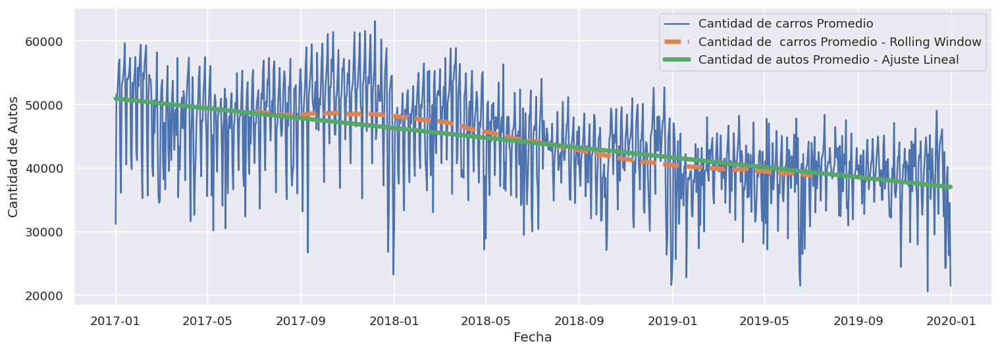

In [719]:
plt.figure(figsize = (15,5))
plt.plot(diario.index, diario.cantidad_pasos, label = 'Cantidad de carros Promedio')
plt.plot(diario_promedio_tendencia, ls = '--', lw = 4, label = 'Cantidad de  carros Promedio - Rolling Window')
plt.plot(diario.index, lr.predict(diario.fecha_numeros.values.reshape(-1, 1)), lw = 4, label = 'Cantidad de autos Promedio - Ajuste Lineal')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de Autos')
plt.legend()
plt.show()

En el grafico podemos ver con el ajuste lineal (linea verde) nos esta indicando una tendencia negativa.

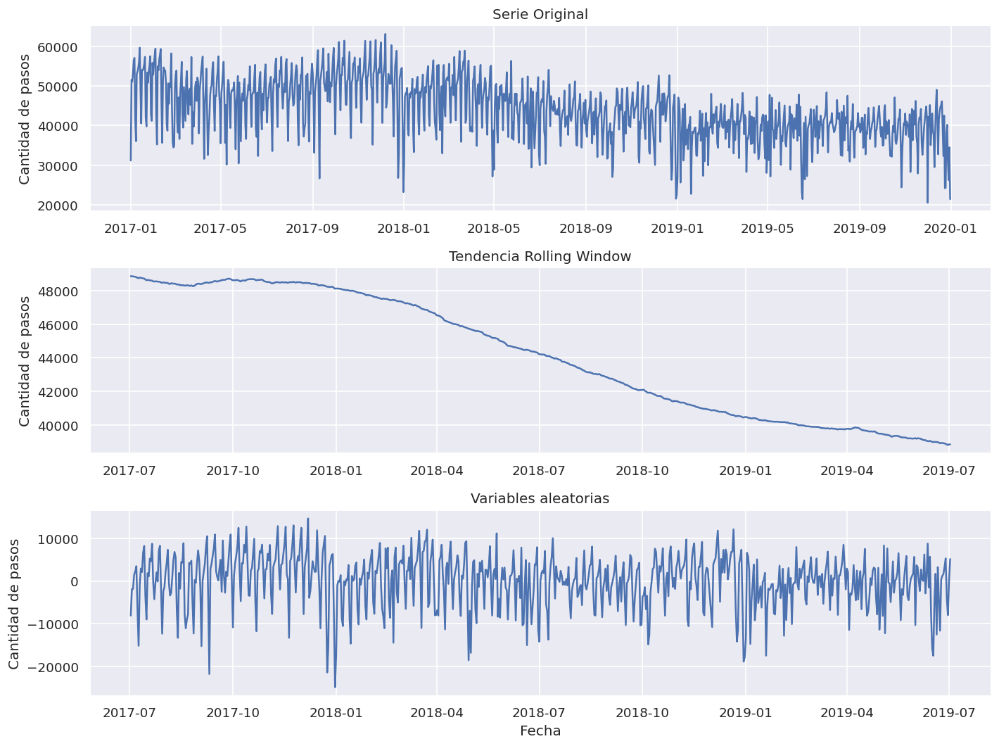

In [720]:
plt.figure(figsize = (12,9))

plt.subplot(3,1,1)
plt.title('Serie Original')
plt.plot(diario.index, diario.cantidad_pasos)
plt.ylabel('Cantidad de pasos')

plt.subplot(3,1,2)
plt.title('Tendencia Rolling Window')
plt.plot(diario_promedio_tendencia)
plt.ylabel('Cantidad de pasos')

plt.subplot(3,1,3)
plt.title('Variables aleatorias')
plt.plot(diario.index, diario.cantidad_pasos - diario_promedio_tendencia)
plt.xlabel('Fecha')
plt.ylabel('Cantidad de pasos')

plt.tight_layout()
plt.show()

En estos tres graficos se puede observa: 
* En el primer grafico muestra nuestra serie original.
* En el segundo grafico muestra la tendencia de media movil
"En el tercer grafico muestra esos valores aleatorios que toma la serie de tiempo que seria el ruido blanco.

* **filtro Hodrick-Prescott para separar en tendencia**

In [721]:
ciclo, tend = sm.tsa.filters.hpfilter(diario['cantidad_pasos'])
diario['tend'] = tend

Text(0.5, 1.0, 'Variacion del flujo vehicular diario con la tendencia.')

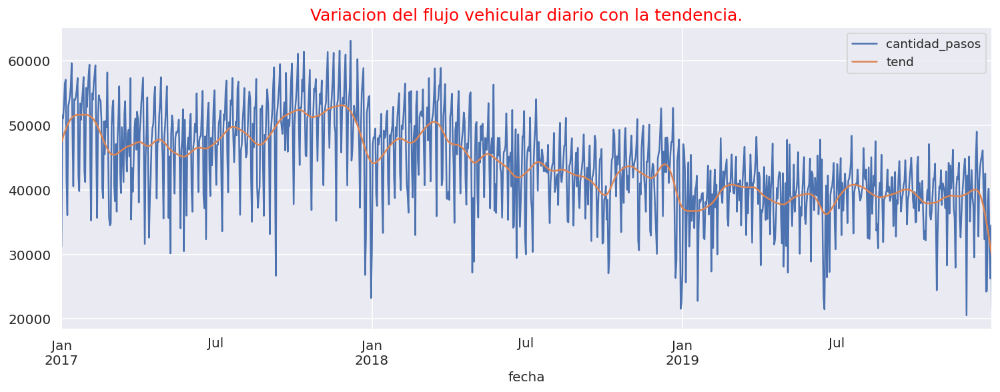

In [722]:
diario[['cantidad_pasos', 'tend']].plot(figsize=(15,5),fontsize=12);
legend = plt.legend()
plt.title("Variacion del flujo vehicular diario con la tendencia.", fontsize= 15 , color='red')

# **Descomposición de serie: Tendencia, Estacionalidad y Ruido**

El método descomposición de series de tiempo permite descomponer nuestra serie de tiempo en tres componentes distintos: tendencia, estacionalidad y ruido.

* **Serie Aditiva**


Se trata de una serie lineal donde los cambios temporales tienen la misma cantidad. Esto implica que la tendencia es una línea recta y que las componentes cíclicas tienen la misma frecuencia y amplitud. 

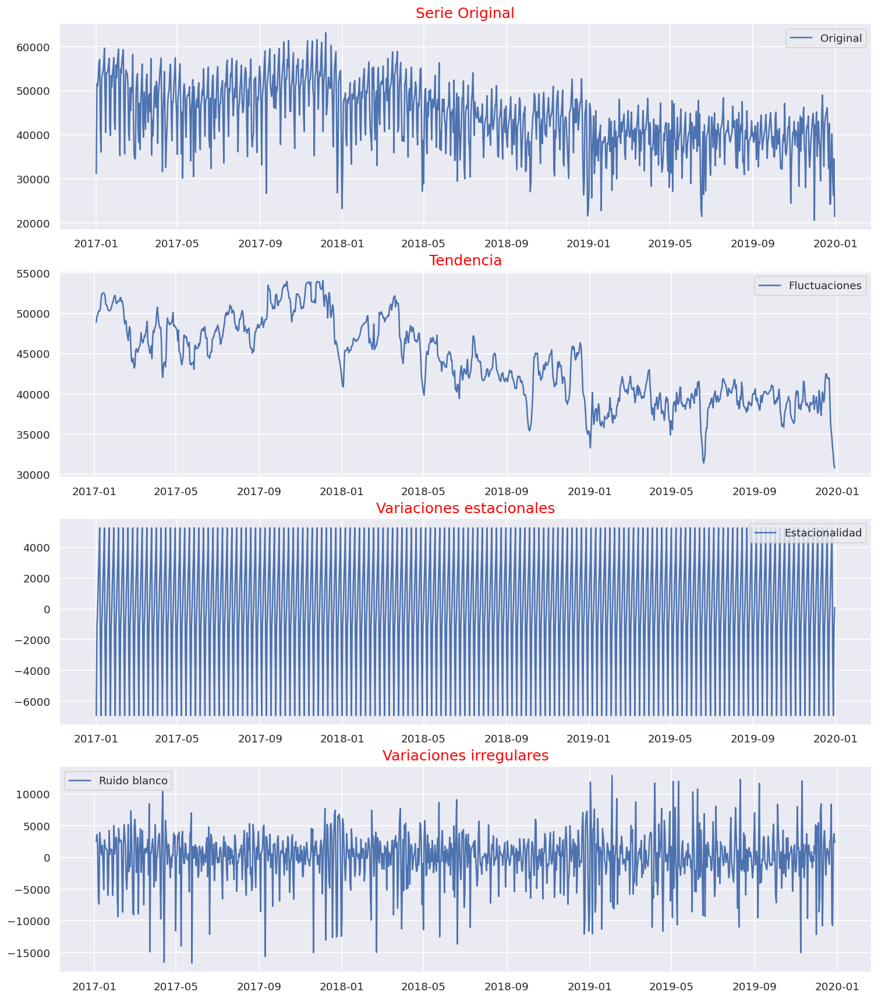

In [723]:
rcParams['figure.figsize'] = 15,18
descomposicion = sm.tsa.seasonal_decompose(diario['cantidad_pasos'], model='additive')
trend = descomposicion.trend
seasonal = descomposicion.seasonal
residual = descomposicion.resid

plt.subplot(4,1,1)
plt.plot(diario['cantidad_pasos'], label = 'Original')
plt.title('Serie Original', fontsize= 15 , color='red')
plt.legend(loc='mejor')
plt.subplot(4,1,2)
plt.plot(trend, label ='Fluctuaciones')
plt.title('Tendencia',fontsize= 15 , color='red')
plt.legend(loc='mejor')
plt.subplot(4,1,3)
plt.plot(seasonal, label = 'Estacionalidad')
plt.title('Variaciones estacionales', fontsize= 15 , color='red')
plt.legend(loc='mejor')
plt.subplot(4,1,4)
plt.plot(residual, label = 'Ruido blanco')
plt.title('Variaciones irregulares', fontsize= 15 , color='red')
plt.legend(loc='mejor')


* En el primer gráfico se observa la serie original.
* El segundo gráfico muestra la tendencia de la serie, el cual se puede observar tiene una tendencia decreciente.
* El tercer gráfico representa la estacionalidad. Es decir, que se pueden apreciar las fluctuaciones internas que suceden por dentro de la serie.
* El cuarto grafico muestra el ruido de la serie que son los valores en el tiempo completamente aleatorios y no vamos a poder predecir.

* **Serie Multiplicativa**

Se trata de una serie no lineal (como puede ser una señal cuadrática o exponencial por ejemplo). Los cambios aumentan o disminuyen con el tiempo. Esto implica que la tendencia es una curva y tanto la frecuencia como la amplitud son inconstantes.

Mientras que la descomposición multiplicativa de la serie es la siguiente:

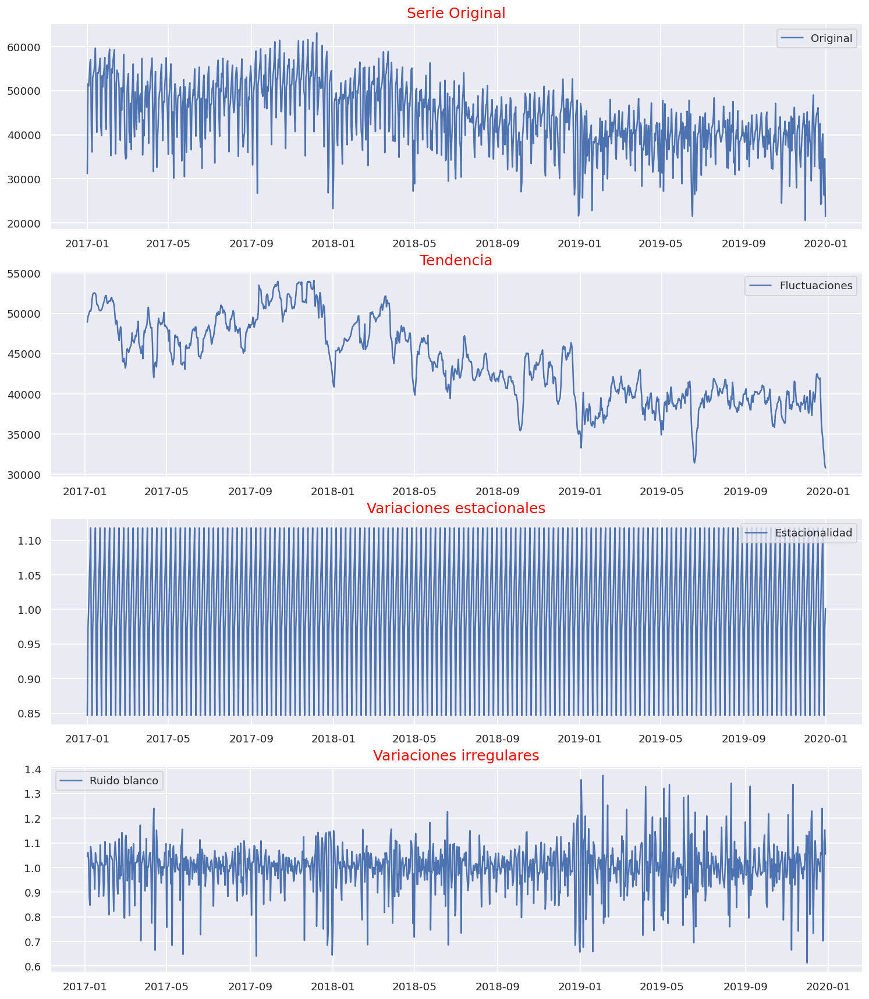

In [724]:
rcParams['figure.figsize'] = 15,18
descomposicion = sm.tsa.seasonal_decompose(diario['cantidad_pasos'], model='multiplicative')
trend = descomposicion.trend
seasonal = descomposicion.seasonal
residual = descomposicion.resid

plt.subplot(4,1,1)
plt.plot(diario['cantidad_pasos'], label = 'Original')
plt.title('Serie Original', fontsize= 15 , color='red')
plt.legend(loc='mejor')
plt.subplot(4,1,2)
plt.plot(trend, label ='Fluctuaciones')
plt.title('Tendencia',fontsize= 15 , color='red')
plt.legend(loc='mejor')
plt.subplot(4,1,3)
plt.plot(seasonal, label = 'Estacionalidad')
plt.title('Variaciones estacionales', fontsize= 15 , color='red')
plt.legend(loc='mejor')
plt.subplot(4,1,4)
plt.plot(residual, label = 'Ruido blanco')
plt.title('Variaciones irregulares', fontsize= 15 , color='red')
plt.legend(loc='mejor')

Al descomponer la serie con ambos modelos, observados que los gráficos son similares.

La  diferencia se ve en el grafico de variaciones irregulares ya que en el modelo 'Aditivo' tiene una media en cero, mientras que en el Multplicativo no lo que indica que podríamos estar ante la presencia de ruido blanco.

Nos vamos a quedar solo con un modelo aditivo que para la serie semanal y mensual solo se va a utilizar esa.

El uso de la descomposición de series de tiempo facilita la identificación rápida de una media cambiante o una variación en los datos

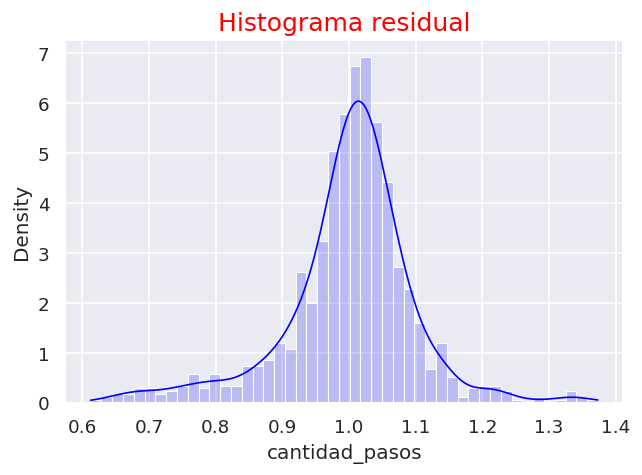

In [725]:
plt.figure(figsize = (6,4))
sns.histplot(data = residual, stat = "density",kde = True, line_kws= {"linewidth":1},color = "blue",alpha= 0.2)
plt.title('Histograma residual', fontsize= 15 , color='red')
plt.show()

# **Serie de tiempo - EDA - Frecuencia Semanal**

In [726]:
diario.reset_index(inplace=True) 

In [727]:
#Resampleamos nuestros datos para agrupar por semana
semanal = diario.resample('W', on = 'fecha').sum()
print(semanal.shape)

(158, 4)


In [728]:
semanal.head()

,cantidad_pasos,var_diaria,fecha_numeros,tend
fecha,,,,
2017-01-01,31183.0,0.000000,736330,47372.157293
2017-01-08,347212.0,0.353784,5154338,342685.397075
2017-01-15,366413.0,0.239592,5154387,356420.263196
2017-01-22,357215.0,0.072845,5154436,361092.443706
2017-01-29,354581.0,0.126785,5154485,361559.384154


En la tabla anterior se puede observar que la fecha ya salta cada 7 días lo que nos indica que ya se hizo la agrupacion de la serie en forma semanal 

* Semanas de mayor flujo vehicular

In [729]:
semanal.sort_values('cantidad_pasos', ascending=False).head(10)

,cantidad_pasos,var_diaria,fecha_numeros,tend
fecha,,,,
2017-10-15,377832.0,0.083019,5156298,365090.167083
2017-11-19,377263.0,0.081865,5156543,369705.127405
2017-11-12,375644.0,0.188402,5156494,366580.312884
2017-09-17,374520.0,0.904039,5156102,354353.274913
2017-12-03,371970.0,-0.062600,5156641,370968.827342
2017-10-08,369918.0,0.224313,5156249,366335.143829
2017-10-29,366650.0,0.265000,5156396,359437.025196
2017-01-15,366413.0,0.239592,5154387,356420.263196
2017-12-17,365063.0,-0.026666,5156739,352053.147834


Las semanas de mayor flujo vehicular se registran en el año 2017 y fue la semana 2017-10-15.

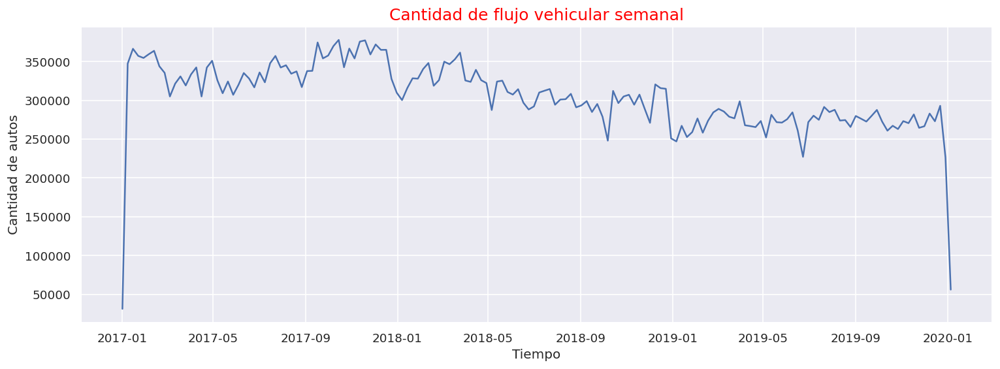

In [730]:
plt.figure(figsize = (15,5))
plt.plot(semanal.index, semanal.cantidad_pasos)
plt.title("Cantidad de flujo vehicular semanal",  fontsize= 15 , color='red')
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos')
plt.show()

En la serie semanal muestra las mismas tendencias que veiamos en la serie diaria, aqui se puede observar que todavia se encuentra dos picos que nos indican outliers.

In [731]:
semanal.cantidad_pasos.describe()

count       158.000000
mean     304751.329114
std       45645.015341
min       31183.000000
25%      277237.125000
50%      307243.000000
75%      335333.000000
max      377832.000000
Name: cantidad_pasos, dtype: float64

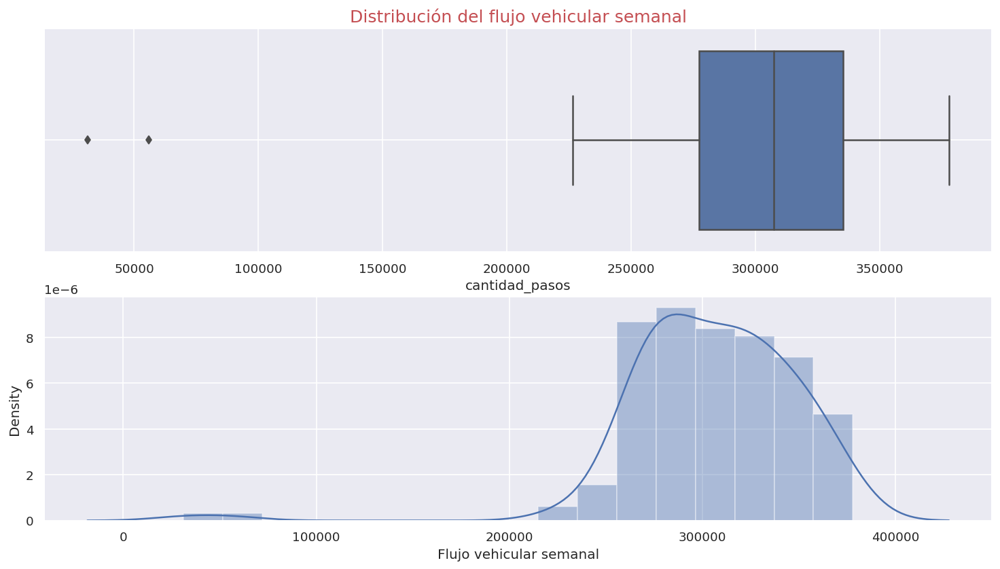

In [732]:
plt.figure(figsize = (15,8))

plt.subplot(2,1,1)
sns.boxplot(semanal['cantidad_pasos'])
plt.grid(True)
plt.title('Distribución del flujo vehicular semanal', size = 15, color='r')

plt.subplot(2,1,2)
sns.distplot(semanal['cantidad_pasos'], kde = True)
plt.xlabel('Flujo vehicular semanal')
plt.show()

Haciendo el boxplot se ratifica que todavia quedan algunos outliers como se veian en el grafico anterior, los cuales no se van a eliminar.

Determinamos un lag de 3 años multiplicado por 52 semanas de forma ue el total sea la cantidad de instancias del dataset resampleado.

* **Autocorrelación**

In [733]:
nlags= 52 *3
autoc= acf(semanal.cantidad_pasos, nlags= nlags, fft=False)
autoc.shape

(157,)

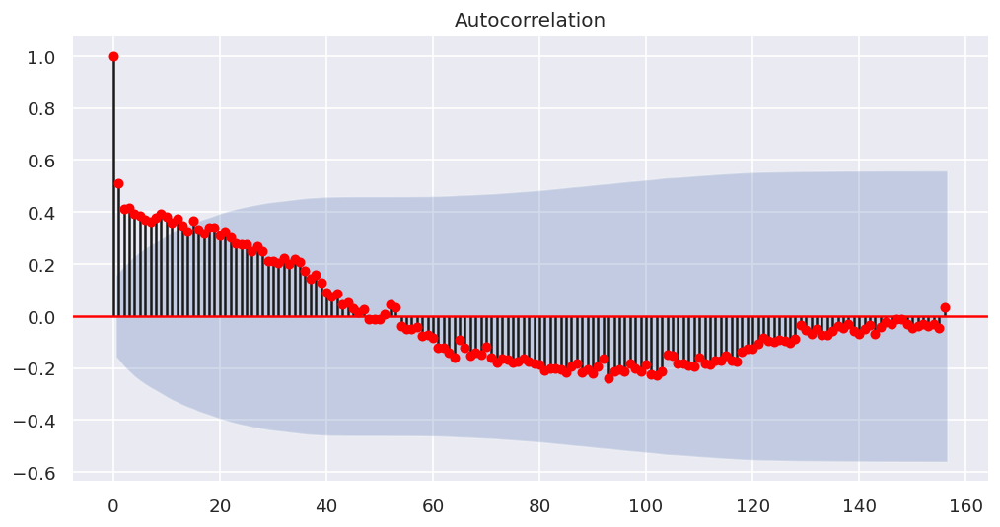

In [734]:
fig, ejes = plt.subplots(figsize=(10,5))
plot_acf(semanal.cantidad_pasos, lags = nlags,ax=ejes,color="red",use_vlines=True)
    
plt.show()

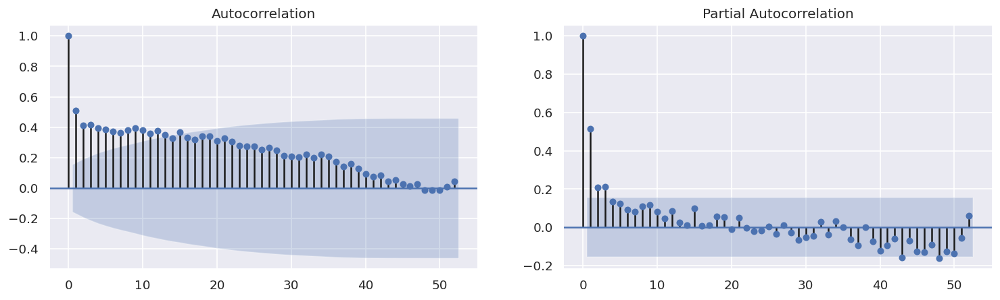

In [735]:
fig, axes = plt.subplots(1, 2, figsize=(15,4))

fig = sm.graphics.tsa.plot_acf(semanal['cantidad_pasos'], lags=52, ax=axes[0])
fig = sm.graphics.tsa.plot_pacf(semanal['cantidad_pasos'], lags=52, ax=axes[1])

* **Tendendencia lineal**

In [736]:
semana_promedio_tendencia = semanal.cantidad_pasos.rolling(window=52, center = True).mean()
semana_promedio_tendencia

fecha
2017-01-01   NaN
2017-01-08   NaN
2017-01-15   NaN
2017-01-22   NaN
2017-01-29   NaN
              ..
2019-12-08   NaN
2019-12-15   NaN
2019-12-22   NaN
2019-12-29   NaN
2020-01-05   NaN
Freq: W-SUN, Name: cantidad_pasos, Length: 158, dtype: float64

In [737]:
semanal['fecha_numeros']=semanal.index.map(datetime.datetime.toordinal)
semanal.head()

,cantidad_pasos,var_diaria,fecha_numeros,tend
fecha,,,,
2017-01-01,31183.0,0.000000,736330,47372.157293
2017-01-08,347212.0,0.353784,736337,342685.397075
2017-01-15,366413.0,0.239592,736344,356420.263196
2017-01-22,357215.0,0.072845,736351,361092.443706
2017-01-29,354581.0,0.126785,736358,361559.384154


In [738]:
lr = LinearRegression()
lr.fit(semanal.fecha_numeros.values.reshape(-1, 1), semanal.cantidad_pasos)

LinearRegression()

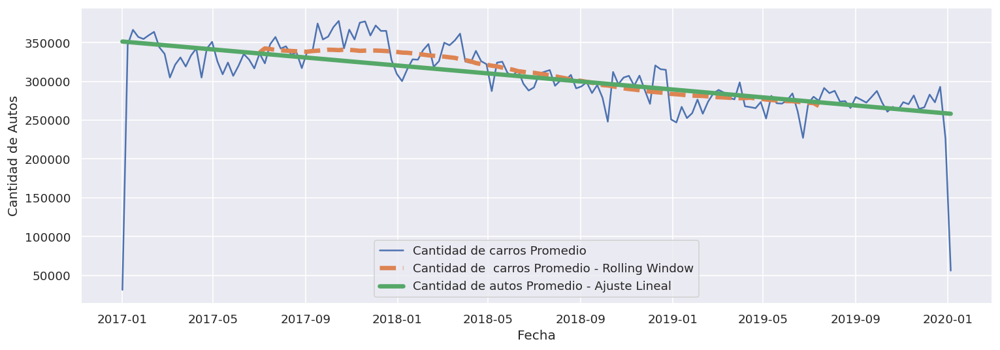

In [739]:
plt.figure(figsize = (15,5))
plt.plot(semanal.index, semanal.cantidad_pasos, label = 'Cantidad de carros Promedio')
plt.plot(semana_promedio_tendencia, ls = '--', lw = 4, label = 'Cantidad de  carros Promedio - Rolling Window')
plt.plot(semanal.index, lr.predict(semanal.fecha_numeros.values.reshape(-1, 1)), lw = 4, label = 'Cantidad de autos Promedio - Ajuste Lineal')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de Autos')
plt.legend()
plt.show()

Como lo indicabamos en la serie Diaria se puede observar en la serie semanal el mismo comportamiento lineal con una tendencia negativa.

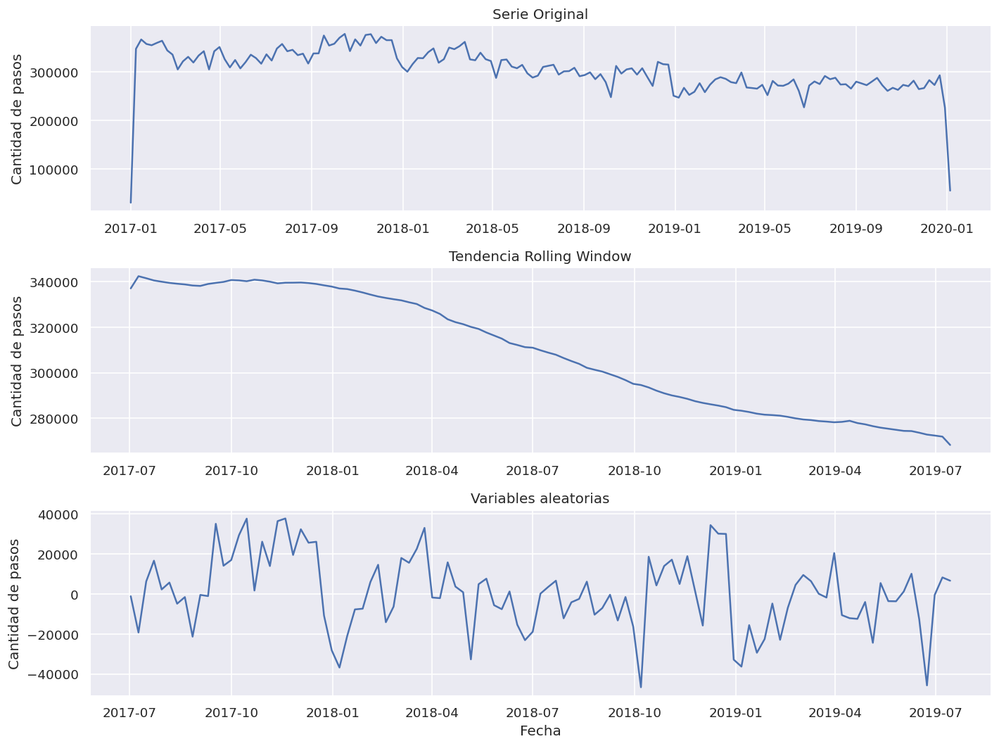

In [740]:
plt.figure(figsize = (12,9))

plt.subplot(3,1,1)
plt.title('Serie Original')
plt.plot(semanal.index, semanal.cantidad_pasos)
plt.ylabel('Cantidad de pasos')

plt.subplot(3,1,2)
plt.title('Tendencia Rolling Window')
plt.plot(semana_promedio_tendencia)
plt.ylabel('Cantidad de pasos')

plt.subplot(3,1,3)
plt.title('Variables aleatorias')
plt.plot(semanal.index, semanal.cantidad_pasos - semana_promedio_tendencia)
plt.xlabel('Fecha')
plt.ylabel('Cantidad de pasos')

plt.tight_layout()
plt.show()

* **filtro Hodrick-Prescott para separar en tendencia**

Luego se calcula la linea de tendencia sobre los datos aplicando el filtro Hodrick-Prescott.

In [741]:
ciclo, tend = sm.tsa.filters.hpfilter(semanal['cantidad_pasos'])
semanal['tend'] = tend

Text(0.5, 1.0, 'Variacion del flujo vehicular semanal con la tendencia.')

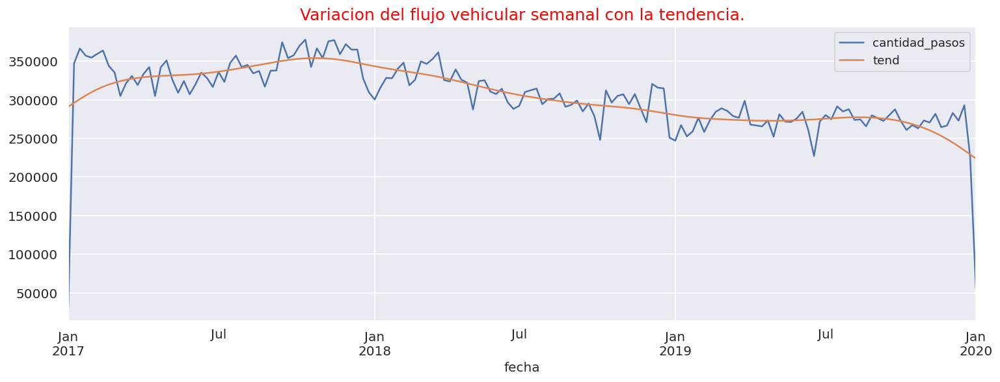

In [742]:
semanal[['cantidad_pasos', 'tend']].plot(figsize=(15,5),fontsize=12);
legend = plt.legend()
plt.title("Variacion del flujo vehicular semanal con la tendencia.", fontsize= 15 , color='red')

* **descomposición de serie de tiempo**

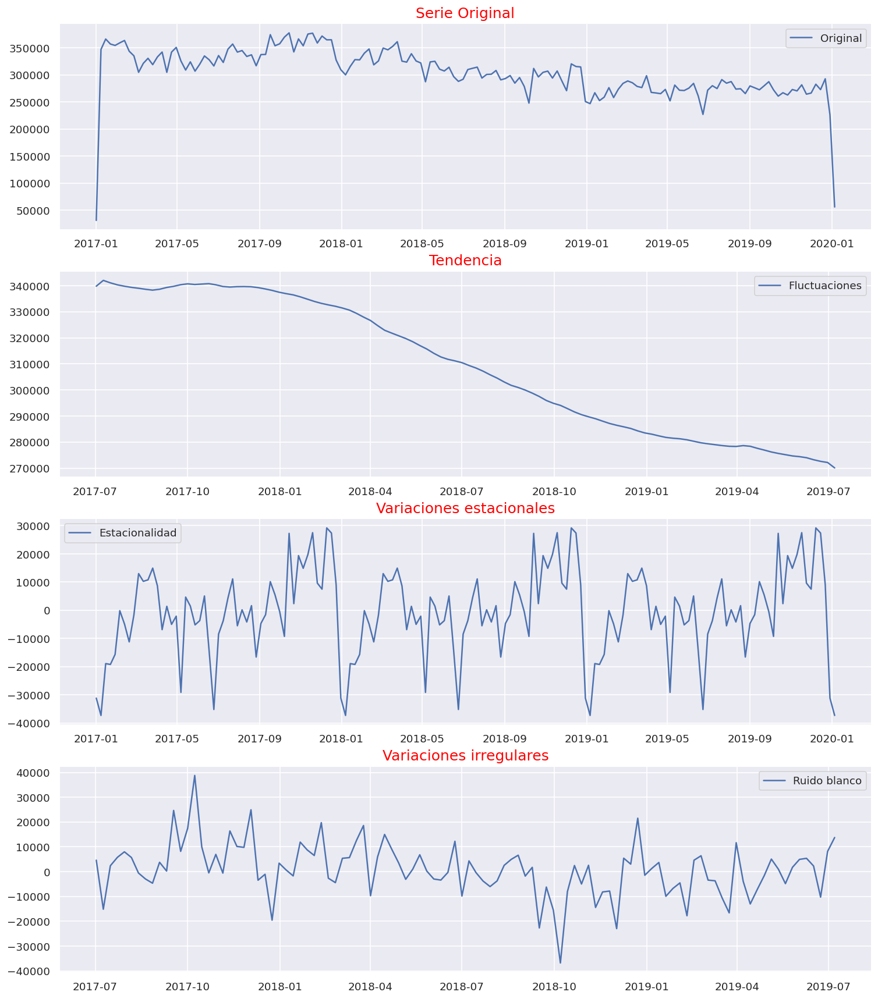

In [743]:
rcParams['figure.figsize'] = 15,18
descomposicion = sm.tsa.seasonal_decompose(semanal['cantidad_pasos'], model='additive')
trend = descomposicion.trend
seasonal = descomposicion.seasonal
residual = descomposicion.resid

plt.subplot(4,1,1)
plt.plot(semanal['cantidad_pasos'], label = 'Original')
plt.title('Serie Original', fontsize= 15 , color='red')
plt.legend(loc='mejor')
plt.subplot(4,1,2)
plt.plot(trend, label ='Fluctuaciones')
plt.title('Tendencia',fontsize= 15 , color='red')
plt.legend(loc='mejor')
plt.subplot(4,1,3)
plt.plot(seasonal, label = 'Estacionalidad')
plt.title('Variaciones estacionales', fontsize= 15 , color='red')
plt.legend(loc='mejor')
plt.subplot(4,1,4)
plt.plot(residual, label = 'Ruido blanco')
plt.title('Variaciones irregulares', fontsize= 15 , color='red')
plt.legend(loc='mejor')

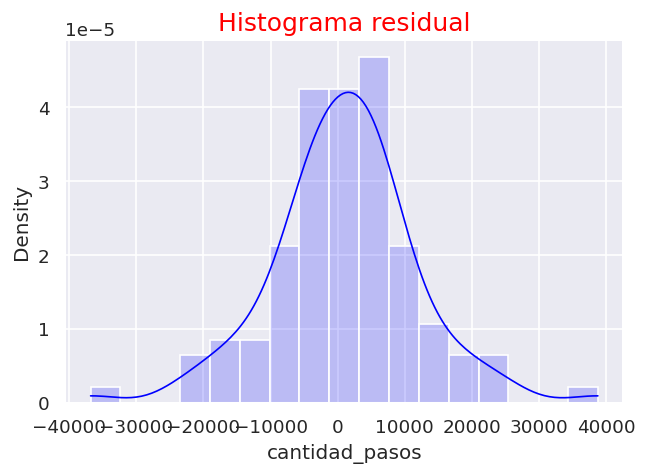

In [744]:
plt.figure(figsize = (6,4))
sns.histplot(data = residual, stat = "density",kde = True, line_kws= {"linewidth":1},color = "blue",alpha= 0.2)
plt.title('Histograma residual', fontsize= 15 , color='red')
plt.show()

# **Serie de tiempo - EDA - Frecuencia mensual**

In [745]:
#Resampleamos nuestros datos para agrupar por mes
mensual = diario.resample('M', on = 'fecha').sum()
print(mensual.shape)

(36, 4)


In [746]:
mensual.head()

,cantidad_pasos,var_diaria,fecha_numeros,tend
fecha,,,,
2017-01-31,1565260.0,1.093875,22826695,1.572404e+06
2017-02-28,1363113.0,0.055943,20618486,1.371127e+06
2017-03-31,1451214.0,0.927996,22828524,1.436998e+06
2017-04-30,1429482.0,0.261507,22093035,1.419221e+06
2017-05-31,1407136.0,0.878923,22830415,1.422539e+06


* Meses de mayor flujo vehicular 

In [747]:
mensual.sort_values('cantidad_pasos', ascending=False).head(10)

,cantidad_pasos,var_diaria,fecha_numeros,tend
fecha,,,,
2017-10-31,1597356.0,0.353979,22835158,1.606546e+06
2017-11-30,1581428.0,0.428528,22099455,1.578791e+06
2017-01-31,1565260.0,1.093875,22826695,1.572404e+06
2018-03-31,1540839.0,0.098867,22839839,1.539018e+06
2017-12-31,1521177.0,-0.211681,22837049,1.524510e+06
2017-09-30,1519327.0,0.540530,22097625,1.516100e+06
2017-07-31,1502820.0,0.162760,22832306,1.516952e+06
2017-08-31,1492232.0,0.533149,22833267,1.482789e+06
2017-03-31,1451214.0,0.927996,22828524,1.436998e+06


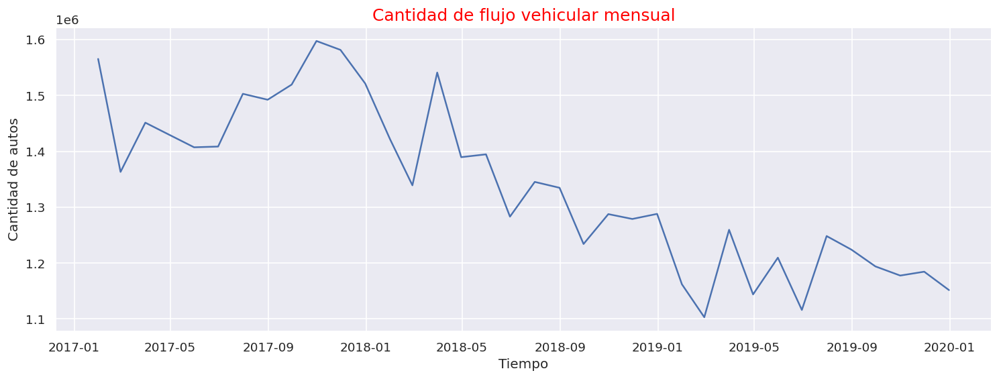

In [748]:
plt.figure(figsize = (15,5))
plt.plot(mensual.index, mensual.cantidad_pasos)
plt.title("Cantidad de flujo vehicular mensual",  fontsize= 15 , color='red')
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos')
plt.show()

In [749]:
mensual.cantidad_pasos.describe()

count    3.600000e+01
mean     1.337520e+06
std      1.439184e+05
min      1.103086e+06
25%      1.220400e+06
50%      1.336892e+06
75%      1.434915e+06
max      1.597356e+06
Name: cantidad_pasos, dtype: float64

Text(0.5, 1.0, 'Boxplot de la variable cantidad pasos mensual ')

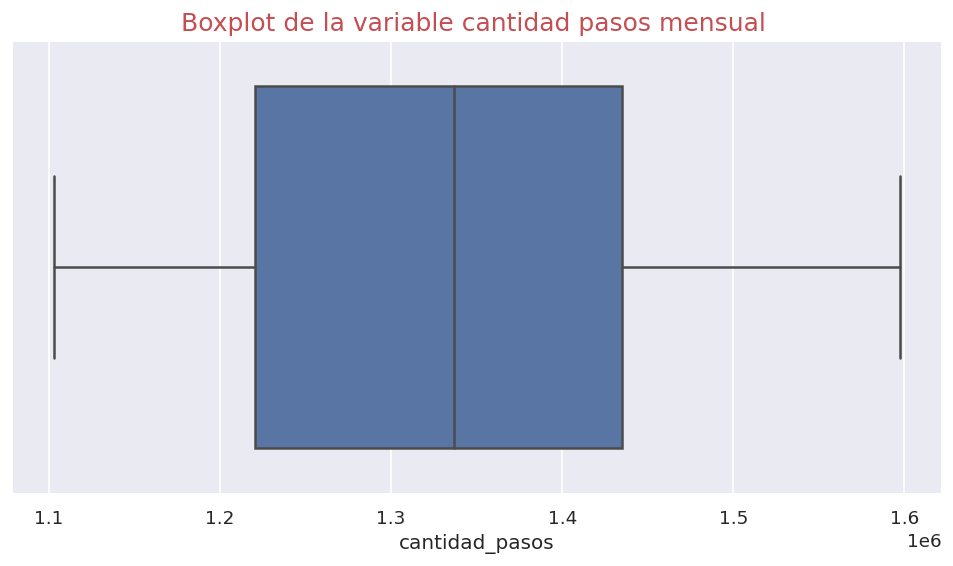

In [750]:
plt.figure(figsize = (10,5))

sns.boxplot(data = mensual, x = "cantidad_pasos")
plt.title('Boxplot de la variable cantidad pasos mensual ', size = 15, color='r')

* **Autocorrelación**

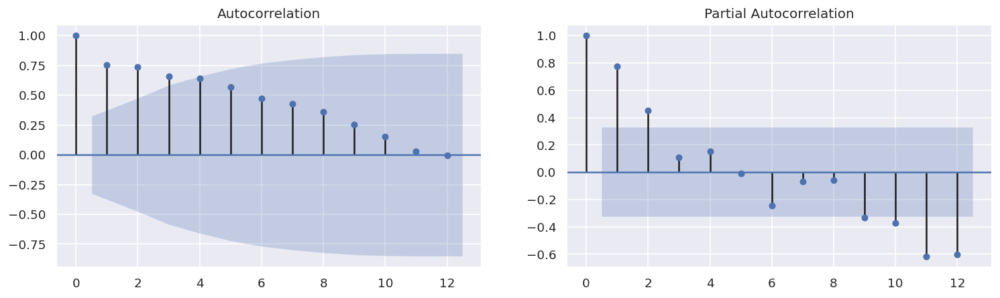

In [751]:
fig, axes = plt.subplots(1, 2, figsize=(15,4))

fig = sm.graphics.tsa.plot_acf(mensual['cantidad_pasos'], lags=12, ax=axes[0])
fig = sm.graphics.tsa.plot_pacf(mensual['cantidad_pasos'], lags=12, ax=axes[1])

* **Tendencia lineal**

In [752]:
mensual_promedio_tendencia = mensual.cantidad_pasos.rolling(window=12, center = True).mean()
mensual_promedio_tendencia

fecha
2017-01-31             NaN
2017-02-28             NaN
2017-03-31             NaN
2017-04-30             NaN
2017-05-31             NaN
2017-06-30             NaN
2017-07-31    1.486584e+06
2017-08-31    1.474618e+06
2017-09-30    1.472616e+06
2017-10-31    1.480084e+06
2017-11-30    1.476750e+06
2017-12-31    1.475701e+06
2018-01-31    1.465252e+06
2018-02-28    1.452119e+06
2018-03-31    1.438991e+06
2018-04-30    1.415224e+06
2018-05-31    1.389409e+06
2018-06-30    1.364198e+06
2018-07-31    1.344765e+06
2018-08-31    1.323132e+06
2018-09-30    1.303465e+06
2018-10-31    1.280022e+06
2018-11-30    1.259560e+06
2018-12-31    1.244151e+06
2019-01-31    1.230238e+06
2019-02-28    1.222163e+06
2019-03-31    1.212937e+06
2019-04-30    1.209594e+06
2019-05-31    1.200432e+06
2019-06-30    1.192572e+06
2019-07-31    1.181210e+06
2019-08-31             NaN
2019-09-30             NaN
2019-10-31             NaN
2019-11-30             NaN
2019-12-31             NaN
Freq: M, Name: cantida

In [753]:
mensual['fecha_numeros']=mensual.index.map(datetime.datetime.toordinal)
mensual.head()

,cantidad_pasos,var_diaria,fecha_numeros,tend
fecha,,,,
2017-01-31,1565260.0,1.093875,736360,1.572404e+06
2017-02-28,1363113.0,0.055943,736388,1.371127e+06
2017-03-31,1451214.0,0.927996,736419,1.436998e+06
2017-04-30,1429482.0,0.261507,736449,1.419221e+06
2017-05-31,1407136.0,0.878923,736480,1.422539e+06


In [754]:
lr = LinearRegression()
lr.fit(mensual.fecha_numeros.values.reshape(-1, 1),mensual.cantidad_pasos)

LinearRegression()

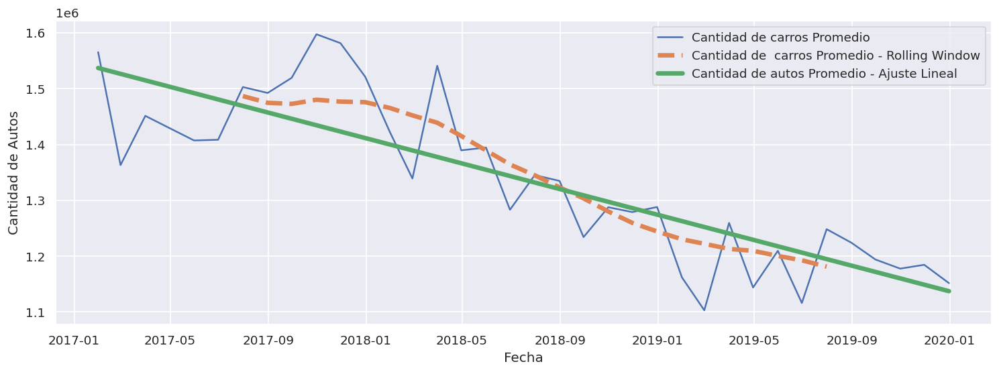

In [755]:
plt.figure(figsize = (15,5))
plt.plot(mensual.index, mensual.cantidad_pasos, label = 'Cantidad de carros Promedio')
plt.plot(mensual_promedio_tendencia, ls = '--', lw = 4, label = 'Cantidad de  carros Promedio - Rolling Window')
plt.plot(mensual.index, lr.predict(mensual.fecha_numeros.values.reshape(-1, 1)), lw = 4, label = 'Cantidad de autos Promedio - Ajuste Lineal')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de Autos')
plt.legend()
plt.show()

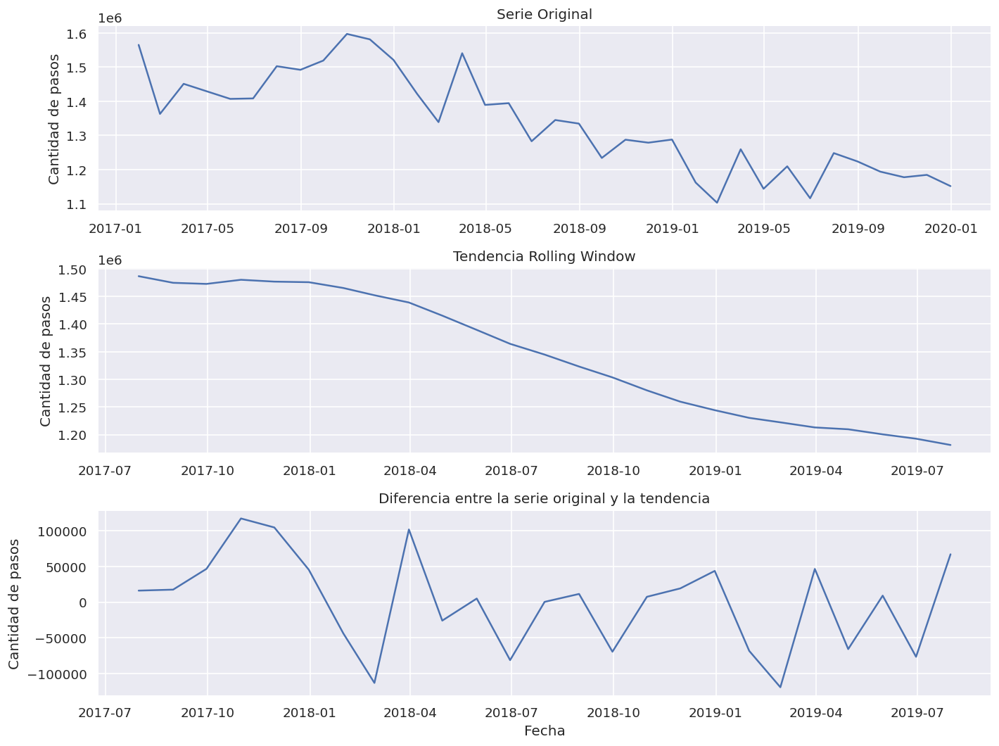

In [756]:
plt.figure(figsize = (12,9))

plt.subplot(3,1,1)
plt.title('Serie Original')
plt.plot(mensual.index, mensual.cantidad_pasos)
plt.ylabel('Cantidad de pasos')

plt.subplot(3,1,2)
plt.title('Tendencia Rolling Window')
plt.plot(mensual_promedio_tendencia)
plt.ylabel('Cantidad de pasos')

plt.subplot(3,1,3)
plt.title('Diferencia entre la serie original y la tendencia')
plt.plot(mensual.index, mensual.cantidad_pasos - mensual_promedio_tendencia)
plt.xlabel('Fecha')
plt.ylabel('Cantidad de pasos')

plt.tight_layout()
plt.show()

* **filtro Hodrick-Prescott para separar en tendencia**

In [757]:
ciclo, tend = sm.tsa.filters.hpfilter(mensual['cantidad_pasos'])
mensual['tend'] = tend

Text(0.5, 1.0, 'Variacion del flujo vehicular mensual con la tendencia.')

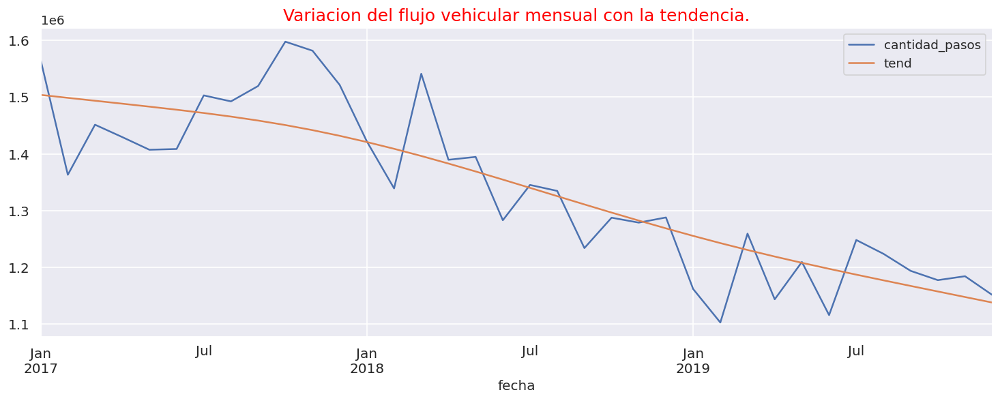

In [758]:
mensual[['cantidad_pasos', 'tend']].plot(figsize=(15,5),fontsize=12);
legend = plt.legend()
plt.title("Variacion del flujo vehicular mensual con la tendencia.", fontsize= 15 , color='red')

* **Descomposición de serie de tiempo**

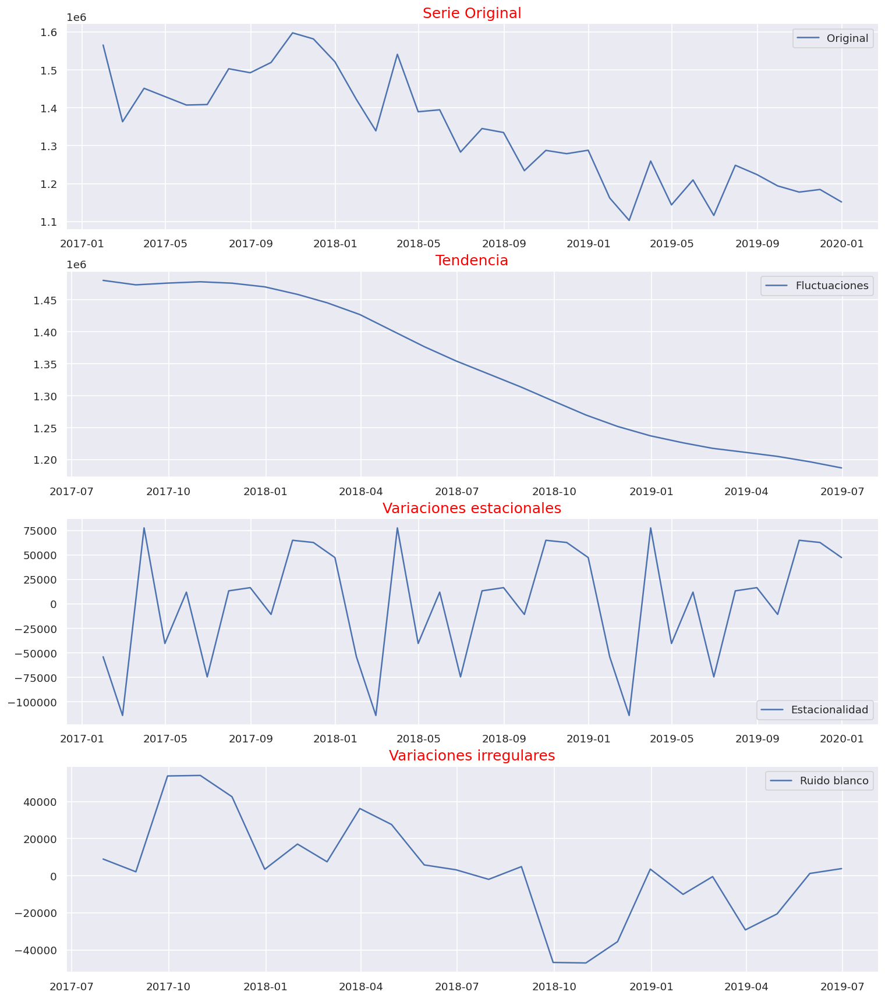

In [759]:
rcParams['figure.figsize'] = 15,18
descomposicion = sm.tsa.seasonal_decompose(mensual['cantidad_pasos'], model='additive')
trend = descomposicion.trend
seasonal = descomposicion.seasonal
residual = descomposicion.resid

plt.subplot(4,1,1)
plt.plot(mensual['cantidad_pasos'], label = 'Original')
plt.title('Serie Original', fontsize= 15 , color='red')
plt.legend(loc='mejor')
plt.subplot(4,1,2)
plt.plot(trend, label ='Fluctuaciones')
plt.title('Tendencia',fontsize= 15 , color='red')
plt.legend(loc='mejor')
plt.subplot(4,1,3)
plt.plot(seasonal, label = 'Estacionalidad')
plt.title('Variaciones estacionales', fontsize= 15 , color='red')
plt.legend(loc='mejor')
plt.subplot(4,1,4)
plt.plot(residual, label = 'Ruido blanco')
plt.title('Variaciones irregulares', fontsize= 15 , color='red')
plt.legend(loc='mejor')

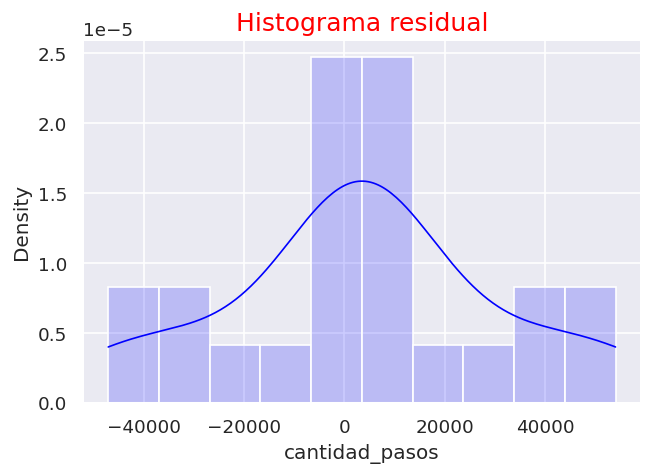

In [760]:
plt.figure(figsize = (6,4))
sns.histplot(data = residual, stat = "density",kde = True, line_kws= {"linewidth":1},color = "blue",alpha= 0.2)
plt.title('Histograma residual', fontsize= 15 , color='red')
plt.show()

* Con resamplear la serie en días se puede determinar los días con mayor flujo vehicular y sus horarios. 
* Resamplear la serie a una frecuencia mensual resulta informativo para entender la tendencia de la serie y la autocorrelación pero esta se vuelve acotada por lo que no se va a utilizar en los modelos para predecir el ultimo trimestre del 2019.
* Para predecir el último trimestre de 2019  se va a considerar una frecuencia diaria y semanal.

## **Machine Learning - Predicción a futuro**

La predicción de series de tiempo es el proceso de utilizar un modelo estadístico para predecir valores futuros de una serie de tiempo modelando la serie en función de su comportamiento pasado.

Para esto se estudia la autocorrelación es decir cuán parecida es la serie respecto a si misma en distintos momentos del tiempo es estudiando la autocorrelación. 

* **Debes implementar un modelo que prediga el tráfico en la autopista Illia para el último trimestre del 2019.**

Con el fin de conocer las predicciones del modelo, se establece
pronosticar el flujo vehicular en la autopista Illia  a partir del tercer trimestre del 2019.

* **Evalúa de forma apropiada tus resultados. Justifica la métrica elegida.**

Las métricas comúnmente utilizadas para juzgar los pronósticos son:
* Error de porcentaje absoluto medio (MAPE): Es la media de los errores porcentuales en valor absoluto, no considera el signo del error sólo la magnitud. 
* Error absoluto medio (MAE)
* Error de porcentaje medio (MPE): Es la media del error porcentual. Es una métrica simple, que sirve para ver si el error del pronóstico tiene un sesgo (bias) positivo o negativo. También se dice que el pronóstico está subestimado o sobrestimado.
* MSE (Mean Square Error): Es el promedio de los cuadrados de las diferencias de cada artículo en el periodo t y se utiliza para comparar la precisión entre diferentes métodos o criterios de pronóstico.
* Error cuadrático medio (RMSE): : Esta medida es la raíz del promedio de los cuadrados del error de cada artículo en el periodo t y también se utiliza para comparar la precisión de diferentes métodos de pronóstico. La diferencia con la anterior es que el resultado está en las unidades originales de la información histórica.

Por lo general, si se esta comparando pronósticos de dos series diferentes, se pueden usar MAPE debido a que son errores porcentuales que varían entre 0 y 1. De esa manera, puede juzgar qué tan bueno es el pronóstico independientemente de la escala de la serie. MAPE es una de las medidas más utilizadas a nivel mundial, pero no se recomienda para la selección de un método de pronóstico puesto que ésta presenta sesgos que favorece a los pronósticos que están por debajo de los valores reales.

Las otras métricas de error son cantidades. Eso implica que no puede estar en escaladas de tiempo diferentes.

Para este caso se escogio RMSE como metrica tanto para la serie diaria como la semanal ya que lo que se busca es seleccionar el modelo que mejor 

* **One-Step Prediction**

Vamos a entrenar un RandomForestRegressor para predecir el siguiente valor en la serie de tiempo semanal de cantidad_pasos. Utilizaremos del año 2017 al tercer trimestre de 2019 como conjunto de entrenamiento. Y el ultimo trimestre del 2019 como evaluación. 

* * **Modelo benchmark**

In [761]:
print(semanal.shape)
semanal

(158, 4)


,cantidad_pasos,var_diaria,fecha_numeros,tend
fecha,,,,
2017-01-01,31183.0,0.000000,736330,290899.568833
2017-01-08,347212.0,0.353784,736337,295970.624258
2017-01-15,366413.0,0.239592,736344,300879.356828
2017-01-22,357215.0,0.072845,736351,305495.469547
2017-01-29,354581.0,0.126785,736358,309729.623946
...,...,...,...,...
2019-12-08,282891.0,1.026164,737401,244521.307091
2019-12-15,272960.0,-0.048993,737408,239676.477136
2019-12-22,292881.0,0.049049,737415,234549.953550


In [762]:
semanal_mean = semanal['cantidad_pasos']

In [763]:
# 3ª trimestre 2019
fecha_inicio='2019-07-01'
fecha_final='2019-09-30'
X= semanal_mean [(semanal_mean.index >=fecha_inicio) & (semanal_mean.index <=fecha_final)]

# 4º trimestre 2019 = Ultimo trimestre  2019
fecha_inicio='2019-10-01'
fecha_final='2019-12-31'
y=semanal_mean [(semanal_mean.index >=fecha_inicio) & (semanal_mean.index <=fecha_final)]

y_t=X.rolling(window=1, center=True).mean()
benchmark_rmse =np.sqrt(mean_squared_error(y, y_t))

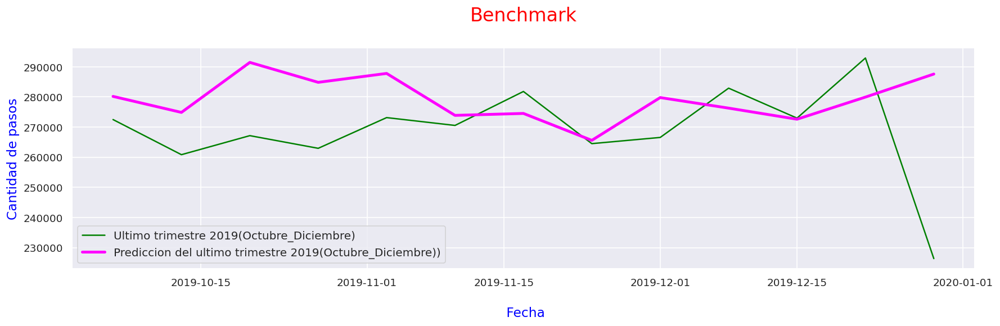

In [764]:
plt.figure(figsize=(15,5))
plt.plot(y.index, y,color='green', label='Ultimo trimestre 2019(Octubre_Diciembre)')
plt.plot(y.index, y_t, lw=3, color='magenta',label='Prediccion del ultimo trimestre 2019(Octubre_Diciembre))')
plt.title ('Benchmark\n', color='red', fontsize=20)
plt.xlabel('\n Fecha', color='blue',fontsize=14)
plt.ylabel('Cantidad de pasos', color='blue',fontsize=14)

plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

In [765]:
print(f'RMSE en Benchmark: {benchmark_rmse}')

RMSE en Benchmark: 20998.801062844588


El modelo Benchmark tiene un buen desempeño en cuanto a la predicción tiene un error RMSE 2999.8287232635216.

Ahora veamos que sucede trabajando con otros modelos y realizando una mejora de hiperparámetros.

Vamos a usar un modelo tradicional de Machine Learning, un Random Forest, veremos como es su comportamiento con sus parametros por defecto y luego lo optimizaremos.

# **Random forest**

In [766]:
data_rf = semanal_mean
data_rf

fecha
2017-01-01     31183.0
2017-01-08    347212.0
2017-01-15    366413.0
2017-01-22    357215.0
2017-01-29    354581.0
                ...   
2019-12-08    282891.0
2019-12-15    272960.0
2019-12-22    292881.0
2019-12-29    226390.0
2020-01-05     55970.0
Freq: W-SUN, Name: cantidad_pasos, Length: 158, dtype: float64

In [767]:
look_back = 12 # usamos 12 semanas de datos para predecir el valor siguiente

In [768]:
N = data_rf.shape[0]
X = np.zeros((N - look_back - 1,look_back))
y = np.zeros(N - look_back - 1)
print(X.shape, y.shape)

(145, 12) (145,)


In [769]:
for i in range(X.shape[0]):
    X[i,:] = data_rf.iloc[i:i+look_back]
    y[i] = data_rf.iloc[i+look_back]

In [770]:
print('Valores de X')
print(X)

Valores de X
[[ 31183. 347212. 366413. ... 304908. 321494. 330794.]
 [347212. 366413. 357215. ... 321494. 330794. 319083.]
 [366413. 357215. 354581. ... 330794. 319083. 333297.]
 ...
 [279927. 287568. 272483. ... 264500. 266555. 282891.]
 [287568. 272483. 260840. ... 266555. 282891. 272960.]
 [272483. 260840. 267147. ... 282891. 272960. 292881.]]


In [771]:
print('Valores de y')
print(y)

Valores de y
[319083.  333297.  342359.  304912.  342225.  350946.  325875.  309072.
 324240.  307054.  319937.  335147.  328122.  316651.  335900.  323159.
 347770.  357156.  342240.  345164.  334245.  337243.  316987.  337659.
 337933.  374520.  353999.  357671.  369918.  377832.  342571.  366650.
 353947.  375644.  377263.  359053.  371970.  364991.  365063.  327602.
 309692.  300242.  315780.  328359.  327887.  340275.  348044.  318733.
 325966.  349768.  346506.  352713.  361465.  325545.  323725.  339255.
 325904.  322154.  287470.  324115.  325304.  310709.  307369.  314291.
 296834.  288154.  292119.5 310012.  312335.  314517.  294270.  300955.
 301407.  308307.  290940.  293436.  298932.  284913.  295210.  278806.5
 247986.  312089.  296381.  304897.  307134.  294310.  307352.  288934.
 270948.5 320481.  315645.  314832.  250861.  246994.  267123.  252617.
 259019.  276568.  258204.  273664.  284439.  288919.  285547.  278834.
 276714.  298638.  267797.  266745.  265423.  2732

In [772]:
N_train = 144- look_back # cantidad de instancias que vamos a usar para entrenar. look_back = 12 semanas 
N_test = 12  #cantidad de puntos que vamos a usar para evaluar
N_total = N_train + N_test

length_total = N_train + N_test + look_back

X_train = X[:N_train,:]
y_train = y[:N_train]
print(X_train.shape, y_train.shape)

X_test = X[N_train:N_train+N_test,:]
y_test = y[N_train:N_train+N_test]
print(X_test.shape, y_test.shape)

(132, 12) (132,)
(12, 12) (12,)


In [773]:
y_test = y[N_train:N_train+N_test]
print(y_test)

[272483. 260840. 267147. 262950. 273129. 270536. 281790. 264500. 266555.
 282891. 272960. 292881.]


Entrenamos

In [774]:
random_forest = RandomForestRegressor( random_state=42, n_jobs = -1) #Con -1 se utilizala cantidad maxima

In [775]:
random_forest.fit(X_train,y_train)

RandomForestRegressor(n_jobs=-1, random_state=42)

In [776]:
y_train_pred = random_forest.predict(X_train)
y_test_pred = random_forest.predict(X_test)

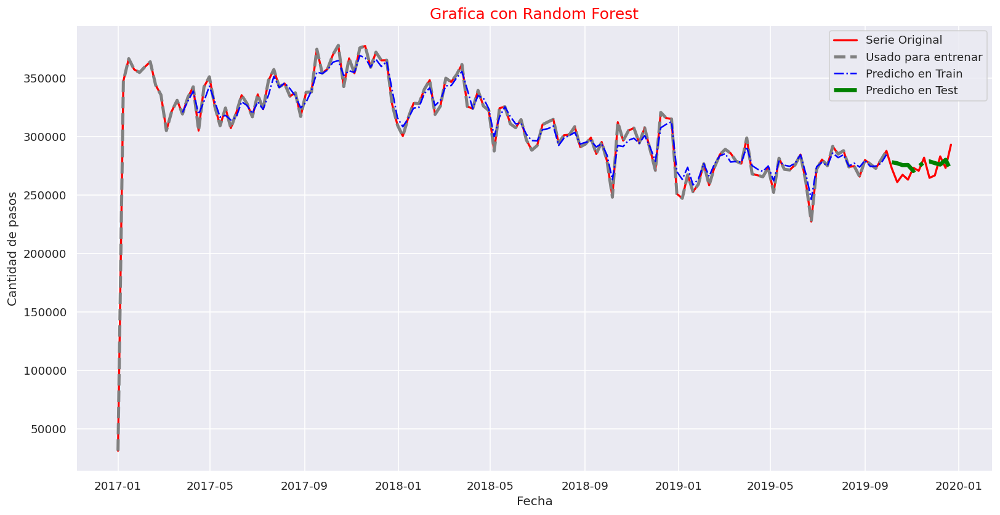

In [777]:
plt.figure(figsize=(16,8))
plt.plot(data_rf.index[:length_total], data_rf[:length_total],lw = 2, color='red', label = 'Serie Original')
plt.plot(data_rf.index[:N_train + look_back], data_rf[:N_train + look_back],'--', lw = 3,color='grey',label = 'Usado para entrenar')
plt.plot(data_rf.index[look_back: look_back + N_train], y_train_pred,'-.',color='blue',label = 'Predicho en Train')
plt.plot(data_rf.index[N_train+look_back: length_total], y_test_pred,'-.',color='green', lw = 4, label = 'Predicho en Test')
plt.title ('Grafica con Random Forest', color='red', fontsize=15)
plt.legend()
plt.xlabel('Fecha')
plt.ylabel('Cantidad de pasos')
plt.show()

In [778]:
rmse =np.sqrt( mean_squared_error(y_train, y_train_pred))
print('RMSE en Train:',rmse)

rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
print('RMSE en Test:',rmse)

RMSE en Train: 6887.61404029809
RMSE en Test: 10964.807311433557


In [779]:
tss= TimeSeriesSplit(n_splits=2)

In [780]:
param_dist = {'n_estimators':[ 20, 50,100,200],
              'max_depth': [i for i in range(2,20)],
              'max_features': ['auto', 'sqrt', 'log2']}

In [781]:
random_search = RandomizedSearchCV(random_forest, param_dist,n_iter=20, random_state=42, scoring="neg_root_mean_squared_error", cv=tss)
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=2, test_size=None),
                   estimator=RandomForestRegressor(n_jobs=-1, random_state=42),
                   n_iter=20,
                   param_distributions={'max_depth': [2, 3, 4, 5, 6, 7, 8, 9,
                                                      10, 11, 12, 13, 14, 15,
                                                      16, 17, 18, 19],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'n_estimators': [20, 50, 100, 200]},
                   random_state=42, scoring='neg_root_mean_squared_error')

In [782]:
print("Mejores parametros: "+str(random_search.best_params_))
print("Mejor Score: "+str(random_search.best_score_)+'\n')

Mejores parametros: {'n_estimators': 200, 'max_features': 'auto', 'max_depth': 15}
Mejor Score: -23325.6617071604



**Random forest con mejores hiperparámetros**

In [783]:
random_forest_optimo = RandomForestRegressor(
    max_depth= 15,
    max_features= 'auto',
    n_estimators= 200)

In [784]:
random_forest_optimo.fit(X_train, y_train)

RandomForestRegressor(max_depth=15, n_estimators=200)

In [785]:
y_train_pred_rf = random_forest_optimo.predict(X_train)
y_test_pred_rf = random_forest_optimo .predict(X_test)

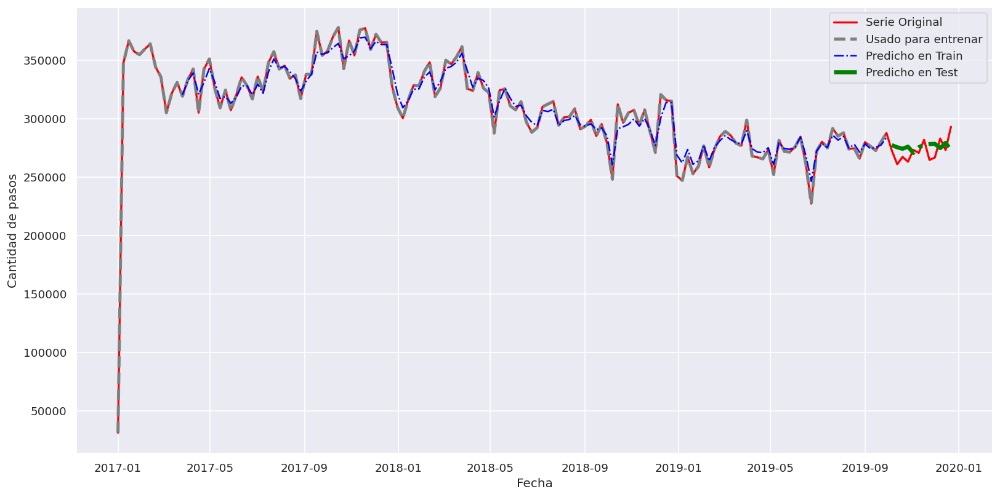

In [786]:
plt.figure(figsize=(16,8))
plt.plot(data_rf.index[:length_total], data_rf[:length_total],lw = 2, color='red', label = 'Serie Original')
plt.plot(data_rf.index[:N_train + look_back], data_rf[:N_train + look_back],'--', lw = 3,color='grey',label = 'Usado para entrenar')
plt.plot(data_rf.index[look_back: look_back + N_train], y_train_pred_rf,'-.',color='blue',label = 'Predicho en Train')
plt.plot(data_rf.index[N_train+look_back: length_total], y_test_pred_rf,'-.',color='green', lw = 4, label = 'Predicho en Test')
plt.legend()
plt.xlabel('Fecha')
plt.ylabel('Cantidad de pasos')
plt.show()

In [787]:
rmse_train_rf = np.sqrt(mean_squared_error(y_train, y_train_pred_rf))
print('RMSE  en Train:',rmse_train_rf)

RMSE  en Train: 7023.190115683227


In [788]:
rmse_test_rf = np.sqrt(mean_squared_error(y_test, y_test_pred_rf))
print('RMSE en Test:',rmse_test_rf)

RMSE en Test: 10492.8781078199


* ¿Qué variables fueron relevantes para el modelo para hacer la predicción?

Graficamos la importancia de cada feature.

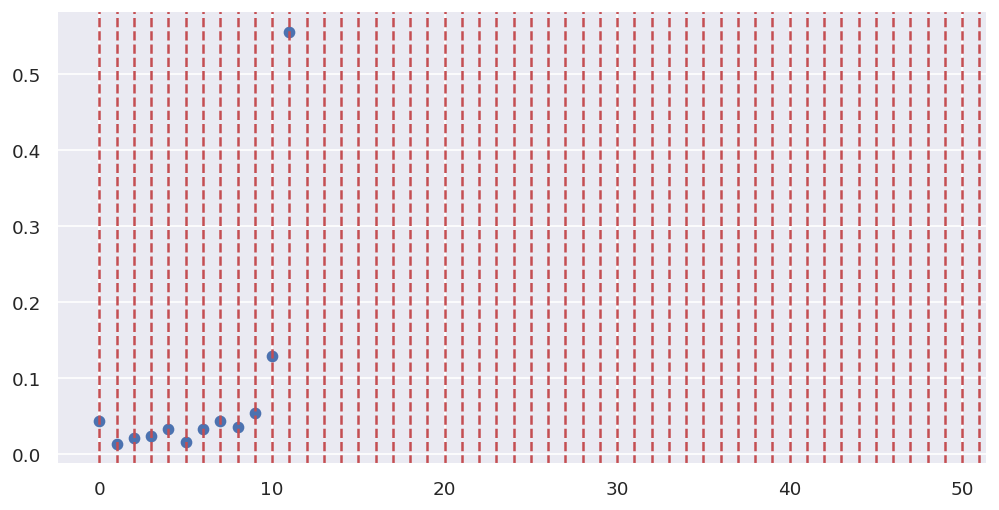

In [789]:
plt.figure(figsize = (10,5))
plt.scatter(np.arange(random_forest.feature_importances_.size),random_forest.feature_importances_)
for x in np.arange(52):
    plt.axvline(x, linestyle ='--', color= 'r')
plt.show()

In [790]:
impotances =  pd.DataFrame(random_forest.feature_importances_,)
impotances

,0
0,0.043408
1,0.013795
2,0.020551
3,0.023322
4,0.032312
5,0.015230
6,0.033231
7,0.043684
8,0.036172
9,0.053428


En el grafico podemos observar en el eje Y la importancia de las variables y en el eje X los valoress de los registros. El registro cero tiene mucha importancia por ser el valor inicial, al igual la semana 7, 10 y el ultimo registro que seria las 11 semanas.

* **Predicción**

In [791]:
rf_results_pred_2019 = pd.DataFrame()
rf_results_pred_2019['fecha'] = data_rf.index[N_train+look_back: length_total]
rf_results_pred_2019['Pred rf'] = y_test_pred_rf
rf_results_pred_2019

,fecha,Pred rf
0,2019-10-06,277163.4775
1,2019-10-13,275370.8925
2,2019-10-20,274089.3325
3,2019-10-27,275882.2925
4,2019-11-03,270546.5400
5,2019-11-10,275289.5600
6,2019-11-17,277590.2350
7,2019-11-24,278097.7875
8,2019-12-01,278285.3050
9,2019-12-08,274615.7975


# **Pronóstico a futuro**

Hasta el momento hemos utilizado un modelo tradicional de Machine Learning  pero ahora nos enfocaremos en usar modelos que son para este tipo de problemas como es un modelo arima, donde vamos a predecir el comportamiento del cuarto trimestre del 2019.

# **Modelo Arima**

Teniendo en cuenta los valores arrojados en las autocorrelaciones, usaremos un modelo ARIMA el cual está formado por, una parte autorregresiva (AR) y otra de media móvil (MA) mas la diferenciasion (d). ESte modelo utiliza variaciones y regresiones de datos a fin de encontrar patrones para una predicción futura mas eficiente.

Para saber los tipos de modelo AR y MA, es preciso observar las funciones de autocorrelación parcial y autocorrelación
simple respectivamente.

Los modelos ARIMA **(𝑝, 𝑑, 𝑞)**
* p: 'Auto regresivo' (AR). Se refiere al número de rezagos que se utilizarán como predictores.
* d: es el número mínimo de diferenciaciones necesarias para que la serie sea estacionaria.
* q: 'Media móvil' (MA). Se refiere al número de errores de pronóstico retrasados ​​que deben incluirse en el modelo ARIMA.

Se utiliza el  modelo ARIMA para encontrar el conjunto optimo de parámetros que produzcan el mejor rendimiento en el modelo y pronosticar datos de series temporales. A través de la función **ARIMA() de la librería statsmodels** es posible obtener la evaluación del modelo de acuerdo a sus parámetros 𝑝, 𝑑, 𝑞.

Los modelos ARIMA son especialmente útiles en el tratamiento de series que presentan patrones estacionales

* **Diario**

In [792]:
diario.cantidad_pasos

0       31183.0
1       51568.0
2       51093.0
3       53332.0
4       56486.0
         ...   
1090    40182.0
1091    30681.0
1092    26259.0
1093    34523.0
1094    21447.0
Name: cantidad_pasos, Length: 1095, dtype: float64

In [793]:
diario.reset_index(inplace=True) 

In [794]:
diario

,index,fecha,cantidad_pasos,var_diaria,fecha_numeros,tend
0,0,2017-01-01,31183.0,NaN,736330,47372.157293
1,1,2017-01-02,51568.0,0.653722,736331,47802.705594
2,2,2017-01-03,51093.0,-0.009211,736332,48223.135672
3,3,2017-01-04,53332.0,0.043822,736333,48625.682612
4,4,2017-01-05,56486.0,0.059139,736334,49004.375166
...,...,...,...,...,...,...
1090,1090,2019-12-27,40182.0,0.052767,737420,32942.342939
1091,1091,2019-12-28,30681.0,-0.236449,737421,32126.428865
1092,1092,2019-12-29,26259.0,-0.144128,737422,31297.123801
1093,1093,2019-12-30,34523.0,0.314711,737423,30460.144199


In [795]:
train_diario = diario.loc[(diario['fecha'] < '2019-10-01')] 

In [796]:
test_diario = diario.loc[(diario['fecha'] >= '2019-10-01')] 

In [797]:
len(test_diario)

92

Separamos nuestros datos en train y test, donde vamos a utilizar el train los datos desde el 2017 hasta el tercer trimestre del 2019.

*  **Orden de diferenciación (d) en el modelo ARIMA**

Se va a validar si la serie es estacionaria o no mediante la Prueba de Dickey-Fuller.
La hipótesis nula de la prueba ADF es que la serie de tiempo no es estacionaria. Entonces, si el valor p de la prueba es menor que el nivel de significancia (0.05), entonces rechaza la hipótesis nula e infiere que la serie de tiempo es estacionaria.

In [798]:
def adfuller_test(ultimas_semanas):
    result=adfuller(diario['cantidad_pasos'])
    labels = ['ADF Test Statistic','p-value','#Rezagos usados','Número de observaciones']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )

    if result[1] <= 0.05:
      print("Se rechaza la hipótesis nula. La serie de tiempo es estacionaria")
    else:
      print("Poca evidencia en contra de la hipótesis nula. La serie de tiempo NO es estacionaria")

print(adfuller_test(diario))

ADF Test Statistic : -1.6433053805806985
p-value : 0.46053416221288174
#Rezagos usados : 20
Número de observaciones : 1074
Poca evidencia en contra de la hipótesis nula. La serie de tiempo NO es estacionaria
None


Dado que el valor P es mayor que el nivel de significancia, debemos covertirla primero en estacionaria.
Se deberá probar distintos ordenes de diferenciación hasta encontrar un p-valor significativo en la prueba de Dickey-Fuller, es decir, llevamos la serie un periodo de retraso.

In [799]:
diario_diff = diario.diff(periods=1)

In [800]:
diario_diff = diario_diff[1:]
diario_diff.head()

,index,fecha,cantidad_pasos,var_diaria,fecha_numeros,tend
1,1.0,1 days,20385.0,NaN,1.0,430.548301
2,1.0,1 days,-475.0,-0.662933,1.0,420.430078
3,1.0,1 days,2239.0,0.053033,1.0,402.546940
4,1.0,1 days,3154.0,0.015317,1.0,378.692554
5,1.0,1 days,595.0,-0.048605,1.0,351.808366


In [801]:
def adfuller_test(ultimas_semanas):
    result_2=adfuller(diario_diff['cantidad_pasos'])
    labels = ['ADF Test Statistic','p-value','#Rezagos usados','Número de observaciones']
    for value,label in zip(result_2,labels):
        print(label+' : '+str(value) )

    if result_2[1] <= 0.05:
      print("Se rechaza la hipótesis nula. La serie de tiempo es estacionaria")
    else:
      print("Poca evidencia en contra de la hipótesis nula. La serie de tiempo NO es estacionaria")

print(adfuller_test(diario.diff(1)))

ADF Test Statistic : -12.490631034533195
p-value : 2.9509472218794464e-23
#Rezagos usados : 19
Número de observaciones : 1074
Se rechaza la hipótesis nula. La serie de tiempo es estacionaria
None


Con una diferencia, la serie se vuelve estacionaria, el valor de la prueba de dicky fuller es menor a 0.05.
El orden de diferenciación (d) es 1

Para determinar los órdenes p y q de las componentes AR(p) y MA(q) se utiliza mediante las funciones de autocorrelación y autocorrelación parcial.

* **Orden del término AR (p)**

Para definir el número requerido de términos AR se realiza inspeccionando el gráfico de Autocorrelación parcial (PACF)

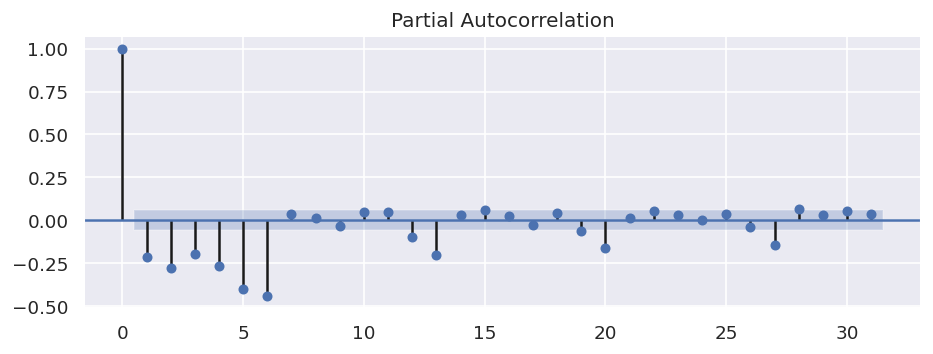

In [802]:
plt.rcParams.update({'figure.figsize':(9,3), 'figure.dpi':120})

plot_pacf(diario_diff['cantidad_pasos'])
plt.show()

Se puede observar que el primer rezago es bastante significativo ya que está muy por encima del límite de significancia (región azul). Por tanto, el orden del termino AR (p) es 6.

* **Orden del término MA (q)**

De la misma forma que observamos el gráfico PACF para el número de términos AR, puede mirar el gráfico ACF para el número de términos MA. Un término MA es técnicamente el error del pronóstico retrasado.

El ACF indica cuántos términos MA se requieren para eliminar cualquier autocorrelación en la serie estacionarizada.

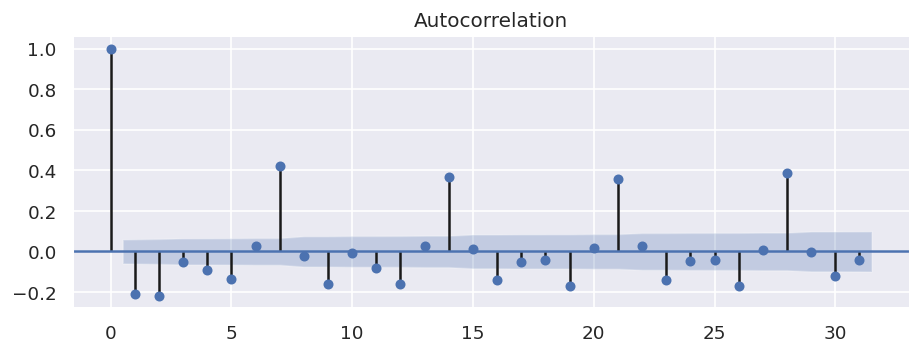

In [803]:
plot_acf(diario_diff['cantidad_pasos'])
plt.show()

El orden del término MA (q) es 2.

## **Construcción del Modelo ARIMA**

Ahora que se ha determinado los valores de **p, d y q**, se puede ajustar el modelo ARIMA.

In [804]:
model=ARIMA(train_diario.cantidad_pasos, order=(6,1,2))
# Ajustar el modelo 
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:       D.cantidad_pasos   No. Observations:                 1002
Model:                 ARIMA(6, 1, 2)   Log Likelihood               -9961.462
Method:                       css-mle   S.D. of innovations           5019.275
Date:                Thu, 16 Dec 2021   AIC                          19942.925
Time:                        15:42:44   BIC                          19992.022
Sample:                             1   HQIC                         19961.583
                                                                              
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -7.4178     32.012     -0.232      0.817     -70.159      55.324
ar.L1.D.cantidad_pasos    -0.6952      0.066    -10.454      0.000      -0.826      -0.565
ar.L

Como se puede observar se imprime un resumen del modelo ajustado. Esto resume los valores de los coeficientes utilizados y la técnica de ajuste para las observaciones dentro de la muestra.

La tabla en el medio es la tabla de coeficientes donde los valores debajo de 'coef' son los pesos de los términos respectivos.
se debe mirar P>Z que sean menores de 0.05 para q sea significativo sino hay q empezar a bajar el modelo, en este caso ma esta por encima.

Ahora, reconstruyamos el modelo sin el término ma

In [805]:
model=ARIMA(train_diario.cantidad_pasos, order=(6,1,0))
# Ajustar el modelo 
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:       D.cantidad_pasos   No. Observations:                 1002
Model:                 ARIMA(6, 1, 0)   Log Likelihood               -9961.463
Method:                       css-mle   S.D. of innovations           5019.280
Date:                Thu, 16 Dec 2021   AIC                          19938.927
Time:                        15:42:46   BIC                          19978.205
Sample:                             1   HQIC                         19953.853
                                                                              
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -7.4012     31.945     -0.232      0.817     -70.013      55.210
ar.L1.D.cantidad_pasos    -0.6944      0.028    -24.904      0.000      -0.749      -0.640
ar.L

El modelo mejoro ya que el termino A**IC** se ha reducido paso de 21799.027 a 21795.108. Los valores P de los términos AR son altamente significativos (<< 0.05).

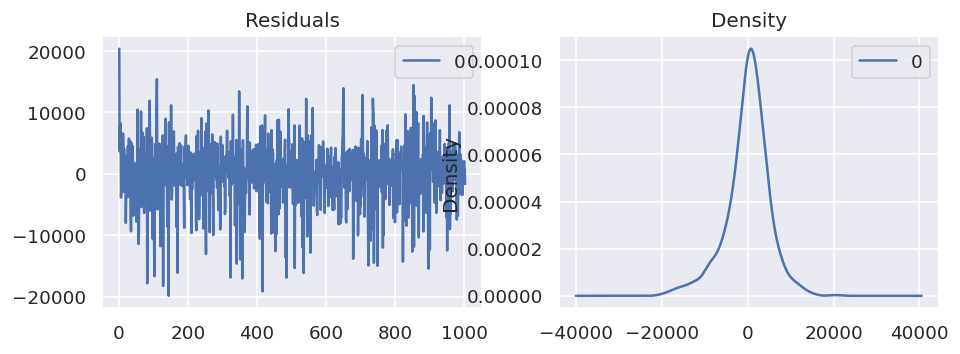

In [806]:
residuals = pd.DataFrame(model_fit.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.show()

In [807]:
residuals.describe()

,0
count,1002.000000
mean,38.060080
std,5051.173330
min,-19881.300744
25%,-2188.360005
50%,488.529596
75%,2871.200448
max,20392.401191


Los errores residuales parecen estar bien con una media cercana a cero y una varianza uniforme

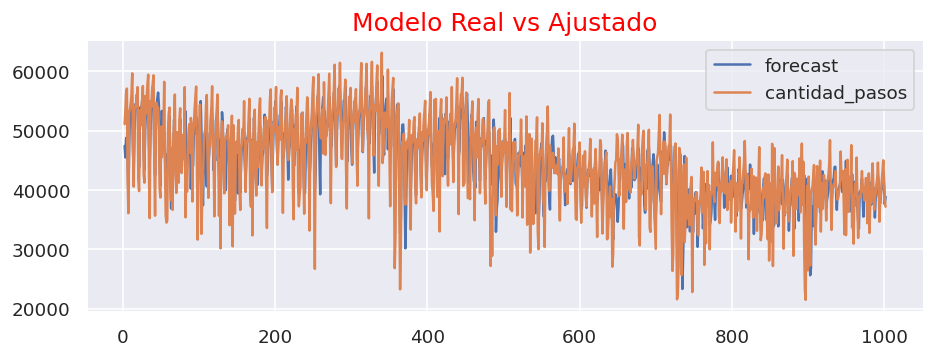

In [808]:
model_fit.plot_predict(dynamic=False)
plt.title("Modelo Real vs Ajustado", fontsize= 15 , color='red')
plt.show()

In [809]:
fc, se, conf = model_fit.forecast(92, alpha=0.05) # 95% conf

esta dando los intervalos de confianza que se estan guardando en conf.

In [810]:
y_pred = fc
y_true = test_diario.cantidad_pasos
rmse = np.sqrt(mean_squared_error(y_true,y_pred))
print(f'RMSE de Arima Diario: {rmse}')

RMSE de Arima Diario: 6079.851615782682


la funcion **auto_arima()**  función de la ‘pmdarima’ biblioteca nos ayuda a buscar múltiples combinaciones de parámetros p, d, q y elige el mejor modelo que tiene el menor AIC.

In [811]:
model_2 = auto_arima(diario.cantidad_pasos, start_p=1, start_q=1,
                      max_p=10, max_q=10, # maximum p and q
                      seasonal=True,   # No Seasonality
                      start_P=0, 
                      D=1, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True)
print(model_2.summary())

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=22118.926, Time=1.50 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=22513.815, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=22471.302, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=22227.289, Time=0.65 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=22511.817, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=22099.600, Time=1.04 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=22388.887, Time=0.19 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=22093.733, Time=0.66 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=22350.688, Time=0.24 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=22032.295, Time=0.75 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=22276.043, Time=0.35 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=21937.654, Time=0.84 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=22092.545, Time=0.50 sec
 ARIMA(6,1,1)(0,0,0)[0] intercept   : AIC=21842.249, Time=1.79 sec
 ARIMA(6,1,0)(0,0,0

Finalmente, se ajusta los parámetros de los modelos AR y MA hasta satisfacer un 
criterio de calidad de ajuste (AIC).
Podemos ver que el mejor modelo ARIMA parece ser del orden (10,1,2) con la puntuación mínima de AIC = 21799.518. Con esto podemos proceder a entrenar y ajustar el modelo para comenzar a hacer predicciones.

Ahora se va a realizar la predicción para los últimos 3 meses del 2019 de la serie de tiempo. **Octubre 2019 a diciembre 2019.**

In [812]:
model_2.fit(train_diario.cantidad_pasos) 

ARIMA(order=(10, 1, 2), scoring_args={}, suppress_warnings=True,
      with_intercept=False)

In [813]:
train_diario.set_index('fecha',inplace=True) 

In [814]:
test_diario.set_index('fecha',inplace=True) 

In [815]:
pred_1 = model_2.predict(n_periods =92, return_conf_int=False) 

In [816]:
predicciones_1 = pd.Series(data=pred_1, index=test_diario.cantidad_pasos.index)
predicciones_1.head()

fecha
2019-10-01    38947.208559
2019-10-02    40273.889551
2019-10-03    42875.172478
2019-10-04    43958.836329
2019-10-05    41397.543877
dtype: float64

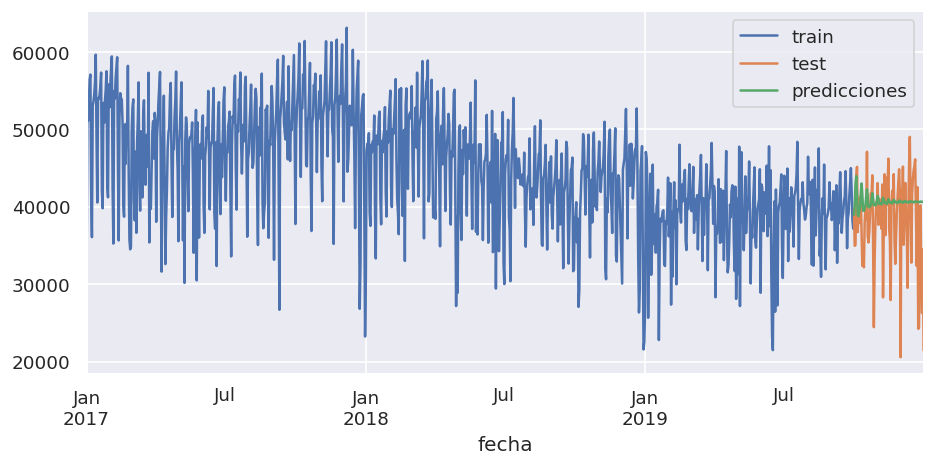

In [817]:
fig, ax = plt.subplots(figsize=(9, 4))
train_diario.cantidad_pasos.plot(ax=ax, label='train')
test_diario.cantidad_pasos.plot(ax=ax, label='test')
predicciones_1.plot(ax=ax, label='predicciones')
ax.legend();

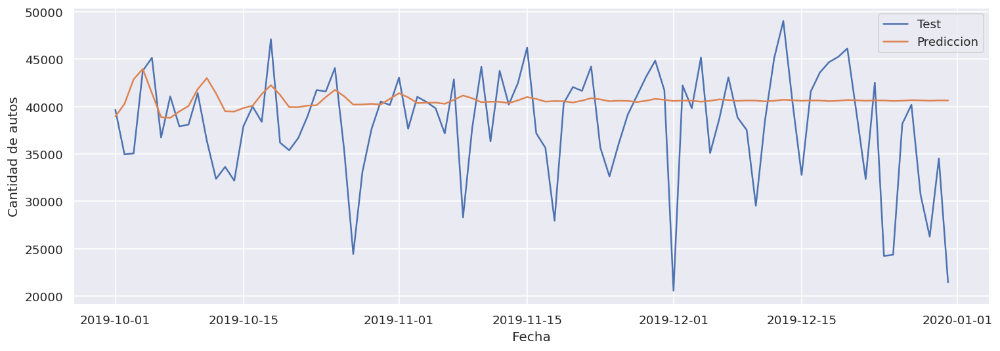

In [818]:
plt.figure(figsize=(15,5))
plt.plot(test_diario.cantidad_pasos, label='Test') 
plt.plot(predicciones_1, label='Prediccion') 
plt.xlabel('Fecha')
plt.ylabel('Cantidad de autos')
plt.legend()
plt.show()

En los gráficos podemos ver que es bastante obvio que el pronóstico esta muy lejos. Nuestro modelo predice variaciones muy pequeñas en comparación con lo que ocurre en la realidad del día a día.

In [819]:
y_pred = predicciones_1
y_true = test_diario.cantidad_pasos
rmse = np.sqrt(mean_squared_error(y_true,y_pred))
print(f'RMSE de Auto_arima Diario: {rmse}')

RMSE de Auto_arima Diario: 6219.173903914942


In [820]:
error_mse = mean_squared_error(
                y_true = test_diario.cantidad_pasos,
                y_pred = predicciones_1
            )
print(f"Error de test (mse): {error_mse}")

Error de test (mse): 38678124.04713662


* **Semanal**

In [821]:
semanal.cantidad_pasos

fecha
2017-01-01     31183.0
2017-01-08    347212.0
2017-01-15    366413.0
2017-01-22    357215.0
2017-01-29    354581.0
                ...   
2019-12-08    282891.0
2019-12-15    272960.0
2019-12-22    292881.0
2019-12-29    226390.0
2020-01-05     55970.0
Freq: W-SUN, Name: cantidad_pasos, Length: 158, dtype: float64

In [822]:
semanal.reset_index(inplace=True) 

In [823]:
semanal

,fecha,cantidad_pasos,var_diaria,fecha_numeros,tend
0,2017-01-01,31183.0,0.000000,736330,290899.568833
1,2017-01-08,347212.0,0.353784,736337,295970.624258
2,2017-01-15,366413.0,0.239592,736344,300879.356828
3,2017-01-22,357215.0,0.072845,736351,305495.469547
4,2017-01-29,354581.0,0.126785,736358,309729.623946
...,...,...,...,...,...
153,2019-12-08,282891.0,1.026164,737401,244521.307091
154,2019-12-15,272960.0,-0.048993,737408,239676.477136
155,2019-12-22,292881.0,0.049049,737415,234549.953550
156,2019-12-29,226390.0,0.129764,737422,229211.917507


In [824]:
train_semanal = semanal.loc[(semanal['fecha'] < '2019-10-01')] 

In [825]:
test_semanal= semanal.loc[(semanal['fecha'] >= '2019-10-01')] 

In [826]:
len(test_semanal)

14

* **Orden de diferenciación (d) en el modelo ARIMA**

In [827]:
def adfuller_test(ultimas_semanas):
    result=adfuller(semanal['cantidad_pasos'])
    labels = ['ADF Test Statistic','p-value','#Rezagos usados','Número de observaciones']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )

    if result[1] <= 0.05:
      print("Se rechaza la hipótesis nula. La serie de tiempo es estacionaria")
    else:
      print("Poca evidencia en contra de la hipótesis nula. La serie de tiempo NO es estacionaria")

print(adfuller_test(semanal))

ADF Test Statistic : -0.6271926074236175
p-value : 0.8647184773952945
#Rezagos usados : 2
Número de observaciones : 155
Poca evidencia en contra de la hipótesis nula. La serie de tiempo NO es estacionaria
None


In [828]:
semanal_diff = semanal.diff(periods=1)

In [829]:
semanal_diff = semanal_diff[1:]

In [830]:
def adfuller_test(ultimas_semanas):
    result_2=adfuller(semanal_diff['cantidad_pasos'])
    labels = ['ADF Test Statistic','p-value','#Rezagos usados','Número de observaciones']
    for value,label in zip(result_2,labels):
        print(label+' : '+str(value) )

    if result_2[1] <= 0.05:
      print("Se rechaza la hipótesis nula. La serie de tiempo es estacionaria")
    else:
      print("Poca evidencia en contra de la hipótesis nula. La serie de tiempo NO es estacionaria")

print(adfuller_test(semanal.diff(1)))

ADF Test Statistic : -9.812882709746663
p-value : 5.596043426134321e-17
#Rezagos usados : 1
Número de observaciones : 155
Se rechaza la hipótesis nula. La serie de tiempo es estacionaria
None


La d es igual a 1

* **Orden del término AR (p)**

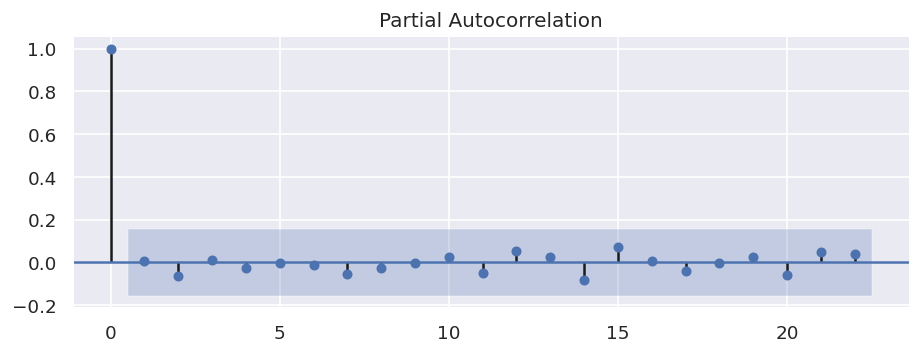

In [831]:
plt.rcParams.update({'figure.figsize':(9,3), 'figure.dpi':120})

plot_pacf(semanal_diff['cantidad_pasos'])
plt.show()

p es igual a 0

* **orden del término MA (q)**

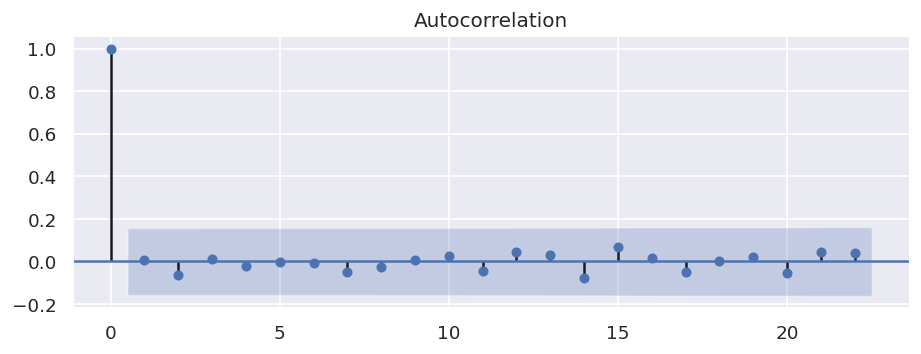

In [832]:
plot_acf(semanal_diff['cantidad_pasos'])
plt.show()

la q es 0 

* **Construir el modelo ARIMA**

In [833]:
model3=ARIMA(train_semanal.cantidad_pasos, order=(0,1,0))
# Ajustar el modelo 
model3_fit = model3.fit(disp=0)
print(model3_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:       D.cantidad_pasos   No. Observations:                  143
Model:                 ARIMA(0, 1, 0)   Log Likelihood               -1686.853
Method:                           css   S.D. of innovations          32120.088
Date:                Thu, 16 Dec 2021   AIC                           3377.706
Time:                        15:44:23   BIC                           3383.632
Sample:                             1   HQIC                          3380.114
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1792.9021   2686.017      0.667      0.506   -3471.594    7057.398


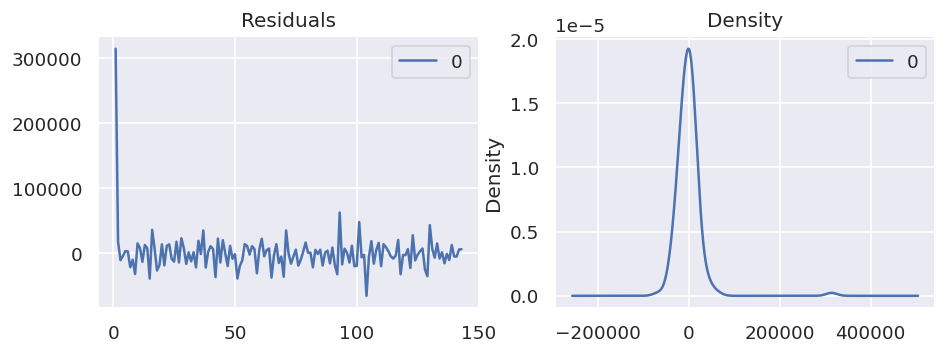

In [834]:
residuals = pd.DataFrame(model3_fit.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.show()

Los errores residuales parecen estar bien con una media cercana a cero y una varianza uniforme

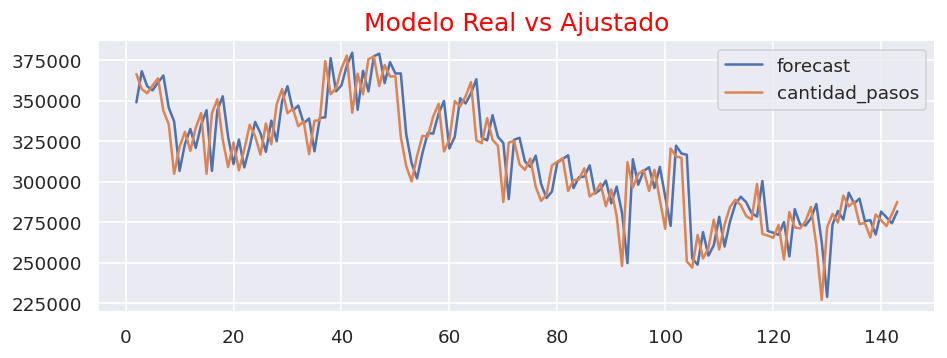

In [835]:
model3_fit.plot_predict(dynamic=False)
plt.title("Modelo Real vs Ajustado", fontsize= 15 , color='red')
plt.show()

In [836]:
fc, se, conf = model3_fit.forecast(14, alpha=0.05)

In [837]:
y_pred = fc
y_true = test_semanal.cantidad_pasos
rmse = np.sqrt(mean_squared_error(y_true,y_pred))
print(f'RMSE de Arima Semanal: {rmse}')

RMSE de Arima Semanal: 76671.68073552498


* **Modelo Auto_arima**

In [838]:
model_4 = auto_arima(semanal.cantidad_pasos, start_p=1, start_q=1,
                      max_p=10, max_q=10, # maximum p and q
                      seasonal=True,   # No Seasonality
                      start_P=0, 
                      D=1, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True)
print(model_4.summary())

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3794.399, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3727.309, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3793.587, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3728.796, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3725.316, Time=0.01 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.323 seconds
                           Statespace Model Results                           
Dep. Variable:                      y   No. Observations:                  158
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -1861.658
Date:                Thu, 16 Dec 2021   AIC                           3725.316
Time:                        15:44:25   BIC                           3728.372
Sample:                             0   HQIC                          3726.557
                                - 158                                       

In [839]:
model_4.fit(train_semanal.cantidad_pasos) 

ARIMA(order=(0, 1, 0), scoring_args={}, suppress_warnings=True,
      with_intercept=False)

In [840]:
train_semanal.set_index('fecha',inplace=True) 

In [841]:
test_semanal.set_index('fecha',inplace=True) 

In [842]:
pred_1 = model_4.predict(n_periods =14, return_conf_int=False) 

In [843]:
predicciones_semanal = pd.Series(data=pred_1, index=test_semanal.cantidad_pasos.index)
predicciones_semanal.head()

fecha
2019-10-06    287568.0
2019-10-13    287568.0
2019-10-20    287568.0
2019-10-27    287568.0
2019-11-03    287568.0
dtype: float64

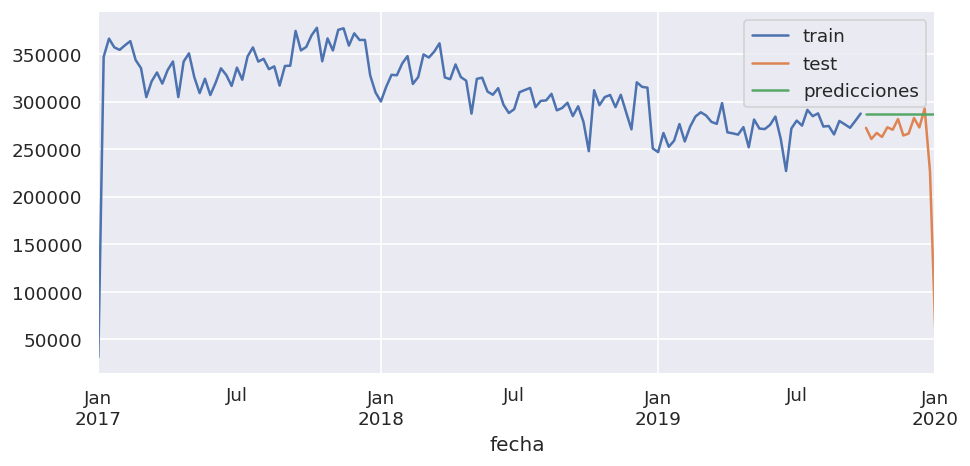

In [844]:
fig, ax = plt.subplots(figsize=(9, 4))
train_semanal.cantidad_pasos.plot(ax=ax, label='train')
test_semanal.cantidad_pasos.plot(ax=ax, label='test')
predicciones_semanal.plot(ax=ax, label='predicciones')
ax.legend();

En el grafico la linea verde, se puede ver que con este modelo no es muy bueno para hacer predicciones 

In [845]:
y_pred_1 = predicciones_semanal
y_true_1 = test_semanal.cantidad_pasos
rmse = np.sqrt(mean_squared_error(y_true_1,y_pred_1))
print(f'RMSE de Auto_arima Semanal: {rmse}')

RMSE de Auto_arima Semanal: 66070.59073769941


Se propone utilizar la libreria prophet para hacer la predicción del flujo de vehiculos para el año 2020, a partir de los datos del 2019. con una frecuencia diaria.

## **Modelo prophet**


El modelo Prophet de Facebook, que utiliza el ajuste de curvas para descomponer las series de tiempo, teniendo en cuenta la estacionalidad en múltiples escalas de tiempo, puntos de cambio abruptos y tendencias a largo plazo.

🔹 Se define la especificación del modelo a utilizar. En este caso, se utiliza el modelo Prophet, un modelo muy conocido desarrollado por Facebook.

* La librería exige que los datos esten dividos en dos columnas llamadas "ds" e "y". En la columna "ds", contendrá los valores de las fechas en un formato datetime, y para la variable "y", los datos que queremos pronosticar. 
Por lo tanto renombraremos los campos para preparar los datos para el modelo: y = cantidad de pasos, ds = fecha

* **Serie Daria**

In [846]:
diario.reset_index(inplace=True,drop=False)
diario

,level_0,index,fecha,cantidad_pasos,var_diaria,fecha_numeros,tend
0,0,0,2017-01-01,31183.0,NaN,736330,47372.157293
1,1,1,2017-01-02,51568.0,0.653722,736331,47802.705594
2,2,2,2017-01-03,51093.0,-0.009211,736332,48223.135672
3,3,3,2017-01-04,53332.0,0.043822,736333,48625.682612
4,4,4,2017-01-05,56486.0,0.059139,736334,49004.375166
...,...,...,...,...,...,...,...
1090,1090,1090,2019-12-27,40182.0,0.052767,737420,32942.342939
1091,1091,1091,2019-12-28,30681.0,-0.236449,737421,32126.428865
1092,1092,1092,2019-12-29,26259.0,-0.144128,737422,31297.123801
1093,1093,1093,2019-12-30,34523.0,0.314711,737423,30460.144199


Para utilizar prophet el DataFrame debe tener un formato específico, los datos deben estar divididos en dos columnas "ds", "y". En la columna "ds", se encuentran los valores de las fechas en un formato datetime, y para la variable "y", los datos que se van a pronosticar. Por lo tanto acomodaremos primero el dataset.

In [847]:
prophet= pd.DataFrame({'ds':diario.fecha, 'y':diario.cantidad_pasos})
prophet.head()

,ds,y
0,2017-01-01,31183.0
1,2017-01-02,51568.0
2,2017-01-03,51093.0
3,2017-01-04,53332.0
4,2017-01-05,56486.0


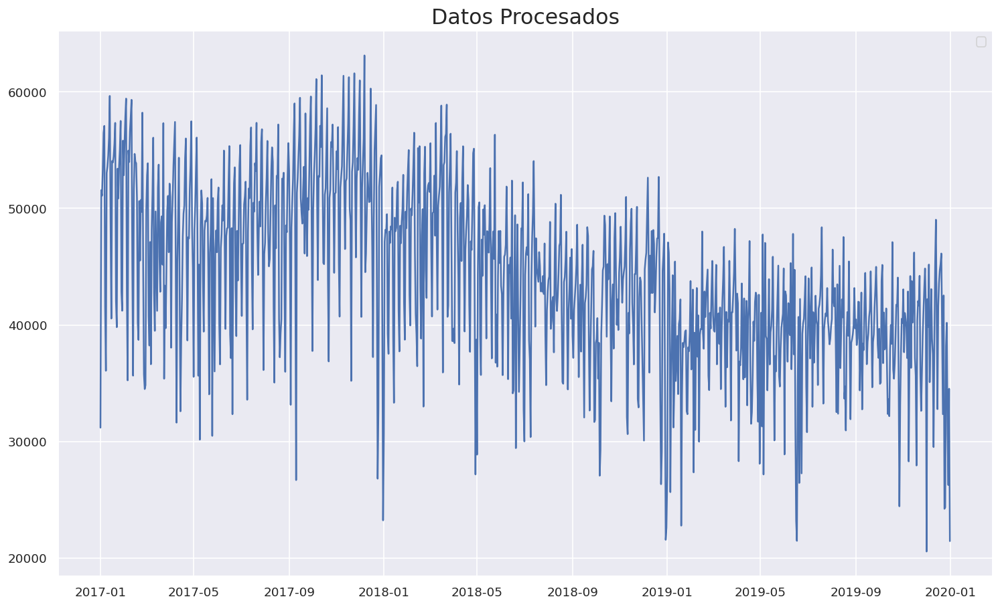

In [848]:
# Graficamos como quedo
plt.figure(figsize=(15,9))
plt.plot(prophet.ds,prophet.y)
plt.title("Datos Procesados",fontsize=19)
plt.legend()
plt.show()

Cortamos el dataset hasta septiembre del 2019 para poder predecir el cuarto trimestre del 2019.

In [849]:
data_corte = '2019-09-30'
prophet1 = prophet.loc[prophet.ds <= data_corte]
prophet1

,ds,y
0,2017-01-01,31183.0
1,2017-01-02,51568.0
2,2017-01-03,51093.0
3,2017-01-04,53332.0
4,2017-01-05,56486.0
...,...,...
998,2019-09-26,43110.0
999,2019-09-27,44985.0
1000,2019-09-28,41925.0
1001,2019-09-29,38348.0


In [850]:
model =  Prophet()
model.fit(prophet1)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


*  Creamos el dataframe donde colocaremos los resultados.
Se va a colocar un rango de días para que prediga el cuarto trimestre del 2019, en este caso 92 días. 

In [851]:
future = model.make_future_dataframe(periods=92)

In [852]:
future.head()

,ds
0,2017-01-01
1,2017-01-02
2,2017-01-03
3,2017-01-04
4,2017-01-05


In [853]:
future.tail()

,ds
1090,2019-12-27
1091,2019-12-28
1092,2019-12-29
1093,2019-12-30
1094,2019-12-31


* Calcular los pronósticos y guardarlos en la variable forecast

El resultado de la función predict () es un DataFrame que contiene varias columnas. la fecha del pronóstico ('ds'), el valor pronosticado ('yhat') y los límites inferior y superior del valor pronosticado (' yhat_lower ' y ' yhat_upper ') que proporcionan incertidumbre del pronóstico .

In [854]:
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1090,2019-12-27,43243.963332,37569.350052,49296.002642
1091,2019-12-28,34944.830554,29273.137449,40819.606442
1092,2019-12-29,30212.215067,24694.000217,36297.898355
1093,2019-12-30,36071.936736,30513.346382,41958.660764
1094,2019-12-31,37210.493000,31611.334854,43210.248906


In [855]:
forecast.columns

Index(['ds', 'trend', 'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper',
       'additive_terms', 'additive_terms_lower', 'additive_terms_upper',
       'weekly', 'weekly_lower', 'weekly_upper', 'yearly', 'yearly_lower',
       'yearly_upper', 'multiplicative_terms', 'multiplicative_terms_lower',
       'multiplicative_terms_upper', 'yhat'],
      dtype='object')

<Figure size 1800x600 with 0 Axes>

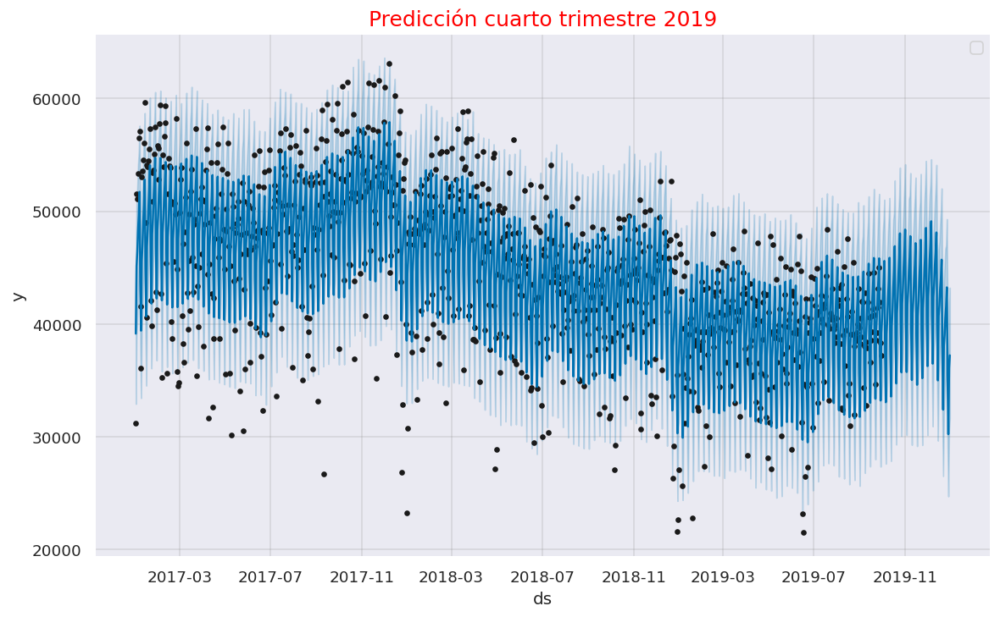

In [856]:
plt.figure(figsize=(15,5))
fig = model.plot(forecast)
plt.title("Predicción cuarto trimestre 2019",fontsize=15, color ='red')
plt.legend()
plt.show()

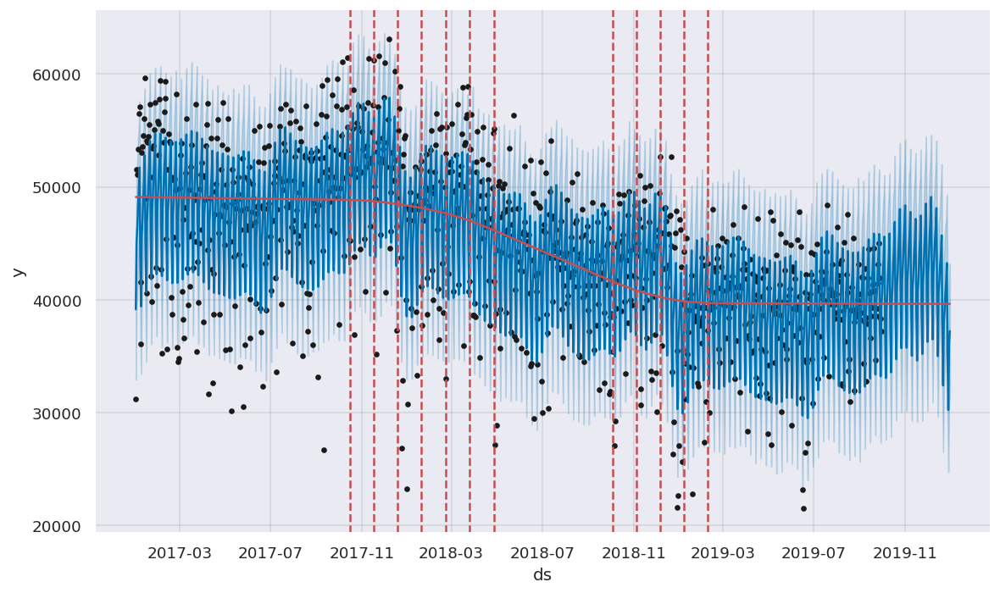

In [857]:
# Puntos de tendencia
fig = model.plot(forecast) 
a = add_changepoints_to_plot(fig.gca(), model, forecast)

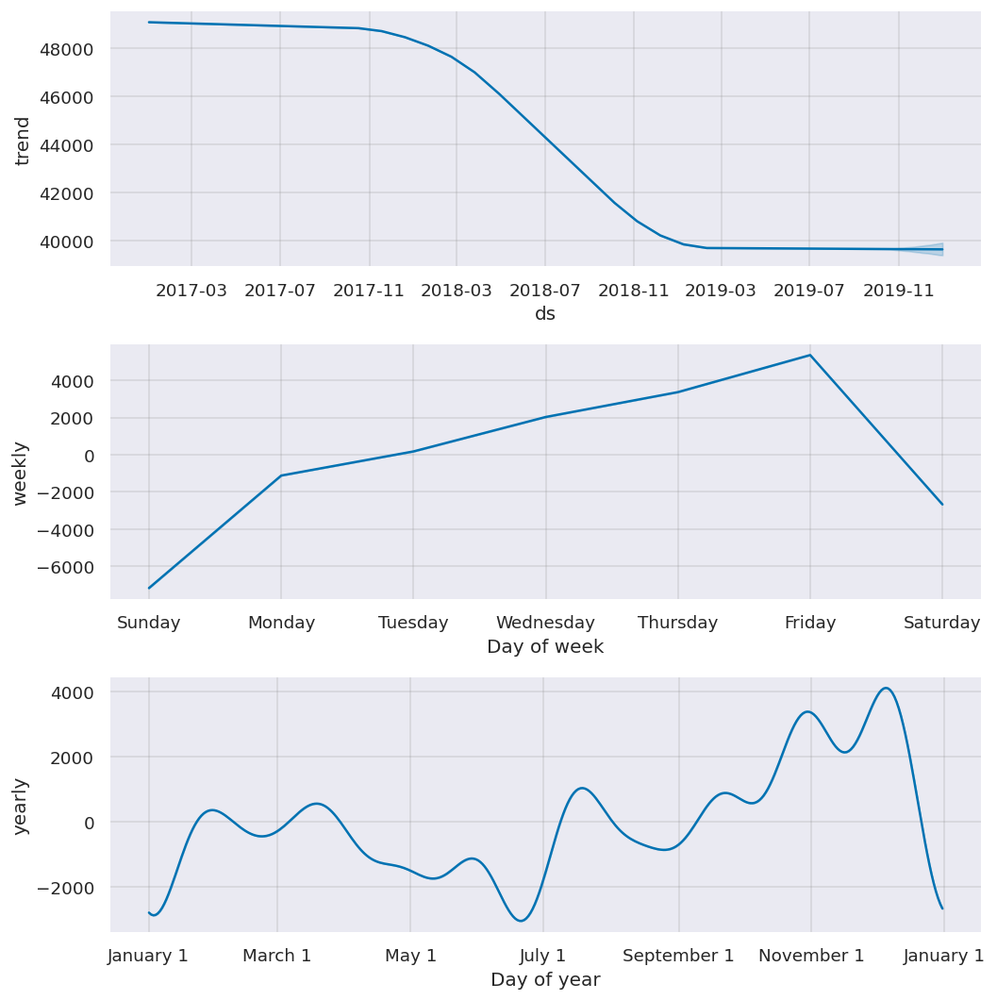

In [858]:
# Vamos a descomponer la serie prophet para chequear que predice para el cuarto trimestre 2019
b = model.plot_components(forecast)

In [859]:
y_pred = forecast[['ds', 'yhat']].loc[forecast.ds < data_corte]
y_true = prophet1[['ds', 'y']].loc[prophet1.ds < data_corte]

In [860]:
rmse = np.sqrt(mean_squared_error(y_true['y'],y_pred['yhat']))
print(f'RMSE de PROPHET: {rmse}')

RMSE de PROPHET: 4525.009381601542


* **Serie Semanal**

In [861]:
semanal.reset_index(inplace=True,drop=False)
semanal

,index,fecha,cantidad_pasos,var_diaria,fecha_numeros,tend
0,0,2017-01-01,31183.0,0.000000,736330,290899.568833
1,1,2017-01-08,347212.0,0.353784,736337,295970.624258
2,2,2017-01-15,366413.0,0.239592,736344,300879.356828
3,3,2017-01-22,357215.0,0.072845,736351,305495.469547
4,4,2017-01-29,354581.0,0.126785,736358,309729.623946
...,...,...,...,...,...,...
153,153,2019-12-08,282891.0,1.026164,737401,244521.307091
154,154,2019-12-15,272960.0,-0.048993,737408,239676.477136
155,155,2019-12-22,292881.0,0.049049,737415,234549.953550
156,156,2019-12-29,226390.0,0.129764,737422,229211.917507


In [862]:
prophet= pd.DataFrame({'ds':semanal.fecha, 'y':semanal.cantidad_pasos})
prophet.head()

,ds,y
0,2017-01-01,31183.0
1,2017-01-08,347212.0
2,2017-01-15,366413.0
3,2017-01-22,357215.0
4,2017-01-29,354581.0


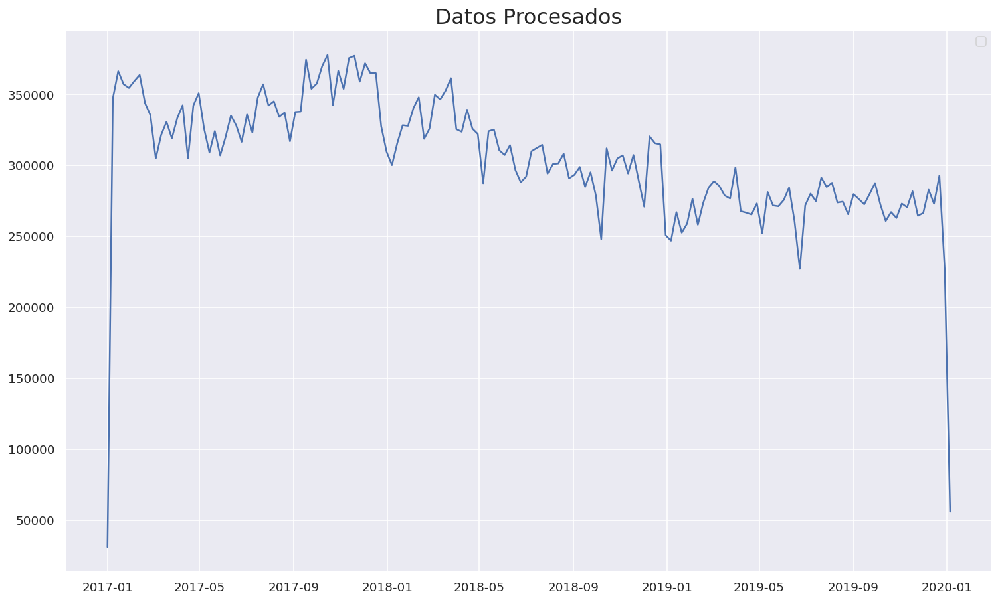

In [863]:
# Graficamos como quedo
plt.figure(figsize=(15,9))
plt.plot(prophet.ds,prophet.y)
plt.title("Datos Procesados",fontsize=19)
plt.legend()
plt.show()

In [864]:
data_corte = '2019-09-30'
prophet1 = prophet.loc[prophet.ds <= data_corte]
prophet1

,ds,y
0,2017-01-01,31183.0
1,2017-01-08,347212.0
2,2017-01-15,366413.0
3,2017-01-22,357215.0
4,2017-01-29,354581.0
...,...,...
139,2019-09-01,279775.0
140,2019-09-08,276271.0
141,2019-09-15,272592.0
142,2019-09-22,279927.0


In [865]:
model_semanal =  Prophet()
model_semanal.fit(prophet1)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


*  Creamos el dataframe donde colocaremos los resultados.
Se va a colocar un rango de días para que prediga el cuarto trimestre del 2019, en este caso 14 semanas. 

In [866]:
future = model_semanal.make_future_dataframe(periods=14)

In [867]:
future.head()

,ds
0,2017-01-01
1,2017-01-08
2,2017-01-15
3,2017-01-22
4,2017-01-29


In [868]:
future.tail()

,ds
153,2019-10-09
154,2019-10-10
155,2019-10-11
156,2019-10-12
157,2019-10-13


In [869]:
forecast_1 = model_semanal.predict(future)
forecast_1[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)

,ds,yhat,yhat_lower,yhat_upper
148,2019-10-04,266017.681029,231085.869036,300516.861950
149,2019-10-05,264747.617823,228388.025969,300208.639684
150,2019-10-06,263514.742951,228531.373603,297534.737335
151,2019-10-07,262357.132945,226158.907769,296757.811685
152,2019-10-08,261311.875602,226844.454001,294876.559123
153,2019-10-09,260413.980065,224842.176824,295077.292231
154,2019-10-10,259695.320534,226018.802133,293610.799147
155,2019-10-11,259183.645106,223177.252492,295249.152456
156,2019-10-12,258901.680034,224159.075230,292030.681589
157,2019-10-13,258866.357445,226068.471093,292697.552246


<Figure size 1800x600 with 0 Axes>

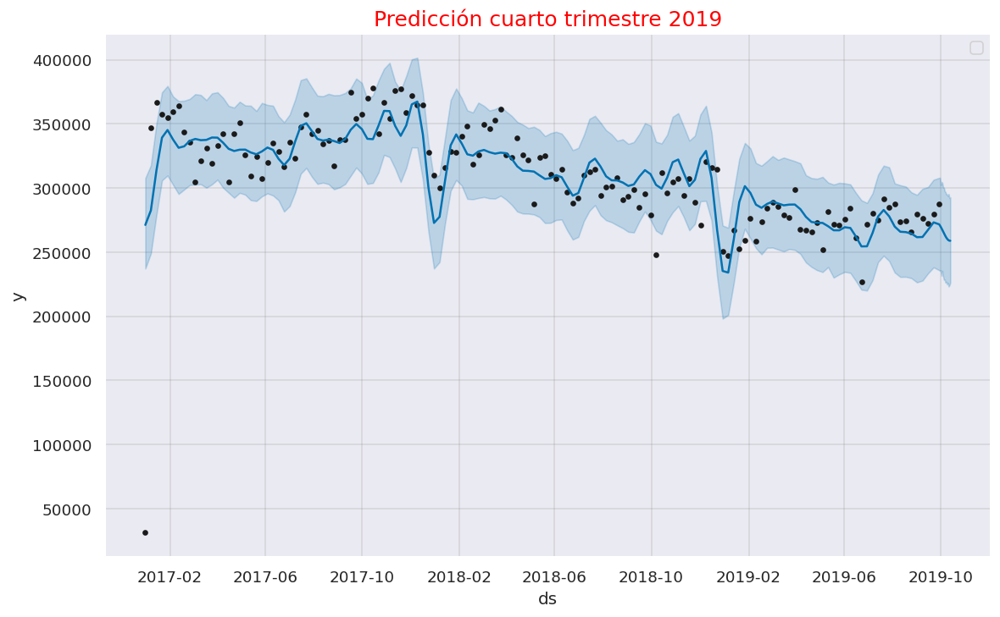

In [870]:
plt.figure(figsize=(15,5))
fig = model_semanal.plot(forecast_1)
plt.title("Predicción cuarto trimestre 2019",fontsize=15, color ='red')
plt.legend()
plt.show()

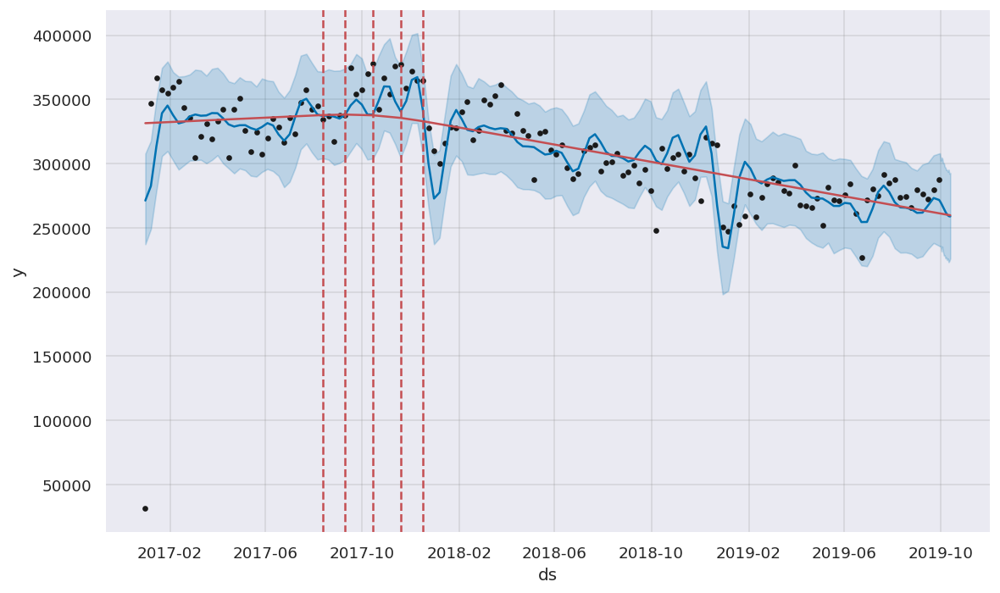

In [871]:
# Puntos de tendencia
fig = model_semanal.plot(forecast_1) 
a = add_changepoints_to_plot(fig.gca(), model_semanal, forecast_1)

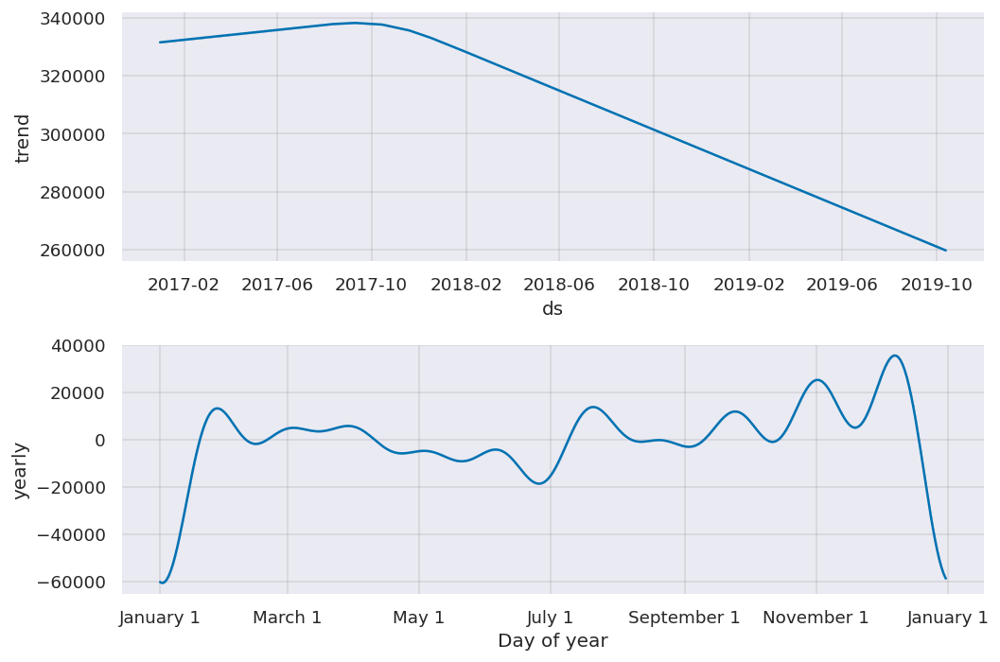

In [872]:
# Vamos a descomponer la serie prophet para chequear que predice para el cuarto trimestre 2019
b = model_semanal.plot_components(forecast_1)

In [873]:
y_pred_semanal = forecast_1[['ds', 'yhat']].loc[forecast_1.ds < data_corte]
y_true_semanal = prophet1[['ds', 'y']].loc[prophet1.ds < data_corte]

In [874]:
rmse = np.sqrt(mean_squared_error(y_true_semanal['y'],y_pred_semanal['yhat']))
print(f'RMSE de PROPHET SEMANAL: {rmse}')

RMSE de PROPHET SEMANAL: 27374.051167039433


Con prophet no da muy buen resultado para realizar predicciones de series con una frecuencia semanal.

# **Resultados**

El modelo benchmark se realizo solo con una serie de frecuencia semanal el cual obtuvo un RMSE de 2999.8287232635216, en el modelo de Random Forest se obtuvo un resultado en train de 6898.197640096558 y en Test de 10964.807311433557.

Ahora se van a comparar los resultados con los modelos mas avanzados que se utilizan en serie de tiempo:

In [875]:
metricas= [[6079.851615782682,6219.173903914942, 4525.009381601542],
         [76671.68073552498, 66070.59073769941, 27374.051167039433 ]]

columnas = ['RMSE_Arima', 'RMSE_Auto-Arima', 'RMSE_Prophet'] # definimos los nombres de las columnas
filas = ['Diario', 'Semanal'] # definimos los nombres de las filas

Resultados = pd.DataFrame(metricas, columns=columnas, index=filas)
Resultados.head()

,RMSE_Arima,RMSE_Auto-Arima,RMSE_Prophet
Diario,6079.851616,6219.173904,4525.009382
Semanal,76671.680736,66070.590738,27374.051167


En la tabla anterior podemos ver los resultados obtenidos en cada uno de los modelos con el fin de verificar la eficacia de los resultados predichos y mirar cual es el mejor modelo para predecir el ultimo trimestre del 2019. Como podemos ver el mejor modelo para pronosticar el flujo vehicular del 2019 es Prophet en una serie diaria por lo que esta es la que utilizaremos para pronosticar el flujo vehicular de todo el 2020.

Como ya se habia mencionado no se utilizo la serie con una frecuencia mensual ya que queda muy acotado solo es útil para poder estudiar comportamientos de forma muy generica.

* **Utiliza el modelo creado para predecir el tráfico en el año 2020. ¿Cómo funciona?**

Como vimos anteriormente el mejor modelo para predecir el flujo vehicular en el cuarto trimestre del 2019 es Prophet por lo que vamos a utilizar solamente este modelo para predecir el trafico del año 2020. con una Serie diaria.

Para utilizar prophet el DataFrame debe tener un formato específico, los datos deben estar divididos en dos columnas "ds", "y". En la columna "ds", se encuentran los valores de las fechas en un formato datetime, y para la variable "y", los datos que se van a pronosticar. Por lo tanto acomodaremos primero el dataset.

In [876]:
prophet= pd.DataFrame({'ds':diario.fecha, 'y':diario.cantidad_pasos})
prophet.head()

,ds,y
0,2017-01-01,31183.0
1,2017-01-02,51568.0
2,2017-01-03,51093.0
3,2017-01-04,53332.0
4,2017-01-05,56486.0


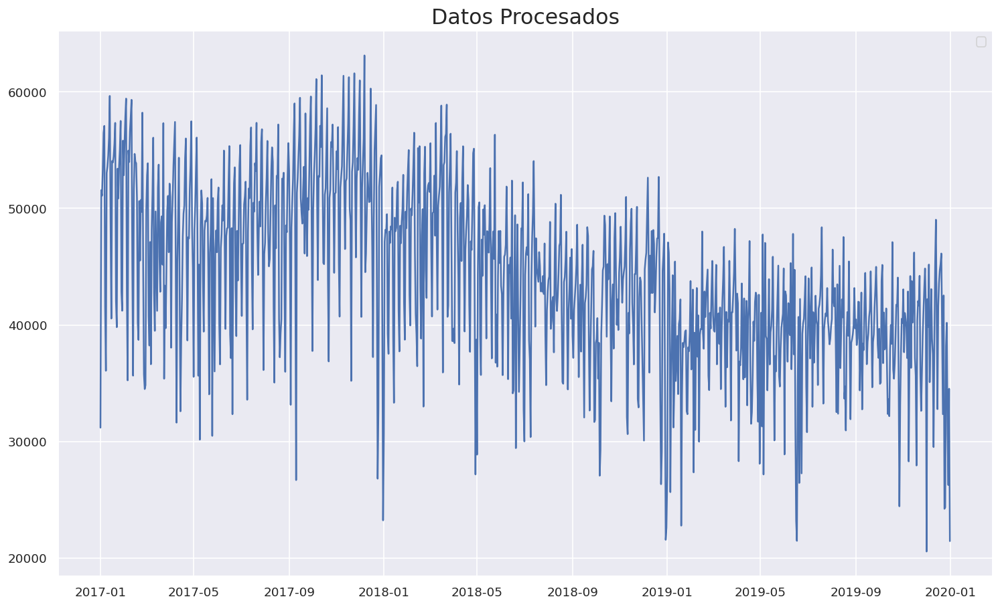

In [877]:
# Graficamos como quedo
plt.figure(figsize=(15,9))
plt.plot(prophet.ds,prophet.y)
plt.title("Datos Procesados",fontsize=19)
plt.legend()
plt.show()

Luego cortamos el dataset hasta el 31 de diciembre de 2019

In [878]:
split_date = '2019-12-31'
prophet1 = prophet.loc[prophet.ds <= split_date]
prophet1

,ds,y
0,2017-01-01,31183.0
1,2017-01-02,51568.0
2,2017-01-03,51093.0
3,2017-01-04,53332.0
4,2017-01-05,56486.0
...,...,...
1090,2019-12-27,40182.0
1091,2019-12-28,30681.0
1092,2019-12-29,26259.0
1093,2019-12-30,34523.0


* Crear y ajustar el modelo

In [879]:
model = Prophet(weekly_seasonality=True,
            daily_seasonality=True)
model.fit(prophet1)

*  Creamos el dataframe donde colocaremos los resultados.
Se va a colocar un rango de días para que prediga el 2020, en este caso 365 días. 

In [880]:
future = model.make_future_dataframe(periods=365)

In [881]:
future.head()

,ds
0,2017-01-01
1,2017-01-02
2,2017-01-03
3,2017-01-04
4,2017-01-05


In [882]:
future.tail()

,ds
1455,2020-12-26
1456,2020-12-27
1457,2020-12-28
1458,2020-12-29
1459,2020-12-30


Calcular los pronósticos y guardarlos en forecast
El resultado de la función predict () es un DataFrame que contiene varias columnas. la fecha del pronóstico ('ds'), el valor pronosticado ('yhat') y los límites inferior y superior del valor pronosticado (' yhat_lower ' y ' yhat_upper ') que proporcionan incertidumbre del pronóstico .

In [883]:
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)

,ds,yhat,yhat_lower,yhat_upper
1450,2020-12-21,32477.399757,26525.181195,38609.351613
1451,2020-12-22,33208.427688,27158.146293,39444.485239
1452,2020-12-23,34696.904685,28458.803885,40340.717537
1453,2020-12-24,35682.569443,29752.231210,41556.006180
1454,2020-12-25,37287.190049,31596.655071,44049.053655
1455,2020-12-26,29203.811208,23117.341718,35558.099423
1456,2020-12-27,24395.097364,18711.097925,30399.758048
1457,2020-12-28,29975.351715,23958.801290,36668.205143
1458,2020-12-29,30867.983146,24410.887494,36833.234354
1459,2020-12-30,32547.377535,26094.283691,39077.952525


In [884]:
forecast.columns

Index(['ds', 'trend', 'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper',
       'additive_terms', 'additive_terms_lower', 'additive_terms_upper',
       'daily', 'daily_lower', 'daily_upper', 'weekly', 'weekly_lower',
       'weekly_upper', 'yearly', 'yearly_lower', 'yearly_upper',
       'multiplicative_terms', 'multiplicative_terms_lower',
       'multiplicative_terms_upper', 'yhat'],
      dtype='object')

<Figure size 1800x600 with 0 Axes>

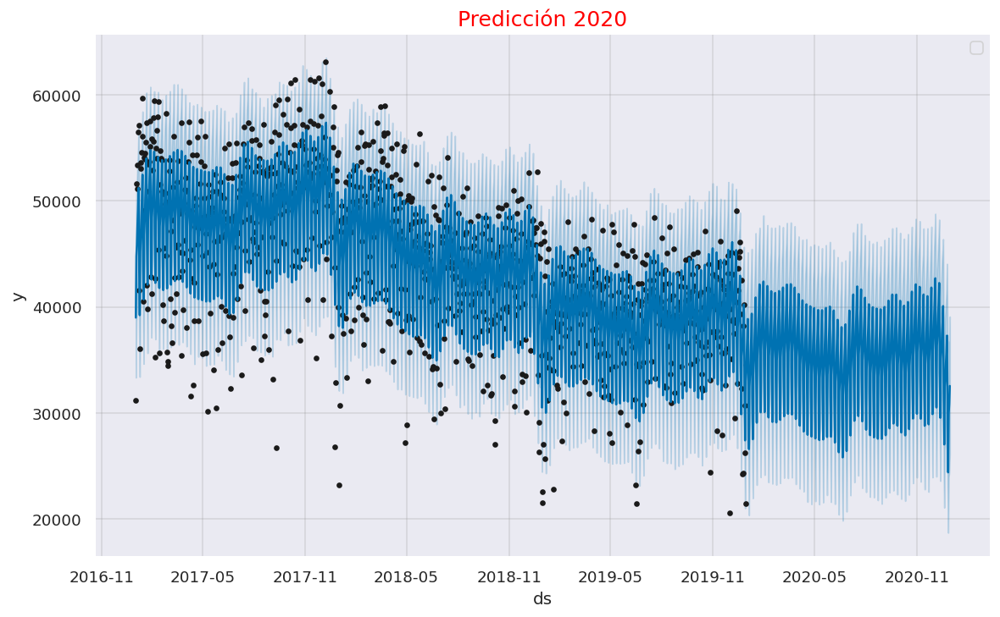

In [885]:
plt.figure(figsize=(15,5))
fig = model.plot(forecast)
plt.title("Predicción 2020",fontsize=15, color ='red')
plt.legend()
plt.show()

La línea azul son los valores pronosticados, mientras que los puntos negros son los valores reales. Podemos ver que la línea azul se ajusta a la tendencia general de los datos y aún quedan algunos valores atípicos.

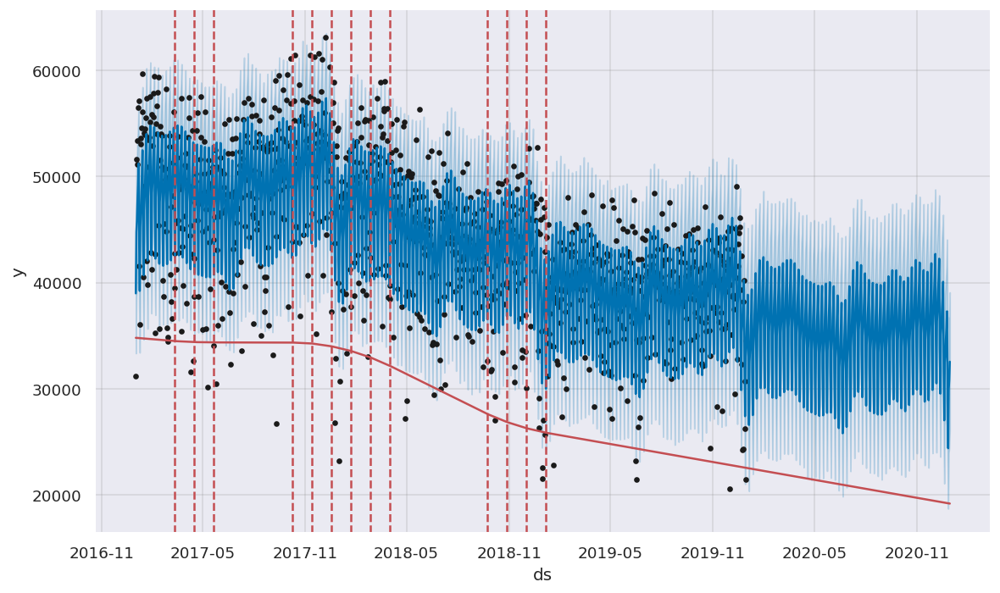

In [886]:
# Puntos de tendencia
fig = model.plot(forecast) 
a = add_changepoints_to_plot(fig.gca(), model, forecast)

Las líneas rojas punteadas muestran el momento en que hubo un cambio rápido en la tendencia del flujo vehicular.

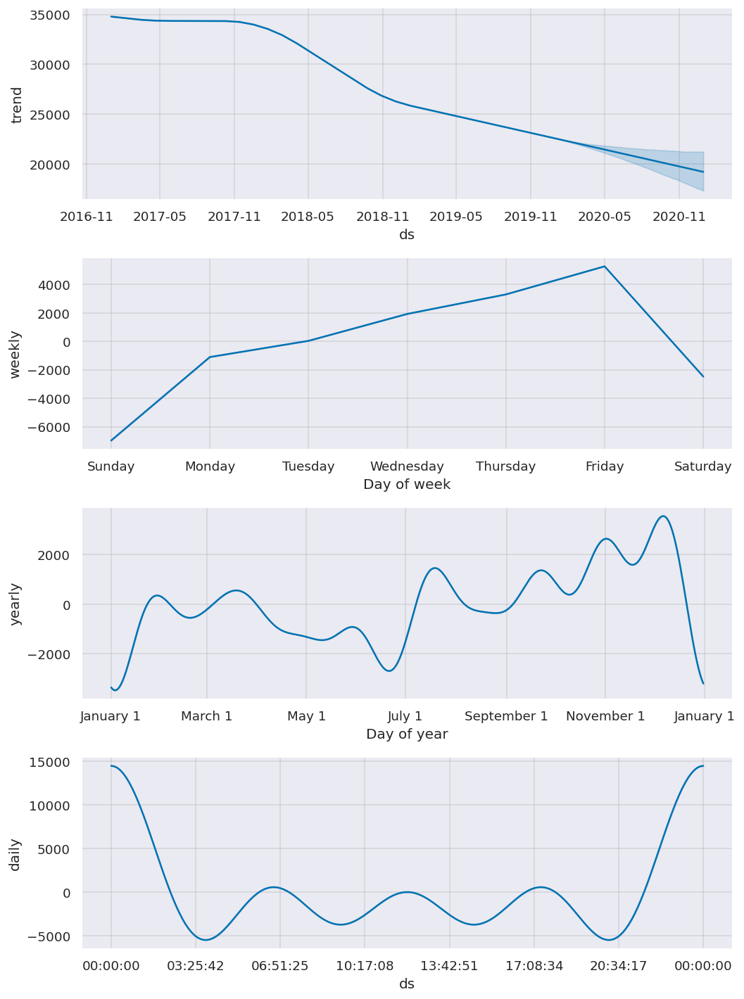

In [887]:
# Vamos a descomponer la serie prophet para chequear que predice para el 2020
b = model.plot_components(forecast)

Estos gráficos muestran la tendencia, la tendencia semanal y anual, el día con mayor pasos de vehiculos es el día viernes y pocos pasos de vehiculos el día domingo.

Se observa que la cantidad de pasos descendió a partir de mayo del 2018. 

In [888]:
y_pred = forecast[['ds', 'yhat']].loc[forecast.ds < split_date]
y_true = prophet1[['ds', 'y']].loc[prophet1.ds < split_date]

In [889]:
rmse = np.sqrt(mean_squared_error(y_true['y'],y_pred['yhat']))
print(f'RMSE de PROPHET: {rmse}')

RMSE de PROPHET: 4589.744853582228


**Ahora utilizando validación cruzada**

Prophet tiene una funcion incorporada cross_validation() que incluye:

* un modelo (model)
* el tiempo que debe cubrir cada pronóstico ( horizon)
* con qué frecuencia hacer pronósticos ( period)
* la cantidad de datos para entrenar antes de hacer predicciones ( initial)
Loading.

En el CV los días de initial y horizon deben sumar el número total de dias (registros) que se tiene en entrenamiento.

In [890]:
from fbprophet.diagnostics import cross_validation

df_cv = cross_validation(model, 
                         initial = '730 days', 
                         period  = '365 days', 
                         horizon = '180 days')#test
df_cv

INFO:fbprophet:Making 1 forecasts with cutoffs between 2019-07-04 00:00:00 and 2019-07-04 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2019-07-05,44170.938840,38409.566884,50160.064202,40815.0,2019-07-04
1,2019-07-06,35845.555693,29976.273856,42238.748290,44932.0,2019-07-04
2,2019-07-07,31367.094297,25397.601391,36882.883951,32975.0,2019-07-04
3,2019-07-08,38177.318563,32203.220432,44344.480261,41090.0,2019-07-04
4,2019-07-09,39693.250111,33880.416591,45752.376159,36759.0,2019-07-04
...,...,...,...,...,...,...
175,2019-12-27,43335.435939,37545.177257,49488.592017,40182.0,2019-07-04
176,2019-12-28,34513.067160,28234.418845,40527.805551,30681.0,2019-07-04
177,2019-12-29,29575.384527,23811.457291,36014.742678,26259.0,2019-07-04
178,2019-12-30,35969.281609,29867.149169,41588.695942,34523.0,2019-07-04


In [891]:
from fbprophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p

,horizon,mse,rmse,mae,mape,mdape,coverage
0,18 days,9.936024e+06,3152.145929,2390.332996,0.058783,0.056821,0.944444
1,19 days,9.310867e+06,3051.371396,2209.308935,0.054349,0.050661,0.944444
2,20 days,4.837131e+06,2199.347917,1783.782123,0.045048,0.048707,1.000000
3,21 days,5.158253e+06,2271.178768,1855.138828,0.046282,0.050607,1.000000
4,22 days,5.029038e+06,2242.551674,1831.184317,0.045537,0.050607,1.000000
...,...,...,...,...,...,...,...
158,176 days,4.386666e+07,6623.191390,4238.968837,0.140610,0.047896,0.777778
159,177 days,3.357762e+07,5794.620017,3666.408231,0.120939,0.047896,0.833333
160,178 days,3.156756e+07,5618.501967,3469.055798,0.118056,0.047896,0.888889
161,179 days,3.157412e+07,5619.085135,3471.354277,0.118653,0.047896,0.888889


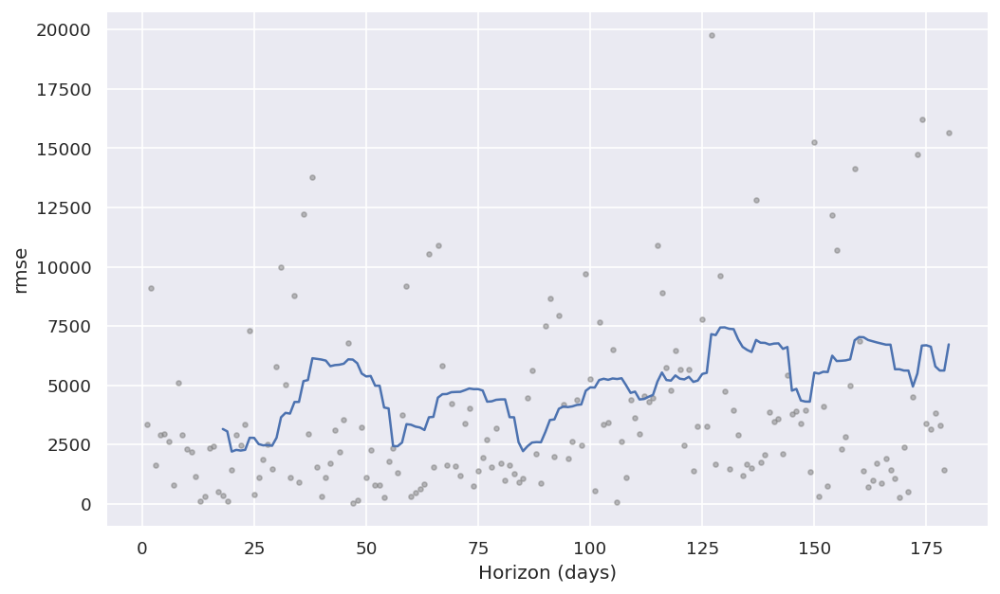

In [892]:
from fbprophet.plot import plot_cross_validation_metric
fig = plot_cross_validation_metric(df_cv, metric="rmse")
fig.savefig("output.png")

Se aprecia como la precisión de las predicciones decrece a medida que se expande el horizonte de predicción y a medida que pasa los dias va aumentando.

# **Para pensar, investigar y, opcionalmente, implementar**

1. **¿Cómo incorporarías la información sobre tipo de vehículo, forma de pago, sentido, día de la semana, etc.? En lo que respecta a las predicciones, ¿mejoran o empeoran?**

Se podria incorporar utilizando OneHotEncoder, los modelos tendrían más información para realizar las predicciones lo cual permitiria tomar mejores decisiones.

Para abordar modelos con más información, es importante contemplar que el mismo, esté "saturado" de información/variables, dado que correríamos el riesgo de overfiterar el modelo.

En conclusión, se debería estudiar y analizar cuales serian las variables más atinadas que mejoren el modelo sin overfitearlo, y de esa forma encontrar el equilibrio.

2. **¿Qué ocurre si comparas las series de tiempo entre distintas estaciones de peajes?¿Tienen el mismo comportamiento o hay alguna que sea distinta a las otras? Si es así, ¿hay información auxiliar que te ayude a explicar lo que encuentras?**

Para responder esta pregunta se va a generar nuevamente el dataset pero ahora se va incluir todas las estaciones de peaje.

In [893]:
print('\nEstaciones en 2019')
print(data_2019['estacion'].unique())
print('\nEstaciones en 2018')
print(data_2018['estacion'].unique())
print('\nEstaciones en 2017')
print(data_2017['estacion'].unique())


Estaciones en 2019
['Alberti' 'Avellaneda' 'Dellepiane' 'Illia' 'Retiro' 'Salguero'
 'Sarmiento' 'PDB']

Estaciones en 2018
['Alberdi' 'Avellaneda' 'Dellepiane Centro' 'Dellepiane Liniers' 'Illia'
 'Retiro' 'Salguero' 'Sarmiento']

Estaciones en 2017
['Alberdi' 'Avellaneda' 'Dellepiane Centro' 'Dellepiane Liniers' 'Illia'
 'Retiro' 'Salguero' 'Sarmiento']


Luego se agrupan todos los años 

In [894]:
estaciones = pd.concat([data_2019,data_2018,data_2017])

In [895]:
# Verificación de estaciones
estaciones['estacion'].unique()

array(['Alberti', 'Avellaneda', 'Dellepiane', 'Illia', 'Retiro',
       'Salguero', 'Sarmiento', 'PDB', 'Alberdi', 'Dellepiane Centro',
       'Dellepiane Liniers'], dtype=object)

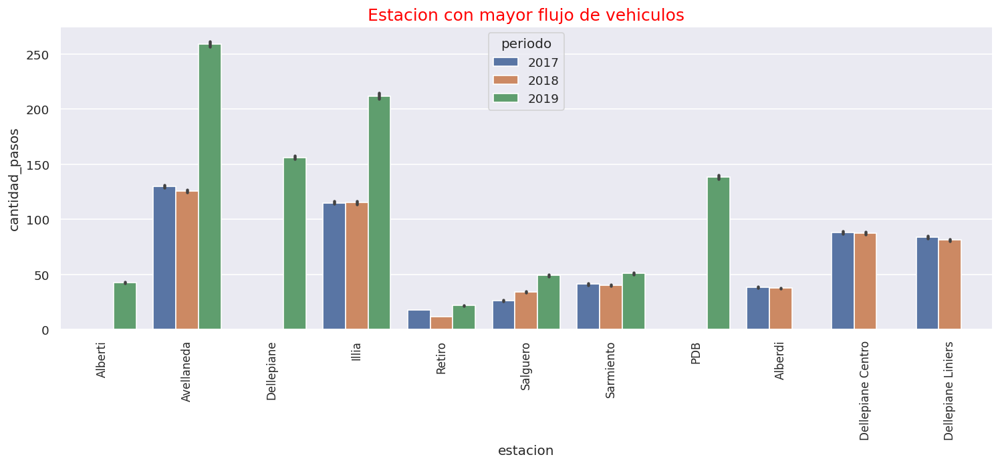

In [896]:
plt.figure(figsize=(15,5))
sns.barplot(x = "estacion", y = "cantidad_pasos", hue = "periodo", data = estaciones)
plt.title("Estacion con mayor flujo de vehiculos", size = 15, color='red')
plt.xticks(rotation=90, size=10)
plt.show()

En el grafico podemos ver que en el 2017 y 2018 se encuentran las mismas estaciones pero en el 2019 aparecio una nueva estación PDB y se unifico la estacion Dellepiane centro y Dellepiane Liniers solo en Dellepiane. En el 2019 ya no aparece la estación de Alberi pero en vez de esa aparece la estación de Alberti.

In [897]:
#Pasamos la columna fecha a formato datetime, y le unimos la hora_fin como hora
estaciones['fecha2'] = pd.to_datetime(estaciones.fecha) + pd.to_timedelta(estaciones.hora_fin, unit = 'h')

In [898]:
#Quitamos las columnas que ya no vamos a utilizar
estaciones.drop(columns=['periodo','dia','hora_inicio','sentido','fecha','hora_fin'], inplace = True)

In [899]:
#Corregimos el nombre de fecha2 a fecha
estaciones.rename(columns = {'fecha2':'fecha'}, inplace = True) 

In [900]:
#Reordenamos el dataset por fecha
estaciones.sort_values('fecha', inplace = True)
estaciones.reset_index(drop=True, inplace = True)

In [901]:
estaciones.head()

,estacion,tipo_vehiculo,forma_pago,cantidad_pasos,fecha
0,Dellepiane Centro,Liviano,NO COBRADO,6,2017-01-01
1,Illia,Liviano,EFECTIVO,9,2017-01-01
2,Illia,Liviano,NO COBRADO,3,2017-01-01
3,Dellepiane Liniers,Liviano,INFRACCION,3,2017-01-01
4,Avellaneda,Liviano,NO COBRADO,36,2017-01-01


In [902]:
# Unifico estaciones
estaciones['estacion'] = estaciones['estacion'].replace({
    'Dellepiane Liniers': 'Dellepiane',
    'Dellepiane Centro': 'Dellepiane'})

Una vez organizado el dataset y verificado las estaciones se procede a generar la serie de tiempo para cada estación con un resampleo mensual. 

In [903]:
estacion_Alberti = estaciones[estaciones.estacion == 'Alberti']
estacion_st = pd.DataFrame()
estacion_st = estacion_Alberti.resample('m', on = 'fecha').sum()
estacion_1 = estacion_st.reset_index()
estacion_1.head()

,fecha,cantidad_pasos
0,2019-01-31,432958
1,2019-02-28,421781
2,2019-03-31,473208
3,2019-04-30,455316
4,2019-05-31,484913


In [904]:
estacion_Avellaneda = estaciones[estaciones.estacion == 'Avellaneda']
estacion_st2 = pd.DataFrame()
estacion_st2 = estacion_Avellaneda.resample('m', on = 'fecha').sum()
estacion_2 = estacion_st2.reset_index()
estacion_2.head()

,fecha,cantidad_pasos
0,2017-01-31,4108488
1,2017-02-28,3579521
2,2017-03-31,4184001
3,2017-04-30,3965605
4,2017-05-31,4210916


In [905]:
estacion_Dellepiane = estaciones[estaciones.estacion == 'Dellepiane']
estacion_st3 = pd.DataFrame()
estacion_st3 = estacion_Dellepiane.resample('m', on = 'fecha').sum()
estacion_3 = estacion_st3.reset_index()
estacion_3.head()

,fecha,cantidad_pasos
0,2017-01-31,2559988
1,2017-02-28,2194223
2,2017-03-31,2457335
3,2017-04-30,2365905
4,2017-05-31,2470954


In [906]:
estacion_Retiro = estaciones[estaciones.estacion == 'Retiro']
estacion_st4 = pd.DataFrame()
estacion_st4 = estacion_Retiro.resample('m', on = 'fecha').sum()
estacion_4 = estacion_st4.reset_index()
estacion_4.head()

,fecha,cantidad_pasos
0,2017-01-31,220065
1,2017-02-28,191357
2,2017-03-31,225026
3,2017-04-30,204720
4,2017-05-31,222263


In [907]:
estacion_Salguero = estaciones[estaciones.estacion == 'Salguero']
estacion_st5 = pd.DataFrame()
estacion_st5 = estacion_Salguero.resample('m', on = 'fecha').sum()
estacion_5 = estacion_st5.reset_index()
estacion_5.head()

,fecha,cantidad_pasos
0,2017-01-31,27033
1,2017-02-28,26565
2,2017-03-31,48740
3,2017-04-30,51808
4,2017-05-31,53098


In [908]:
estacion_Sarmiento = estaciones[estaciones.estacion == 'Sarmiento']
estacion_st6 = pd.DataFrame()
estacion_st6 = estacion_Sarmiento.resample('m', on = 'fecha').sum()
estacion_6 = estacion_st6.reset_index()
estacion_6.head()

,fecha,cantidad_pasos
0,2017-01-31,51781
1,2017-02-28,61557
2,2017-03-31,92368
3,2017-04-30,85145
4,2017-05-31,83735


In [909]:
estacion_PDB = estaciones[estaciones.estacion == 'PDB']
estacion_st7 = pd.DataFrame()
estacion_st7 = estacion_PDB.resample('m', on = 'fecha').sum()
estacion_7 = estacion_st7.reset_index()
estacion_7.head()

,fecha,cantidad_pasos
0,2019-01-31,156131
1,2019-02-28,174665
2,2019-03-31,184411
3,2019-04-30,220518
4,2019-05-31,242718


In [910]:
estacion_Alberdi = estaciones[estaciones.estacion == 'Alberdi']
estacion_st8 = pd.DataFrame()
estacion_st8 = estacion_Alberdi.resample('m', on = 'fecha').sum()
estacion_8 = estacion_st8.reset_index()
estacion_8.head()

,fecha,cantidad_pasos
0,2017-01-31,452578
1,2017-02-28,407688
2,2017-03-31,494834
3,2017-04-30,462512
4,2017-05-31,481430


In [911]:
estacion_Illia = estaciones[estaciones.estacion == 'Illia']
estacion_st9 = pd.DataFrame()
estacion_st9 = estacion_Illia.resample('m', on = 'fecha').sum()
estacion_9 = estacion_st9.reset_index()
estacion_9.head()

,fecha,cantidad_pasos
0,2017-01-31,2639365
1,2017-02-28,2364688
2,2017-03-31,2734740
3,2017-04-30,2629246
4,2017-05-31,2756833


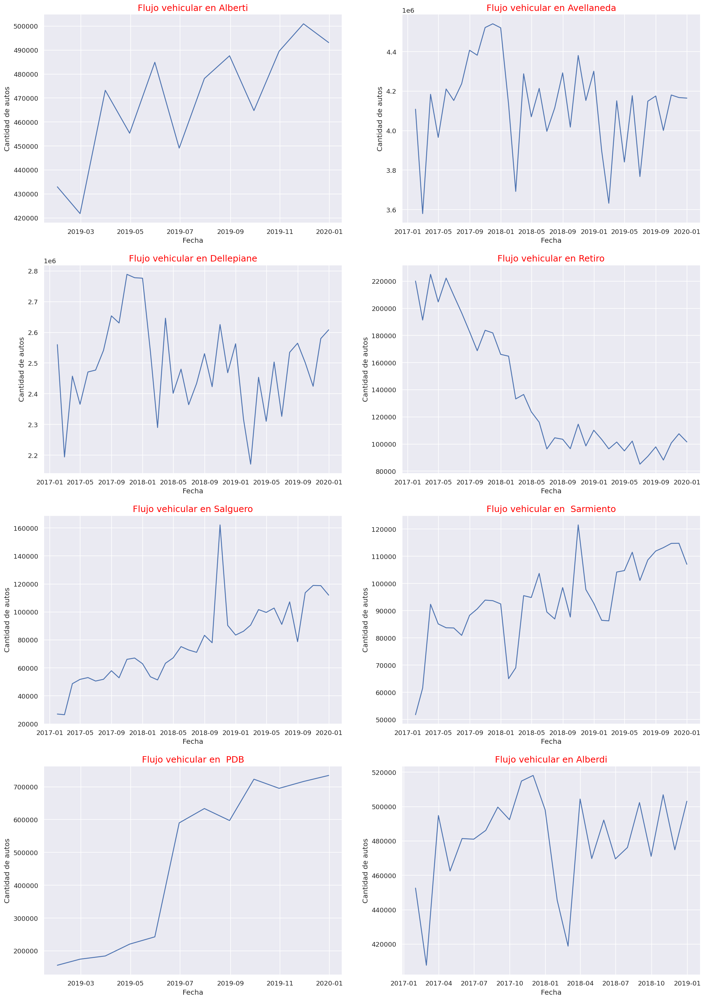

In [912]:
plt.figure(figsize=(20,30))
plt.subplot(4,2,1)
plt.plot(estacion_1.fecha, estacion_1.cantidad_pasos)
plt.title("Flujo vehicular en Alberti",  fontsize= 15 , color='red')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de autos')
plt.subplot(4,2,2)
plt.plot(estacion_2.fecha, estacion_2.cantidad_pasos)
plt.title("Flujo vehicular en Avellaneda",  fontsize= 15 , color='red')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de autos')
plt.subplot(4,2,3)
plt.plot(estacion_3.fecha, estacion_3.cantidad_pasos)
plt.title("Flujo vehicular en Dellepiane",  fontsize= 15 , color='red')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de autos')
plt.subplot(4,2,4)
plt.plot(estacion_4.fecha, estacion_4.cantidad_pasos)
plt.title("Flujo vehicular en Retiro",  fontsize= 15 , color='red')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de autos')
plt.subplot(4,2,5)
plt.plot(estacion_5.fecha, estacion_5.cantidad_pasos)
plt.title("Flujo vehicular en Salguero",  fontsize= 15 , color='red')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de autos')
plt.subplot(4,2,6)
plt.plot(estacion_6.fecha, estacion_6.cantidad_pasos)
plt.title("Flujo vehicular en  Sarmiento",  fontsize= 15 , color='red')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de autos')
plt.subplot(4,2,7)
plt.plot(estacion_7.fecha, estacion_st7.cantidad_pasos)
plt.title("Flujo vehicular en  PDB",  fontsize= 15 , color='red')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de autos')
plt.subplot(4,2,8)
plt.plot(estacion_8.fecha, estacion_st8.cantidad_pasos)
plt.title("Flujo vehicular en Alberdi",  fontsize= 15 , color='red')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de autos')
plt.show()

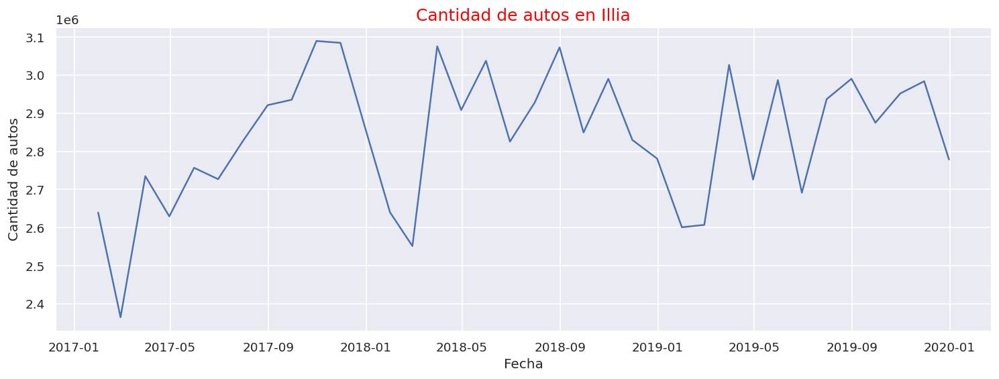

In [913]:
plt.figure(figsize = (15,5))
plt.plot(estacion_9.fecha, estacion_9.cantidad_pasos)
plt.title("Cantidad de autos en Illia",  fontsize= 15 , color='red')
plt.xlabel('Fecha')
plt.ylabel('Cantidad de autos')
plt.show()

* El flujo vehicular en las estaciones de salguero y sarmiento presentan un pico similar mas o menos en octubre de 2019 donde puede ver que fue donde hubo un mayor flujo vehicular.

* El flujo vehicular de PDB presenta una tendencia positiva (creciente) donde se puede observar que empezando el 2019 no pasaban casi carros por esta autopista y finalizando el año aumento considerablemente.

* El flujo vehicular en Retiro presento una tendencia negativa donde en el 2017 habia un aumento y empezo a decrecer en el 2018.

* Las Autopistas Illia y Dellepianne tienen una afulencia similar.

* La autopista de Avellaneda es la que presenta un mayor flujo vehicular.

* Las autopistas de Salguero, Sarmiento y Retiro son las de menor flujo vehicular.

3. **¿Hay algo que te gustaría investigar o probar?**

Solo con la serie con frecuencia diaria se va a probar en prophet si al incorporar los dias festivos si se tiene una incidencia en los autos que pasan por la autopista Illia.

In [914]:
prophet= pd.DataFrame({'ds':diario.fecha, 'y':diario.cantidad_pasos})
prophet.head()

,ds,y
0,2017-01-01,31183.0
1,2017-01-02,51568.0
2,2017-01-03,51093.0
3,2017-01-04,53332.0
4,2017-01-05,56486.0


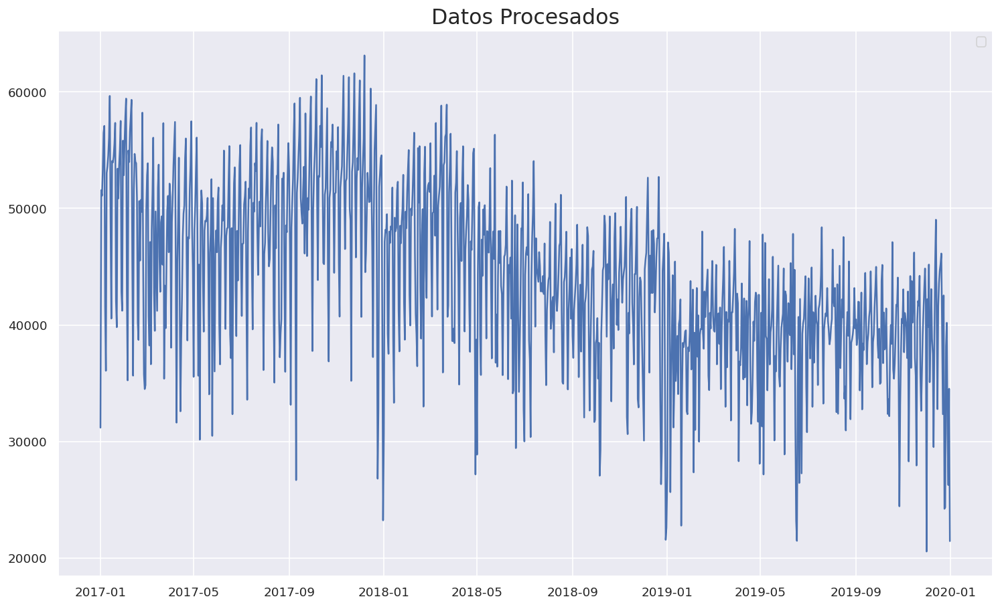

In [915]:
# Graficamos como quedo
plt.figure(figsize=(15,9))
plt.plot(prophet.ds,prophet.y)
plt.title("Datos Procesados",fontsize=19)
plt.legend()
plt.show()

Para proyectar el año 2020 cortamos el dataset al 31 de diciembre del 2019.

In [916]:
data_corte = '2019-12-31'
prophet1 = prophet.loc[prophet.ds <= data_corte]
prophet1

,ds,y
0,2017-01-01,31183.0
1,2017-01-02,51568.0
2,2017-01-03,51093.0
3,2017-01-04,53332.0
4,2017-01-05,56486.0
...,...,...
1090,2019-12-27,40182.0
1091,2019-12-28,30681.0
1092,2019-12-29,26259.0
1093,2019-12-30,34523.0


In [917]:
holidays_1 = pd.DataFrame({
  'holiday': "holidays_1",
  'ds': pd.to_datetime(['2017-01-01','2017-02-27','2017-02-28','2017-03-24','2017-04-02','2017-04-12','2017-05-01','2017-05-25','2017-06-17','2017-06-20','2017-07-09','2017-08-09','2017-10-16','2017-11-20','2017-12-08','2017-12-25', '2018-01-01', '2018-02-12','2018-02-13','2018-03-24','2018-03-30','2018-04-02','2018-04-30','2018-05-01','2018-05-25','2018-06-17','2018-06-20','2018-07-09','2018-08-20','2018-10-15','2018-11-19','2018-12-08','2018-12-24','2018-12-25','2018-12-31', '2019-01-01', '2019-03-04','2019-03-05', '2019-03-24','2019-04-02','2019-04-19','2019-05-01','2019-05-25','2019-06-17','2019-06-20','2019-07-09','2019-08-17','2019-10-12','2018-11-18','2018-12-08','2018-12-25']),
                        
  'lower_window': 0,
  'upper_window': 0,
})

In [918]:
model = Prophet(weekly_seasonality=True,
            daily_seasonality=True,
            holidays=holidays_1)
model.fit(prophet1)

In [919]:
future = model.make_future_dataframe(periods=365)

In [920]:
future.head()

,ds
0,2017-01-01
1,2017-01-02
2,2017-01-03
3,2017-01-04
4,2017-01-05


In [921]:
future.tail()

,ds
1455,2020-12-26
1456,2020-12-27
1457,2020-12-28
1458,2020-12-29
1459,2020-12-30


In [922]:
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1455,2020-12-26,29574.327978,23717.036549,35597.411281
1456,2020-12-27,24780.230875,18920.131361,30340.994724
1457,2020-12-28,30943.138729,24650.704841,36508.188407
1458,2020-12-29,31422.794247,25749.796346,37468.571145
1459,2020-12-30,32839.168091,26698.635139,38911.882582


In [923]:
forecast.columns

Index(['ds', 'trend', 'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper',
       'additive_terms', 'additive_terms_lower', 'additive_terms_upper',
       'daily', 'daily_lower', 'daily_upper', 'holidays', 'holidays_lower',
       'holidays_upper', 'holidays_1', 'holidays_1_lower', 'holidays_1_upper',
       'weekly', 'weekly_lower', 'weekly_upper', 'yearly', 'yearly_lower',
       'yearly_upper', 'multiplicative_terms', 'multiplicative_terms_lower',
       'multiplicative_terms_upper', 'yhat'],
      dtype='object')

<Figure size 1800x600 with 0 Axes>

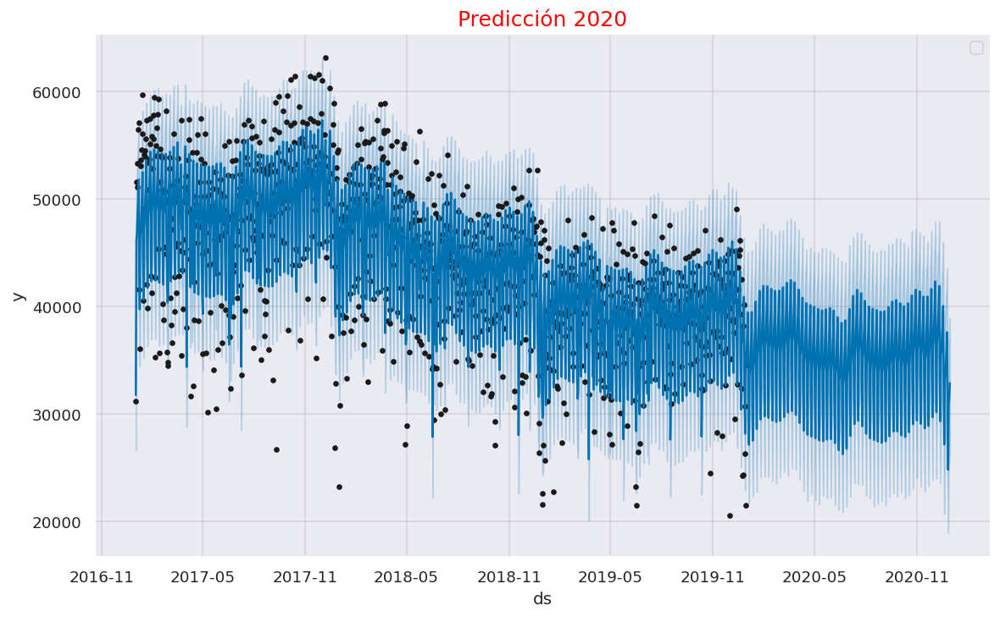

In [924]:
plt.figure(figsize=(15,5))
fig = model.plot(forecast)
plt.title("Predicción 2020",fontsize=15, color ='red')
plt.legend()
plt.show()

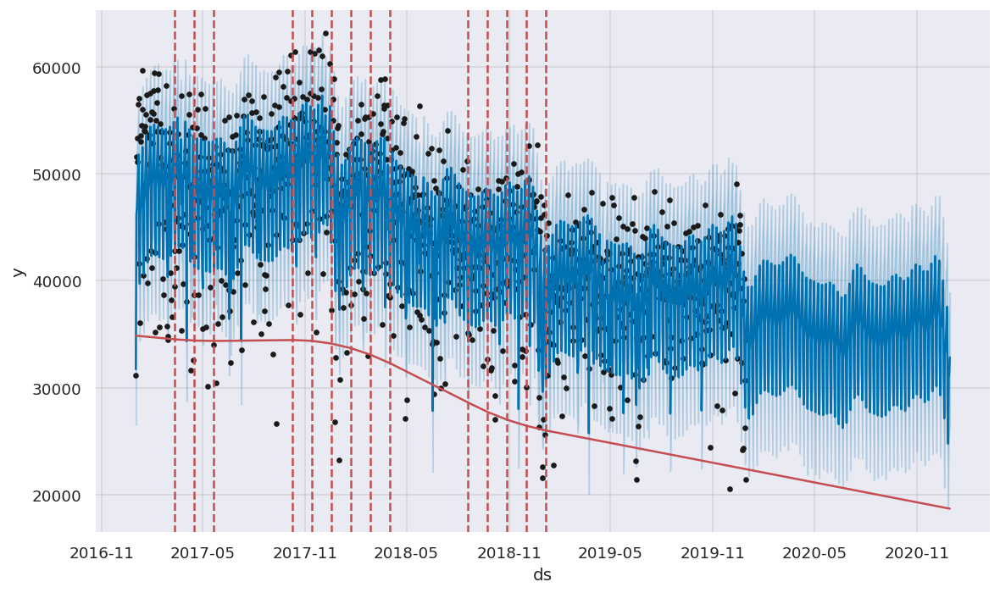

In [925]:
# Puntos de tendencia
fig = model.plot(forecast) 
a = add_changepoints_to_plot(fig.gca(), model, forecast)

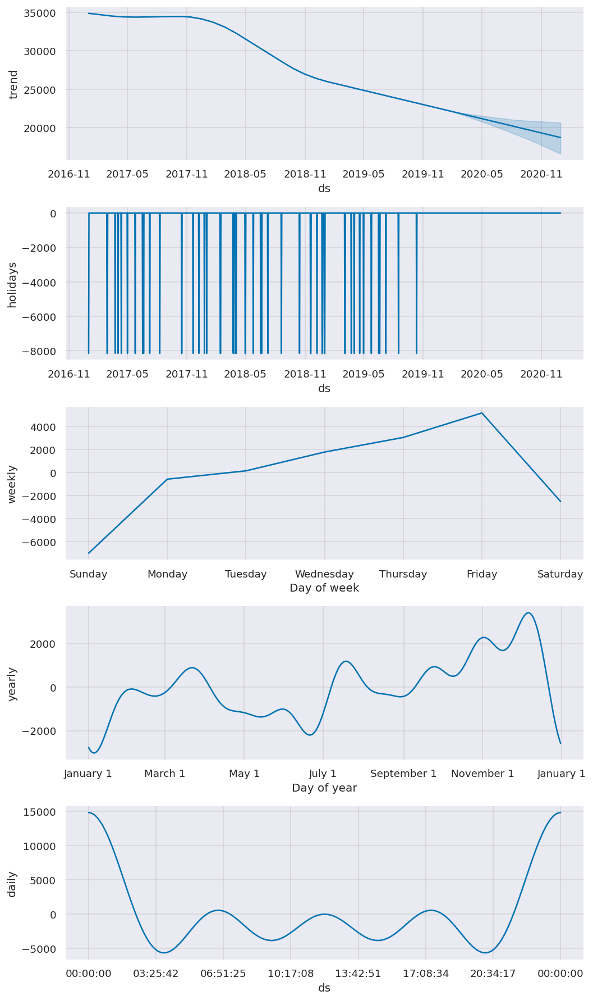

In [926]:
# Vamos a descomponer la serie prophet para chequear que predice para el 2020
b = model.plot_components(forecast)

En el grafico vemos que el efecto de todos los festivos vistos supone un notable descenso del en el flujo vehicular.

In [927]:
y_pred = forecast[['ds', 'yhat']].loc[forecast.ds < data_corte]
y_true = prophet1[['ds', 'y']].loc[prophet1.ds < data_corte]

In [928]:
rmse = np.sqrt(mean_squared_error(y_true['y'],y_pred['yhat']))
print(f'RMSE de PROPHET CON FESTIVOS: {rmse}')

RMSE de PROPHET CON FESTIVOS: 4279.618871143073


* En un futuro me gustaria investigar si se  le incluye la variable "tarifa de peaje" como esta puede influir a medida medida que aumenta el precio se esperaria que produzca un descenso de vehículos en la autopista. 

* Otro tema que me gustaria investigar a futuro es el año 2020 cómo el flujo vehicular en ese año se vio afectada la tendencia de la serie por la pandemia del COVID 19 y como pueden variar los modelos a pronosticar.

# **Conclusiones**

* Haciendo la serie diaria, semanal y mensual obtenemos comportamientos similares (las tendencias son similares), el cual valida que los datos son consistentes. Resamplear la serie a una frecuencia mensual resulto ser informativo para entender la tendencia de la serie y la autocorrelación pero esta se vuelve acotada por lo que no se utilizo en los modelos para predecir el ultimo trimestre del 2019.

* El día con mayor flujo vehicular son los viernes a las 18:00, en el cual la mayoría de las personas terminan su trabajo y se van disfrutar los fines de semana en otra ciudad y la semana de mayor flujo se presento en el año 2017 y fue la semana 2017-10-15.
A partir del mes de mayo de 2018 el flujo vehicular descendio considerablemente. 

* El mejor modelo para predecir el flujo vehicular de Buenos Aires en la autipista Illia y con un metodo de pago en efectivo es prophet con una serie de frecuencia diaria y al incorporar los dias festivos se puede ver el efecto de todos los festivos vistos supone un notable descenso del en el flujo vehicular.

* Aunque el RandomForest no entrego buenos resultados, es interesante pensar que se pueden construir modelos de Machine Learning clásicos, para predecir valores en series de tiempo.

* Para pronosticar el año 2020 en prophet con una serie de frecuancia diaria que ya vimos anteriormente que fue el mejor modelo dio RMSE de PROPHET: 4589.744853582228 y agregandole una variable externa en este caso los dias festivos dio 4279.618871143073 lo cual si tiene una incidencia los dias festivos en los autos que pasan por la autopista ya qye el resultad mejora.